# Addiscore - Une application au service de la santé publique
- **Projet 3 du parcours « Data Scientist » d’OpenClassrooms**
- **Mark Creasey**

## Étape 2 : Analyse exploratoire

L'agence "Santé publique France" a **lancé un appel à projets pour trouver des idées innovantes d’applications en lien avec l'alimentation.** 

<a href="https://user.oc-static.com/upload/2019/02/23/15509423491012_logo.png" class="oc-imageLink oc-imageLink--disabled"><img src="https://user.oc-static.com/upload/2019/02/23/15509423491012_logo.png" alt="L'agence Santé publique France"></a>

**ATTENTION: Spécifier les valeurs des variables dans le code ci-dessous**:
- **ENV** = 'local'(default), 'colab' ou 'kaggle' (environnement de travail)
- **USE_SAMPLE** = True (echantillon *'data_sample.csv'*) ou False (base entière)
- **SAVE_IMAGES** = True (enregistre graphiques) ou False

### Table de matières<a name="toc"></a>
- [1. Idée de l’application](#1.-Idée-de-l’application)
- [2. Import des données nettoyées](#2.-Import-des-données-nettoyées)
- [3. Analyses univariées<a name="analyses_univariees"></a>](#3.-Analyses-univariées<a-name="analyses_univariees"></a>)
- [4. Analyses multivariées](#4.-Analyses-multivariées)
- [5. Analyse des additifs (par tag)](#5.-Analyse-des-additifs-(par-tag))
- [6. ADDISCORE - création et analyse](#6.-ADDISCORE---création-et-analyse)
- [7. Analyse en Composants Principales (ACP)](#7.-Analyse-en-Composants-Principales-(ACP))
- [8. Système de Recommendation](#8.-Système-de-Recommendation)
- [9. Clustering des additifs](#9.-Clustering-des-additifs)
- [10. Conclusion : Comment éviter les additifs à risque dans les plats prêts à consommer](#10.-Conclusion-:-Comment-éviter-les-additifs-à-risque-dans-les-plats-prêts-à-consommer)
- [11. Wordclouds](#11.-Wordclouds)

--- 

# 0. Configuration de l'environnement de travail

## 0.1 Definition de l'environnement

- `local`  : Développement local (avec échantillon de 50 Mo de données)
- `colab`  : Google Colab
- `kaggle` : Kaggle Kernel

In [1]:
ENV='local'

if ENV=='local':
    # local development
    DATA_FOLDER = 'data/raw'
    OUT_FOLDER = 'data/out'
    IMAGE_FOLDER = 'images/exploration'

if ENV == 'colab':
    # Colaboratory - uncomment les 2 lignes suivant pour connecter à votre drive
    # from google.colab import drive
    # drive.mount('/content/drive')
    DATA_FOLDER = '/content/drive/MyDrive/data'
    OUT_FOLDER = '/content/drive/MyDrive/data'
    IMAGE_FOLDER = '/content/drive/MyDrive/images/exploration'

if ENV == 'kaggle':
    DATA_FOLDER = '/kaggle/input/openfoodfacts'
    OUT_FOLDER = '/kaggle/working/'
    IMAGE_FOLDER = '/kaggle/working/images/exploration'


## 0.2 Fichiers de données

Ce notebook utilise les données nettoyés enregistrés par le notebook `P3_nettoyage.ipynb`, qui se trouve dans le **OUT_FOLDER** défini ci-dessous:
- **'cleaned_data_sample.csv'** si la variable **`USE_SAMPLE == True`** 
- **'cleaned_data_openfoodfacts.csv'** si la variable **`USE_SAMPLE == False`** ou undefined
- **'additives_detail.csv'** qui contient les détails sur les additifs à risque de sur-exposure
- **'cleaned_data_dict.csv'** pour definir les data types pendant l'import des données nettoyés

In [2]:
USE_SAMPLE=True  # 'data/out/cleaned_data_sample.csv'

### Noms des fichiers de données (identique pour nettoyage et l'analyse exploratoire)

- Le grand fichier des données de OpenFoodFacts doit être placé dans `DATA_FOLDER` au préalable 
- Tous les autres fichiers de données sont téléchargés ou crées pendant le nettoyage, puis enregistrés dans `OUT_FOLDER`

In [3]:
# Données (DATA_FOLDER)
ZIPPED_DATA_FILENAME=f'en.openfoodfacts.org.products.zip'
RAW_DATA_FILENAME='en.openfoodfacts.org.products.csv'
SAMPLE_DATA_FILENAME='data_sample.csv' # 100,000 registres

# Données nettoyés (OUT_FOLDER)
CLEAN_DATA_FILENAME='cleaned_data_openfoodfacts.csv'
CLEAN_DATA_SAMPLE='cleaned_data_sample.csv' # 100,000 registres

# dictionnaires de données (OUT_FOLDER)
RAW_DATA_DICT='raw_data_dict.csv'
CLEAN_DATA_DICT='cleaned_data_dict.csv'

# Données supplémentaires (OUT_FOLDER)
ADDITIVES_DETAIL='additives_detail.csv'

## 0.3 Requirements: Bibliothèques utilisées dans ce notebook

Ce notebook marche a été testé en developpement local, sur Google Colab et Kaggle.

La liste des bibliothèques utilisées sont enregistrés dans un fichier `requirements.txt`

Il y a 3 façons de les installer:


### 0.3.1 Fichier requirements.txt

pour installer: `%pip install -r requirements.txt`

```txt
python>=3.7.0,<3.10
numpy>=1.19.5,<1.22
pandas>=1.1.5,<1.4 
matplotlib>=3.2.2,<3.6
seaborn==0.11.2
scikit-learn>=1.0.1,<1.1
scipy>=1.4.1,<1.8
statsmodels==0.12
missingno>=0.4.2,<0.6
requests>=2.23.0,<2.27
```

### 0.3.2 Installation des bibliothèques
Choisir entre les 3 options:
- %pip install <package_manquante>
- %pip install -requirements.txt (versions spécifiques)
- install_libraries fonction (pas besoin de decommentarise les lignes)

In [4]:
# Decommentarise la ligne suivant si vous ne voulez pas changer vos versions existants
# %pip install numpy pandas matplotlib seaborn scipy scikit-learn statsmodels missingno requests
# ou 
# %pip install -r requirements.txt

In [5]:
def install_libraries(required={}) -> None:
    """
    Installation des bibliothèques manquantes
    https://stackoverflow.com/questions/44210656/
    """
    import sys
    import subprocess
    import pkg_resources
    installed = {pkg.key for pkg in pkg_resources.working_set}
    missing = set(required) - set(installed)
    if missing:
        print(f'missing libraries: {missing}')
        python = sys.executable
        subprocess.check_call([python, '-m', 'pip', 'install', *missing],
                              stdout=subprocess.DEVNULL)


install_libraries({'numpy','pandas','matplotlib','seaborn','scipy','scikit-learn','statsmodels','missingno','requests'})

## 0.4 Import dependencies

### 0.4.1 Import des bibliothèques utilisées par ce notebook
- il faut redémarrer le kernel si vous venez d'installer les bibliothèques

In [6]:
# suppress future warnings de pandas 1.3.0  
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import requests
import json
import scipy.stats as stats
import statsmodels.api as sm
import matplotlib as mpl
import missingno as msno

### 0.4.2 Liste des versions des bibliothèques utilisées


In [7]:
!python --version
print('versions des bibliothèques utilisées:')
print('; '.join(f'{m.__name__}=={m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))


Python 3.9.7
versions des bibliothèques utilisées:
numpy==1.21.2; pandas==1.3.4; seaborn==0.11.2; requests==2.26.0; json==2.0.9; statsmodels.api==0.13.1; matplotlib==3.5.0; missingno==0.5.0


Copie des versions :

        Python 3.9.7
        versions des bibliothèques utilisées:
        numpy==1.21.2; pandas==1.3.4; seaborn==0.11.2; requests==2.26.0; json==2.0.9; statsmodels.api==0.13.1; matplotlib==3.5.0; missingno==0.5.0

### 0.4.3 Configuration défauts d'affichage

In [8]:
pd.set_option('display.max_columns', 200)  # pour afficher toutes les colonnes
pd.set_option('display.max_rows', 10)  # pour afficher max 10 lignes
pd.set_option('display.max_colwidth', 100)

%matplotlib inline
sns.set_theme(style="white", context="notebook")
sns.set_color_codes("pastel")
sns.set_palette("tab20")

## 0.5 Fonctions utilitaires (make_dirs, savefig)

In [9]:
def os_make_dir(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

def os_path_join(folder, file):
    """remplacement pour `os.path.join(folder, file)` sur windows"""
    return f'{folder}/{file}'

if ENV !='kaggle': 
    os_make_dir(DATA_FOLDER)
    os_make_dir(OUT_FOLDER)

os_make_dir(IMAGE_FOLDER)


Pour enregistrer les graphiques, define **`SAVE_IMAGES = True`**

In [10]:

SAVE_IMAGES=True
def to_png(fig_name=None):
    """
    enregistre l'image dans un fichier
    il faut appélé avant plt.show() pour pouvoir ajuster la taille de l'image
    avec bbox_inches=tight pour etre sur d'inclure le titre /legende entier.
    """
    def get_title():
        if plt.gcf()._suptitle is None:
            return plt.gca().get_title()
        else:
            return plt.gcf()._suptitle.get_text()

    if SAVE_IMAGES:
        # Enregistre l'image
        if fig_name is None:
            fig_name = get_title()
        elif len(fig_name) < 9:
            fig_name = f'{fig_name}_{get_title()}'
        fig_name = fig_name.replace(' ', '_').replace(':', '-').replace('.', '-').replace('/', '_')
        print(f'"{fig_name}.png"')
        plt.gcf().savefig(os_path_join(IMAGE_FOLDER,f'{fig_name}.png'), bbox_inches="tight")

---

# 1. Idée de l’application 

- **Choisir** des **plats préparés** est **trop compliqué**
    - nutriscore, nova_group, ecoscore, nb. additifs, ...
    - ingredients en plusieurs langues trop petit et incomprehensible
- Besoin d’**indication des risques** relatifs pour sa santé.

## 1.1 Objectif: Simplifier le choix des plats préparés

### Le public ciblé et ses besoins
- **Plats préparés** (NOVA groupes 3 et 4): _pas le temps, l’espace, les moyens ou l'envie de cuisiner_
- **Pas cher** : _pas l'argent pour manger bio / restaurant /  acheter tout frais_
- **Facile à identifier** : risques relatifs pour **la santé.**


## 1.2 Les groupes NOVA
1. Aliments non transformés 
2. Ingrédients culinaires transformés
3. **Aliments transformés**
4. **Produits ultra-transformés**

- <https://fr.openfoodfacts.org/nova>
- Le groupe NOVA
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-1.svg" title="NOVA 1 - Unprocessed or minimally processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-2.svg" title="NOVA 2 - Processed culinary ingredients">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-3.svg" title="NOVA 3 - Processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-4.svg" title="NOVA 4 - Ultra processed foods">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nova-group-unknown.svg" title="NOVA not computed - Food processing level unknown">

## 1.3 Le NUTRISCORE, qui ne prend pas en compte les additifs
- le **NUTRISCORE grade** A B C D ou E   
<img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nutriscore-c.svg" title="Nutri-Score C - Average nutritional quality">
  <img height=32px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/nutriscore-unknown.svg" title="Nutri-Score not computed - Unknown nutritional quality">

- le **NUTRISCORE score** (-20 à + 40)


## 1.4 Les additifs sont omniprésents
Les catégories de **(nombre d'additifs)** utilisées par OpenFoodFacts :
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/0-additives.svg" title="Without additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/3-additives.svg" title="3 additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/4-additives.svg" title="4 additives">
  <img height=24px class="list_product_icons" src="https://static.openfoodfacts.org/images/attributes/additives-unknown.svg" title="Additives not computed - Missing ingredients list">




## 1.5 Besoin de simplifier les indicateurs pour choisir l’alimentation
- le NUTRISCORE
- la groupe NOVA
- le nombre d’additifs
- et autres …


## 1.6 ADDISCORE : un indicateur SIMPLE

### 1.6.1 **addiscore_risk**
catégorie basé sur la **PRESENCE** d'additifs à risque:
- 🟩 A: aucun additif
- 🟨 B: avec additifs risque bas 
- 🟧 C: avec additifs risque modéré  de sur-exposure
- 🟥 D: avec additifs haut risque de sur-exposure
- ❔ U: Sans information des additifs

### 1.6.2 **addiscore**
score numérique basé sur le **NOMBRE** d'additifs à risque dans chaque categorie de risk:

```
addiscore = 
   1 * [nb.additifs risque bas]
 + 2 * [nb.additifs risque modérés]
 + 5 * [nb.additifs risque haut]
```
Note: Formule du score à évaluer

## 1.7 Palettes de couleurs
Les graphiques dans ce notebook utilise les palettes de NUTRISCORE grade, groupe NOVA, et un nouveau palette pour l'ADDISCORE groupes de risque

### 1.7.1 Palettes pour NUTRISCORE, groupe NOVA, nb_additifs

In [11]:
nutriscore_palette = {'a': '#038141', 'b': '#85bb2f', 'c': '#fecb02', 'd': '#ee8100', 'e': '#e63e11'}
nova_palette = {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
additive_palette = {'sans': '#008000', '1 à 3': '#f06000', '4+': '#ff0000', 'NaN': '#b3b3b3'}

### 2.2.4 Palette de l'ADDISCORE (nouvelle palette)

In [12]:
addiscore_palette = {'A_none': '#00d26a', 'B_low': '#fcd53f', 'C_mod': '#ff6723', 'D_high': '#f8312f'}

In [13]:
# Ordre d'affichage des catégories
# pour eviter de trièr par palette.keys() chacque fois
nutriscore_order = ['a', 'b', 'c', 'd', 'e']
nova_order = ['1', '2', '3', '4']
addiscore_order = ['A_none', 'B_low', 'C_mod', 'D_high']

def get_palette(feature_name):
    if feature_name == 'nutriscore_grade':
        return nutriscore_palette
    elif feature_name == 'nova_group':
        return nova_palette
    elif feature_name == 'addiscore_risk':
        return addiscore_palette
    else:
        return None


def get_palette_df(df: pd.DataFrame, feature='nova_group', nb=10, exclude_values: list = None) -> dict or None:
    """return dict(keys,colors) for tag column or category column"""
    palette = get_palette(feature)
    if palette is None:
        series: pd.Series = df[feature]
        if series.dtype.kind in 'biufc': return None  # numeric features dont have palette
        if series.str.contains(',').any():
            series = series.str.split(',').explode()
            # exclude values
        if not (exclude_values is None):
            print(f'{series.name}, exclude nb: {len(exclude_values)}')
            # palette for top 10 tags
            series = series[~series.isin(exclude_values)]
        groups = series.value_counts().head(nb).index
        nb_features = min(len(groups), nb)
        groups = groups[:nb_features]
        if nb_features < 11:
            colors = sns.color_palette("tab10").as_hex()[:nb_features]
        else:
            colors = sns.color_palette("tab20").as_hex()[:nb_features]
        palette = dict(zip(groups, colors))
    return palette

# test
(pd.DataFrame('A,B,C,D,E,F,G'.split(','), columns={'test'})
 .pipe(get_palette_df, 'test', nb=3, exclude_values=['B', 'C']))


test, exclude nb: 2


{'A': '#1f77b4', 'D': '#ff7f0e', 'E': '#2ca02c'}

"palettes_de_couleurs.png"


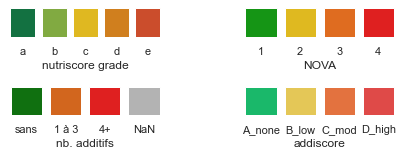

In [14]:
def plot_palettes():
    def plot_palette(palette: dict, ax=None, titre='palette', nb=0):
        pal = palette.keys()
        nb = len(pal) if nb == 0 else nb
        if ax is None:
            _, ax = plt.subplots(figsize=(nb, 1))
        g = sns.barplot(x=list(pal), y=np.ones(nb), palette=palette, ax=ax)
        g.set_xlabel(titre)
        g.axes.yaxis.set_visible(False)
        sns.despine(left=True, bottom=True)

    plt.subplots(2, 2, figsize=(7, 2))
    plot_palette(nutriscore_palette, ax=plt.subplot(3, 2, 1), titre='nutriscore grade')
    plot_palette(nova_palette, ax=plt.subplot(3, 2, 2), titre='NOVA')
    plot_palette(additive_palette, ax=plt.subplot(3, 2, 5), titre='nb. additifs')
    plot_palette(addiscore_palette, ax=plt.subplot(3, 2, 6), titre='addiscore')
    plt.subplots_adjust(wspace=0.5, hspace=0.3)

plot_palettes()
to_png('palettes de couleurs')



## 2.1 Import du dictionnaire de données

Le dictionnaire des données nettoyées a été enregistré en même temps que les données nettoyées

Il est utilisé pour assurer les données nettoyées sont interprétés correctement.


---

# 2. Import des données nettoyées

In [15]:
def drop_colonnes_sans_nom(df: pd.DataFrame):
    """Colonnes qui commencent par Unnamed sont en général les 'index' des dataframes
     produit par export pd.to_csv par défaut, sans interet"""
    unnamed_cols = list(df.columns[df.columns.str.startswith('Unnamed')])
    if len(unnamed_cols) > 0:
        return df.drop(unnamed_cols, axis=1)
    else:
        return df


In [16]:
DATA_DICT = os_path_join(OUT_FOLDER, CLEAN_DATA_DICT)
data_dict_df = (pd.read_csv(DATA_DICT, encoding='UTF-8', sep='\t')
                .pipe(drop_colonnes_sans_nom))

data_dict_df.head()


,column,count,unique,dtype,max_length
0,code,9509,9509.0,object,14.0
1,creator,9509,459.0,object,40.0
2,created_datetime,9509,NaN,datetime64[ns],NaN
3,last_modified_datetime,9509,NaN,datetime64[ns],NaN
4,product_name,9383,9918.0,object,149.0


#### 2.3.1.1 Supprime datetime types du dictionnaire

- (pd.read_csv n'accepte pas `datetime64[ns]` com dtype)


In [17]:
date_col_filter = data_dict_df['column'].str.endswith('_datetime')
date_cols = data_dict_df[date_col_filter]['column'].tolist()
print(date_cols)
data_dict_df = data_dict_df[~date_col_filter]
data_dict = dict(zip(data_dict_df['column'], data_dict_df['dtype'].values))
list(data_dict.items())[13:17]


['created_datetime', 'last_modified_datetime']


[('ingredients_that_may_be_from_palm_oil_n', 'Int64'),
 ('ingredients_that_may_be_from_palm_oil_tags', 'object'),
 ('nutriscore_score', 'float64'),
 ('nutriscore_grade', 'category')]

## 2.3.2 Import les données nettoyés 
- avec l'aide du dictionnaire de types 

In [18]:
USE_SAMPLE=True

DATA_FILE = CLEAN_DATA_SAMPLE if USE_SAMPLE else CLEAN_DATA_FILENAME 

CLEAN_DATA= os_path_join(OUT_FOLDER,DATA_FILE)

cleaned_data = pd.read_csv(CLEAN_DATA, sep='\t', header=0,
                           encoding='utf-8',
                           dtype=data_dict,
                           parse_dates=date_cols,
                           infer_datetime_format=True,
                           low_memory=True)  # Warning: dtypes

# Si on a oublié d'enregistrer les données nettoyées sans index,
# alors l'index est en colonne 'Unnamed: 0'
cleaned_data = cleaned_data.pipe(drop_colonnes_sans_nom)

In [19]:
cleaned_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9509 entries, 0 to 9508
Data columns (total 34 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   code                                        9509 non-null   object        
 1   creator                                     9509 non-null   object        
 2   created_datetime                            9509 non-null   datetime64[ns]
 3   last_modified_datetime                      9509 non-null   datetime64[ns]
 4   product_name                                9383 non-null   object        
 5   brands_tags                                 5106 non-null   object        
 6   categories_en                               4521 non-null   object        
 7   labels_en                                   2131 non-null   object        
 8   countries_en                                9484 non-null   object        
 9   ingredie

In [20]:
print(cleaned_data['nova_group'].dtype)
print(cleaned_data['nova_group'].count())
cleaned_data['nova_group'].value_counts()


category
3147


4.0    2073
3.0     695
1.0     327
2.0      52
Name: nova_group, dtype: int64

#### 2.3.2.2 Corriger le type de nova_group (pas une valeur numérique)


In [21]:
def corrigir_nova_group(df:pd.DataFrame):
    if not 'nova_group' in df.columns:
        return df
    print(df['nova_group'].dtype)
    print(df['nova_group'].count())
    # data_df['nova_group'].value_counts()
    df = df.copy()
    df['nova_group'] = df['nova_group'].astype(str)
    df['nova_group'] = df['nova_group'].str[0:1]
    df['nova_group'] = df['nova_group'].replace('n', np.nan)
    df['nova_group'] = df['nova_group'].astype('category')
    return df


cleaned_data = cleaned_data.pipe(corrigir_nova_group)
cleaned_data['nova_group'].value_counts()


category
3147


4    2073
3     695
1     327
2      52
Name: nova_group, dtype: int64

#### 2.3.2.3 Convertir les types 'category' en 'object'
- C'est plus facil de filtre sur les colonnes de category si ils sont de type objet:
- certains operations ne sont pas possible s'ils sont catégorique:
`df=df[df['categorie_colonne'].fillna('').contains('meat')]`
- à faire plus tard: refaire les filtres pour accepter les colonnes catégoriques


In [22]:
def category_to_object(df: pd.DataFrame, subset=None):
    """
    Convertir les types 'category' en 'object'
    Plus simple pour des filtres via .fillna('') qui ne fonctionne pas
    Pandas groupby drop les NaN si le type d'un colonne est category, meme avec dropna=False
       Pour faire groupby avec group NaN (ex: calcule % du total), il faut convertir type category en objet
    """
    categ_cols = df.select_dtypes('category').columns.tolist()
    print(categ_cols)
    df = df.copy()
    if not subset is None:
        # convertir en type 'object' seulement les colonnes dans subset
        categ_cols = [col for col in categ_cols if col in subset]
    for col in categ_cols:
        df[col] = df[col].astype('object')
    return df


def object_to_category(df:pd.DataFrame):
    """Convertir les colonnes catégoriques de type 'object' en 'category'"""
    categ_cols = df.columns[df.columns.str.contains(
        'grade|group', case=False, regex=True)].tolist()
    print(categ_cols)
    df = df.copy()
    for col in categ_cols:
        df[col] = df[col].astype('category')
    return df


cleaned_data = cleaned_data.pipe(category_to_object)
# cleaned_data=cleaned_data.pipe(object_to_category)

# vérifier que les 'catégories' n'ont pas changés
cleaned_data['nova_group'].value_counts()


['nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'ecoscore_grade_fr']


4    2073
3     695
1     327
2      52
Name: nova_group, dtype: int64

In [23]:
cleaned_data.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9509 entries, 0 to 9508
Columns: 34 entries, code to sodium_100g
dtypes: Int64(3), datetime64[ns](2), float64(10), object(19)
memory usage: 2.5+ MB


In [24]:
pd.set_option('display.max_columns', 200)  # pour afficher toutes les colonnes
pd.set_option('display.max_rows', 10)  # pour afficher max 10 lignes
pd.set_option('display.max_colwidth', 100)
cleaned_data.head(5)


,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,ecoscore_score_fr,ecoscore_grade_fr,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
0,4099200408484,kiliweb,2020-03-04 14:26:10,2020-03-04 14:26:12,Mayo tartar,NaN,NaN,NaN,Switzerland,NaN,<NA>,NaN,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients to be completed,Expiration date to be comp...",NaN,NaN,NaN,2431.0,62.0,6.30,4.9,3.3,NaN,0.9,0.64
1,8421395047463,kiliweb,2017-12-14 14:06:36,2017-12-14 14:06:47,Pack Chorizo,collell,NaN,NaN,France,"dedde /956 PACK CHORIZo EXTRA 3 X150g ACANTE Ingredientes: recorte@e Panceta, Carne de cerao sat...",6,"en:e202,en:e235,en:e250,en:e316,en:e450,en:e452","E202 - Potassium sorbate,E235 - Natamycin,E250 - Sodium nitrite,E316 - Sodium erythorbate,E450 -...",0,NaN,0,NaN,NaN,NaN,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",NaN,NaN,NaN,1594.0,30.9,11.50,3.7,1.8,NaN,22.0,2.28
2,2434432018698,kiliweb,2019-11-08 12:31:46,2019-11-08 15:06:37,Carpaccio de boeuf,NaN,"Meals,Meat-based products,Meals with meat,Beef dishes,Beef carpaccio",Made in France,France,NaN,<NA>,NaN,NaN,<NA>,NaN,<NA>,NaN,3.0,c,NaN,Composite foods,One-dish meals,"To be completed,Nutrition facts completed,Ingredients to be completed,Expiration date completed,...",NaN,NaN,Beef carpaccio,920.0,16.0,2.30,0.0,0.0,NaN,19.0,0.40
3,2305046006121,kiliweb,2020-10-21 12:46:45,2020-10-22 12:39:53,Lomo adobado familiar,mercadona,NaN,NaN,Spain,NaN,<NA>,NaN,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients to be completed,Expiration date to be comp...",NaN,NaN,NaN,490.0,3.6,1.38,0.8,0.5,NaN,20.4,0.68
4,5410459005122,kiliweb,2019-06-29 14:21:36,2020-02-14 10:32:41,Pâté crème,aubel,NaN,NaN,Belgium,NaN,<NA>,NaN,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients to be completed,Expiration date completed,...",NaN,NaN,NaN,1519.0,35.0,12.50,1.2,0.4,NaN,11.0,0.64


---

# 3. Analyses univariées<a name="analyses_univariees"></a>


## 3.1 Bibliothèque de fonctions communes

Cette section contient les fonctions utilisées par plusieurs analyses:
- fonctions pour 'exploser' les colonnes de tags (pays, additives_tags, categories...)
- filtres
  - par les tags plus frequents
  - par pays, année, groupe
  - par catégorie dans un liste de catégories (exemple additifs in additifs_haut_risque)
- groupe par année (effectif / fréquence / % total par année)

- tests statistiques
  - normalité 
  - homoscedascité
  - F-ANOVA / t-tests
  - H-ANOVA / U-tests  (non-parametrique)
  - Tukey analyse post hoc


### 3.1.1 Explode series/dataframe; effectif/ fréquence
- explode series / explode frame (pour les colonnes des tags)
- effectif / fréquence (filtre_par_top_freq)

In [25]:
def is_category(df: pd.DataFrame, col: str) -> bool:
    """Determiner si un variable est catégorique ou non"""
    return len(df[[col]].select_dtypes('category').columns.tolist()) > 0


cleaned_data.pipe(is_category, 'nova_group')


False

In [26]:
def explode_series(series) -> pd.Series:
    """convertir ['a,b,c','d,e','f']--> ['a','b','c','d','e','f']  """
    if series.str.contains(',').any():
        return series.str.split(',').explode()
    else:
        return series.explode()


cleaned_data['additives_en'].dropna().head(2).pipe(explode_series)


1       E202 - Potassium sorbate
1               E235 - Natamycin
1          E250 - Sodium nitrite
1      E316 - Sodium erythorbate
1            E450 - Diphosphates
                ...             
5             E270 - Lactic acid
5      E316 - Sodium erythorbate
5    E339ii - Disodium phosphate
5         E401 - Sodium alginate
5             E415 - Xanthan gum
Name: additives_en, Length: 14, dtype: object

In [27]:
def explode_frame(df: pd.DataFrame, col=None):
    """Convertir une colonne à une liste, puis exploser la dataframe sur cette colonne"""
    df = df.copy()
    if col is None:
        col = df.columns.to_list()[0]
    df[col] = df[col].str.split(',')
    return df.explode(col)

# test
(cleaned_data[['additives_tags', 'brands_tags']].dropna().head(5)
 .pipe(explode_frame, 'additives_tags')).head()


,additives_tags,brands_tags
1,en:e202,collell
1,en:e235,collell
1,en:e250,collell
1,en:e316,collell
1,en:e450,collell


In [28]:
def filtre_par_top_freq(df:pd.DataFrame, col, nb=10, others=True) -> pd.Series:
    """Filtre les registres par les plus frequent top n tags de la colonne col,
       plus les autres dans catégorie 'other'
       Marche pour colonnes categoriques et colonnes de tags
    """
    nb = max(1, nb)
    top = explode_series(df[col]).value_counts()[:nb]
    if others:
        return df[col].where(df[col].isna() | df[col].isin(top.index), other='other')
    else:
        return df[col].where(df[col].isna() | df[col].isin(top.index))

cleaned_data.pipe(filtre_par_top_freq, col='additives_tags', nb=6).value_counts()


other      1900
en:e330     124
en:e415      25
en:e322      13
en:e471      10
en:e500       2
Name: additives_tags, dtype: int64

In [29]:
def top_n_freq(df:pd.DataFrame, col, nb=10, others=True, normalize=False):
    """
    Conter la fréquence des n tags plus fréquents
    return: value_counts comme un dataframe
    """
    nb = max(1, nb)
    counts_df = (explode_series(df[col]).value_counts(normalize=normalize)
            .to_frame(name='freq')
            .rename_axis(col)
    )
    nb=min(nb,len(counts_df))
    top_n=counts_df.head(nb).copy()
    if others:
        top_n.loc['other', 'freq']= counts_df.iloc[nb:,0].sum()
    return top_n.reset_index()    


print (cleaned_data['creator'].value_counts(normalize=True)[:5])
cleaned_data.pipe(top_n_freq, col='creator', nb=5,
                  others=True, normalize=True)

kiliweb                       0.599537
usda-ndb-import               0.082028
openfoodfacts-contributors    0.080450
org-database-usda             0.068987
date-limite-app               0.015880
Name: creator, dtype: float64


,creator,freq
0,kiliweb,0.599537
1,usda-ndb-import,0.082028
2,openfoodfacts-contributors,0.080450
3,org-database-usda,0.068987
4,date-limite-app,0.015880
5,other,0.153118


### 3.1.2 Top n fréquence - bar charts


"1-1-2_Top_pays_répresentés_dans_les_produits.png"


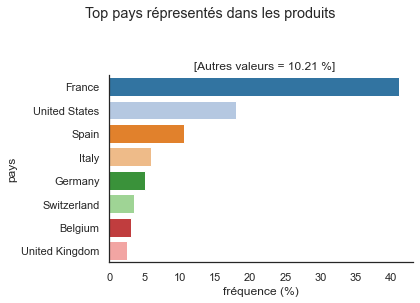

In [30]:
def plot_bar_top_n(df:pd.DataFrame, col, nb=20, others=True, normalize=False, sort_values=False, palette=None,
                   ylabel=None, titre='', soustitre=''):
    data = top_n_freq(df, col, nb, others, normalize).copy()
    # print(data.columns.to_list())
    other_count = 0
    if others:
        filter_other = data[col] == 'other'
        other_count = data[filter_other]['freq'].values.sum()
        data = data[~filter_other]
    if sort_values:
        data = data.sort_values(by=col)
    if normalize:
        ax = sns.barplot(y=data[col], x=data['freq'] * 100, palette=palette)
        ax.set_xlabel('fréquence (%)')
    else:
        ax = sns.barplot(y=data[col], x=data['freq'], palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others and (other_count > 0):
        if normalize:
            other_count = f'{other_count * 100:.2f} %'
        else: other_count=f'{int(other_count)}'     
        autres = f' [Autres valeurs = {other_count}]'
    if ylabel:
        ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre, y=1.05)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()


cleaned_data.pipe(plot_bar_top_n, col='countries_en', nb=8,
                  titre='Top pays répresentés dans les produits',
                  ylabel='pays', normalize=True)
to_png('1.1.2')


"Top_pays_répresentés_dans_les_produits_avec_info_sur_les_additifs.png"


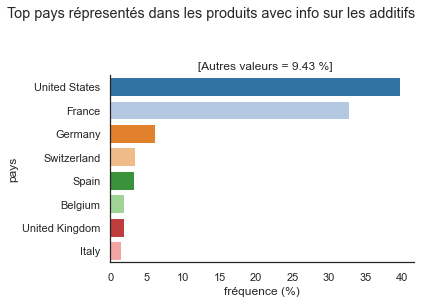

In [31]:
cleaned_data.dropna(subset=['additives_n']).pipe(plot_bar_top_n, col='countries_en', nb=8,
                                                 titre='Top pays répresentés dans les produits avec info sur les additifs',
                                                 ylabel='pays', normalize=True)
to_png()


### 3.1.3 Filtres
- colonnes dans dataframe
- filtre par tag (filtre générique)
- filtre par pays
- filtre par an
- filtre par catégorie dans une liste (multifiltre)


In [32]:
print(list(cleaned_data.columns))


['code', 'creator', 'created_datetime', 'last_modified_datetime', 'product_name', 'brands_tags', 'categories_en', 'labels_en', 'countries_en', 'ingredients_text', 'additives_n', 'additives_tags', 'additives_en', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_tags', 'nutriscore_score', 'nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'states_en', 'ecoscore_score_fr', 'ecoscore_grade_fr', 'main_category_en', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g']


In [33]:
def cols_in_df(df: pd.DataFrame, colonnes: list = None) -> list:
    """Procedure pour identifier les colonnes existantes dans le dataframe"""
    ret_cols = []
    for col in colonnes:
        if col in df.columns:
            ret_cols.append(col)
    return ret_cols


cols_in_df(cleaned_data, ['additives_tags',
                          'additives_en', 'brands', 'brands_tags'])


['additives_tags', 'additives_en', 'brands_tags']

In [34]:
def print_df_head(df, nb=10):
    """utilitaire pour imprimer dans un pipeline"""
    print (df.head(nb))
    return df

def print_df_shape(df):
    """utilitaire pour imprimer le shape dans un pipeline"""
    print (df.shape)
    return df

#### Filtre générique


In [35]:
def filter_by_tag(df: pd.DataFrame, tag_col='countries_en', tag='France'):
    return df[df[tag_col].fillna('').str.contains(tag, case=False, regex=True)]


cleaned_data.pipe(filter_by_tag, 'additives_en', 'titanium dioxide')[
    'additives_en'].count()


56

##### Couverture de brands (exemple 'Carrefour') 
"Carrefour est dédié aux grandes courses : un assortiment de **20 000 à 80 000** références de produits"

- <https://www.carrefour.com/fr/groupe/points-de-vente>

On voit que Carrefour a enregistré 1000 réferences de produits dans la base entière
- C'est la seule chaine de supermarchés qui a contribué à OpenfoodFacts à présent


In [36]:
nb_cree=cleaned_data.pipe(filter_by_tag,'creator', 'carrefour')['creator'].count()

nb_brands=cleaned_data.pipe(filter_by_tag, 'brands_tags','carrefour')['brands_tags'].count()

print (f'Carrefour: nb. produits crées: {nb_cree}; nb. brands = {nb_brands}')

Carrefour: nb. produits crées: 6; nb. brands = 113


#### Filtre par NOVA groupe

In [37]:
def filter_by_nova_group(df:pd.DataFrame, nova_group=4):
    if nova_group is None:
        return df
    return df[df['nova_group'].astype(str) == str(nova_group)]


print(cleaned_data.pipe(filter_by_nova_group, 4).shape)

(2073, 34)


#### Filtre par pays


In [38]:

def filter_by_country(df:pd.DataFrame, country='France'):
    return filter_by_tag(df, 'countries_en', tag=country)


print(cleaned_data.pipe(filter_by_country, 'France').shape)
print(cleaned_data.pipe(filter_by_country, 'United States').shape)


(4122, 34)
(1809, 34)


"Top_additifs_répresentés_dans_les_produits.png"


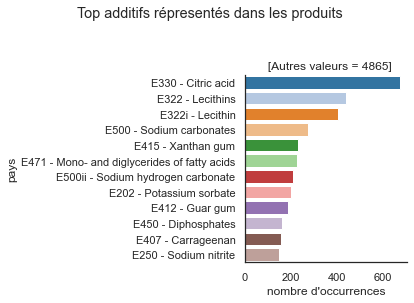

In [39]:
(cleaned_data
 .dropna(subset=['additives_n'])
 .pipe(plot_bar_top_n, col='additives_en', nb=12,
       titre='Top additifs répresentés dans les produits',
       ylabel='pays', normalize=False)
 )
to_png()


#### Filtre par an


In [40]:
from datetime import datetime


def filter_by_year(df:pd.DataFrame, start=2012, end=None, col='last_modified_datetime'):
    if end is None:
        end = start
    if end < start:
        swap = start
        start = end
        end = swap
    debut = datetime(start, 1, 1)
    fin = datetime(end + 1, 1, 1)
    return df[(df[col] >= debut) & (df[col] <= fin)]
    # plus lent :
    # return df[df[col].dt.year >=start & df[col].dt.year <=end]


def filter_by_year_last_modified(df:pd.DataFrame, start=2012, end=None):
    return filter_by_year(df, start, end, col='last_modified_datetime')


def filter_by_year_created(df:pd.DataFrame, start=2012, end=None):
    return filter_by_year(df, start, end, col='created_datetime')


cleaned_data.pipe(filter_by_year_last_modified, 2017)[
    'created_datetime'].dt.year.value_counts()


2017    157
2016     11
2015      3
2014      3
Name: created_datetime, dtype: int64

#### Filtre par catégorie in list


In [41]:
def filter_by_categorie_in(df:pd.DataFrame, categ_col='pnns_groups_1', categs=None):
    return df[df[categ_col].fillna('').isin(categs)]


cleaned_data.pipe(filter_by_categorie_in, 'pnns_groups_1',
                  ['Sugary snacks', 'Salty snacks']).shape


(943, 34)

#### Filtre par tags in list

### 3.1.4 Groupby fonctions (groupby year, ...)

In [42]:
def col_group_by_year(df: pd.DataFrame, col=None, groupby_var='nutriscore_grade', aggfunc='mean',
                      date_col='created_datetime'):
    """visualiser l'évolution dans le temps, basé sur date_col"""
    df = df.copy()
    if aggfunc in ['mean', 'max', 'min']:
        df[col] = df[col].astype(float)

    if groupby_var is None:
        groupby_year = pd.pivot_table(df,
                                      values=col,
                                      index=[df[date_col].dt.year],
                                      aggfunc={col: aggfunc},
                                      fill_value='na', margins=False, margins_name='Total', observed=False)
    else:
        groupby_year = (pd.pivot_table(df,
                                       values=col,
                                       index=[groupby_var,
                                              df[date_col].dt.year],
                                       columns=None,
                                       aggfunc={col: aggfunc},
                                       fill_value='na', margins=False, margins_name='Total', observed=False)
                        .unstack(level=0)
                        # Reduire le nombre de niveaux sur colonnes
                        .droplevel(0, axis='columns')
                        )

    return groupby_year


print('moyenne nb. additives par nutrigrade')
(
    cleaned_data.dropna(subset=['additives_n'])
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(col_group_by_year, col='additives_n', aggfunc='mean')
        .style.background_gradient().set_precision(2)
)

moyenne nb. additives par nutrigrade


nutriscore_grade,a,b,c,d,e
created_datetime,,,,,
2012,0.00,0.00,2.00,1.50,2.00
2013,0.50,1.50,2.50,2.50,2.83
2014,0.91,1.10,0.45,3.38,1.43
2015,1.05,0.58,2.93,2.33,2.29
2016,0.54,1.64,1.87,2.73,1.89
2017,0.59,1.76,1.97,2.53,3.18
2018,0.53,1.22,1.67,2.52,2.39
2019,0.61,1.39,1.66,1.64,2.03
2020,0.82,2.10,2.01,3.24,3.60


In [43]:
print('nb. produits avec additives par nutrigrade')
(
    cleaned_data.dropna(subset=['additives_n'])
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(col_group_by_year, col='additives_n', aggfunc=lambda x: (x > 0).sum())
)


nb. produits avec additives par nutrigrade


nutriscore_grade,a,b,c,d,e
created_datetime,,,,,
2012,0,0,2,1,3
2013,2,1,4,6,5
2014,2,4,2,6,5
2015,7,7,11,18,24
2016,7,13,13,29,22
2017,38,67,111,171,131
2018,13,16,52,68,48
2019,12,21,19,28,25
2020,38,57,82,158,92


### 3.1.5 Tests de normalité


In [44]:
def format_stat_p(stat, p, name=None):
    ch = f'{name} : ' if name else ''
    ch += f'stat={stat:.3f}, p={p:.3f}'
    if p < 0.001:
        ch += '***'
    elif p < 0.01:
        ch += '**'
    elif p < 0.05:
        ch += '*'
    return ch


def print_normal_stat_p(testname:str, stat:float, p:float, alpha=0.05)->None:
    """"Créer une chaine pour répondre à un test de normalité"""
    ch = format_stat_p(stat, p, testname)
    # reject H0 if p<=0.05
    if p > alpha:
        ch = f'{ch} : accept H0: probablement Gaussian'
    else:
        ch = f'{ch} : reject H0: probablement pas Gaussian'
    print(ch)

#### 3.1.5.1 Shapiro-Wilk test (sample size < 100)

In [45]:
from scipy.stats import shapiro
from scipy.stats import f_oneway


def test_shapiro(series, alpha=0.05):
    """Shapiro-Wilk test (1965)"""
    stat, p = shapiro(series)
    print_normal_stat_p(f'Shapiro-Wilk [{series.name}]', stat, p, alpha)
    return p, format_stat_p(stat, p, 'Shapiro-Wilk')


test_shapiro(cleaned_data['nutriscore_score'].dropna())


Shapiro-Wilk [nutriscore_score] : stat=0.976, p=0.000*** : reject H0: probablement pas Gaussian


(6.3557213624554254e-24, 'Shapiro-Wilk : stat=0.976, p=0.000***')

#### 3.1.5.1 Kolmogorov-Smirnov goodness of fit test
- tests the distribution F(x) of an observed random variable against the normal distribution
- can be used to test against other distributions

In [46]:
# Kolmogorov-Smirnov goodness of fit test
# tests the distribution F(x) of an observed random variable against the normal distribution
from scipy.stats import kstest


def test_kolmogorov_smirnov(series, alpha=0.05):
    stat, p = kstest(series, 'norm')
    print_normal_stat_p(f'Kolmogorov-Smirnov [{series.name}]', stat, p, alpha)
    return p, format_stat_p(stat, p, 'Kolmogorov-Smirnov')

sample_size=min(100, len(cleaned_data['nutriscore_score'].dropna()))
test_kolmogorov_smirnov(cleaned_data['nutriscore_score'].dropna().sample(sample_size))

Kolmogorov-Smirnov [nutriscore_score] : stat=0.797, p=0.000*** : reject H0: probablement pas Gaussian


(9.41891325086182e-69, 'Kolmogorov-Smirnov : stat=0.797, p=0.000***')

In [47]:
def test_normality(series, alpha=0.05):
    s = series.astype(float).dropna()
    if len(s) <3:
        # il faut au moins 3 points
        return
    if len(s) < 50:
        p, ch = test_shapiro(s)
    else:
        p, ch = test_kolmogorov_smirnov(s)
    if p > alpha:
        choix = 'accept H0: probablement Gaussian'
    else:
        choix = 'reject H0: probablement pas Gaussian'
    return p, ch, choix

nb=len(cleaned_data)
test_normality(cleaned_data['nutriscore_score'].sample(min(nb,20)))
test_normality(cleaned_data['nutriscore_score'].sample(min(nb,80)))
test_normality(cleaned_data['nutriscore_score'].sample(min(nb,800)))


Shapiro-Wilk [nutriscore_score] : stat=0.930, p=0.482 : accept H0: probablement Gaussian
Shapiro-Wilk [nutriscore_score] : stat=0.926, p=0.021* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [nutriscore_score] : stat=0.691, p=0.000*** : reject H0: probablement pas Gaussian


(2.6198426734287343e-135,
 'Kolmogorov-Smirnov : stat=0.691, p=0.000***',
 'reject H0: probablement pas Gaussian')

### 3.1.6 Tests de homoscédasticité (égalité de variance)
#### 3.1.6.1 Bartlett test (samples avec distribution normale)
#### 3.1.6.2 Levene test (samples sans distribution normale)

In [48]:
from scipy.stats import bartlett, levene


def test_bartlett(groups: list, alpha=0.05):
    """A parametric test for equality of k variances for normally distributed groups"""
    stat, p = bartlett(*groups)
    ch = format_stat_p(stat, p, 'Bartlett homoscédasticité')
    print(ch)
    if p > alpha:
        choix = 'Bartlett test, accept H0: groups have similar variance'
    else:
        choix = 'Bartlett test, reject H0: variance of groups is not equal'
    print(choix)
    return stat, p, ch, choix


def test_levene(groups: list, alpha=0.05):
    """A robust parametric test for equality of k variances when group samples are not normally distributed"""
    # *groups = list comprehension
    stat, p = levene(*groups)
    ch = format_stat_p(stat, p, 'Levene homoscédasticité')
    print(ch)
    if p > alpha:
        choix = 'Levene test, accept H0: groups have similar variance'
    else:
        choix = 'Levene test, reject H0: variance of groups is not equal'
    print(choix)
    return stat, p, ch, choix


def group_by_groups(df: pd.DataFrame, y_var: str, groups_var: str):
    data = df[[y_var, groups_var]].dropna()
    data[y_var] = data[y_var].astype(float)  # certain tests n'accepte pas type int
    groups = []
    categories = data[groups_var].unique()
    categories.sort()
    for categ in categories:
        groups.append(data[data[groups_var] == categ][y_var].rename(categ))
    return groups


def get_grp_size(groups):
    group_sizes = [len(g) for g in groups]
    return f'(n={np.sum(group_sizes)}), {group_sizes}'


def test_homoscedascity(groups: list, normality=False, alpha=0.05):
    print(f'test_homoscedascity : {get_grp_size(groups)}')
    test_fn = test_bartlett if normality else test_levene
    return test_fn(groups, alpha)


def testing_variances(df:pd.DataFrame):
    def test_homoscedascity_groupby(df, y_var, groups_var, normality=False):
        print(f'Test Homoscedascity, {y_var} grouped by {groups_var}, normality = {normality}')
        groups = group_by_groups(df, y_var, groups_var)
        return test_homoscedascity(groups, normality)


    large_sample = df[['nutriscore_score', 'nova_group']].dropna()
    large_sample = large_sample.sample(min(len(large_sample),600))
    small_sample = large_sample.sample(int(len(large_sample)/4))
    print(f'---- Small sample (n={len(small_sample)}) -----------')

    small_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', True)
    small_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', False)
    print(f'---- Large sample (n={len(large_sample)}) -----------')
    large_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', True)
    large_sample.pipe(test_homoscedascity_groupby, 'nutriscore_score', 'nova_group', False)
    return None


cleaned_data.pipe(testing_variances)

---- Small sample (n=150) -----------
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = True
test_homoscedascity : (n=150), [12, 1, 39, 98]
Bartlett homoscédasticité : stat=nan, p=nan
Bartlett test, reject H0: variance of groups is not equal
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = False
test_homoscedascity : (n=150), [12, 1, 39, 98]
Levene homoscédasticité : stat=3.812, p=0.011*
Levene test, reject H0: variance of groups is not equal
---- Large sample (n=600) -----------
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = True
test_homoscedascity : (n=600), [80, 6, 143, 371]
Bartlett homoscédasticité : stat=33.430, p=0.000***
Bartlett test, reject H0: variance of groups is not equal
Test Homoscedascity, nutriscore_score grouped by nova_group, normality = False
test_homoscedascity : (n=600), [80, 6, 143, 371]
Levene homoscédasticité : stat=16.135, p=0.000***
Levene test, reject H0: variance of groups is not equ

C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\scipy\stats\morestats.py:2468: RuntimeWarning: divide by zero encountered in true_divide
  denom = 1.0 + 1.0/(3*(k - 1)) * ((np.sum(1.0/(Ni - 1.0), axis=0)) -


### 3.1.7 Tests ANOVA (1-way)

- H0 : Les moyennes de variable quantitative y sont les mêmes entre les catégories x
- H1 : Les moyennes de variable quantitative y ne sont pas les mêmes entre les catégories x



#### 3.1.7.1 ANOVA pré-requisites
1. les observations sont independent
2. La variable dependant (y) est distribuée normalement pour chaque catégorie (Normalité)
3. L'écart-type est la même pour chaque catégorie (Homoscédasticité)

Si les 3 conditions sont valides, alors les valeurs F et p d'ANOVA sont valables.

Sinon, on essaie de faire H-ANOVA en utilisant les tests Kruskal-Wallis.

- Test de normalité : Shapiro-Wilk
- Test de homoscédasticité : Bartlett (si normalité), ou Levene(distributions pas normales)

#### 3.1.7.2 References

- <https://www.pythonfordatascience.org/anova-python/>
- <https://www.marsja.se/four-ways-to-conduct-one-way-anovas-using-python/>
- <https://www.analyticsvidhya.com/blog/2020/06/introduction-anova-statistics-data-science-covid-python/>


#### 3.1.7.3 ANOVA summary

In [49]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
from scipy.stats import probplot


def anova_table_r(df:pd.DataFrame, groups_var, y_var):
    """get ANOVA table as R like output"""
    # Ordinary Least Squares (OLS) model
    data = df[[groups_var, y_var]].dropna()

    # ols("outcome_variable ~ C(independent_variable)", data= data_frame).fit()
    model = smf.ols(f'{y_var} ~ C({groups_var})', data=data).fit()

    anova_table = sm.stats.anova_lm(model, typ=2)
    print('----ANOVA table (R like)-------')
    print(anova_table)
    print('----ANOVA summary  ------------')
    print(model.summary())
    print('----Shapiro summary  ------------')
    test_shapiro(model.resid.rename('resid'))

    _ = plt.figure(figsize=(4, 4))
    # ax = fig.add_subplot(111)

    normality_plot, stat = probplot(model.resid, plot=plt, rvalue=True)
    plt.gca().set_title("Probability plot of model residual's", fontsize=14)
    plt.show()

    return anova_table


#### 3.1.7.4 T-test
- quand il y a seulement 2 groupes d'observations qui sont distribués normalement
- Null Hypothesis H0: Les 2 groupes vient de la meme population

Si les 2 groupes ne sont pas distribués normalement, il faut utiliser un test non-parametric
- par exemple, Wilcoxon–Mann–Whitney U test

In [50]:
from scipy.stats import ttest_ind


# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.ttest_ind.html

def exemple_t_test(df:pd.DataFrame):
    """Exemple de comment faire un t-test (test normalité avant)"""

    def format_ch(p, alpha):
        if p > alpha:
            return 'accept H0: ils sont de la même population'
        else:
            return 'reject H0: ils ne sont pas la même population'

    # Suppose que la distribution de nutriscore_score est normal pour cet exemple
    group1 = df.pipe(filter_by_country, 'france')['nutriscore_score'].dropna().rename('france')
    group2 = df.pipe(filter_by_country, 'united states')['nutriscore_score'].dropna().rename('états unis')
    # Probablement la variance de nutriscore est égal pour les 2 groupes - il faut tester
    stat, p, ch, choix = test_homoscedascity([group1, group2], normality=True, alpha=0.05)
    equal_var = (p > 0.05)
    alpha = 0.05

    if equal_var:
        stat, p = ttest_ind(group1, group2, equal_var=True)
        print(f"Standard t-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")
    else:
        # T-test entre 2 groupes avec variances non-egales
        stat, p = ttest_ind(group1, group2, equal_var=False)
        print(f"Welch's t-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")


cleaned_data.pipe(exemple_t_test)

test_homoscedascity : (n=2694), [1532, 1162]
Bartlett homoscédasticité : stat=1.652, p=0.199
Bartlett test, accept H0: groups have similar variance
Standard t-test, stat=1.064, p=0.288, accept H0: ils sont de la même population


### 3.1.8 Non-parametric ANOVA (Kruskal-Wallis)

Utilise si les conditions de normalité et homoscédascité ne sont pas valides

Used to test the null hypothesis which states that ‘k’ number of samples has been drawn from the same population or the identical population with the same or identical median.

- The null hypothesis (H0): la median is equal across all groups.
- The alternative hypothesis: (H1): The median is not equal across all groups.

#### 3.1.8.1 References

- <https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kruskal.html>
- <https://www.statology.org/kruskal-wallis-test-python/>
- <https://machinelearningmastery.com/nonparametric-statistical-significance-tests-in-python/>
- <https://stats.stackexchange.com/questions/33759/do-we-need-to-report-the-median-or-the-mean-when-using-a-kruskal-wallis-test>


In [51]:
from scipy.stats import kruskal


def test_kruskal(groups: list, showsize=False):
    """Kruskal-Wallis H-test"""
    if showsize: print(f'{get_grp_size(groups)}')
    # compare samples (* = list comprehension)
    stat, p = kruskal(*groups)
    ch = format_stat_p(stat, p, 'Kruskal-Wallis H-test')
    print(ch)
    # interpret
    alpha = 0.05
    if p > alpha:
        choix = 'les médianes ne sont pas significativement différentes, (fail to reject H0)'
    else:
        choix = 'les médianes sont significativement différentes (reject H0)'
    print(choix)
    return p, ch, choix


def test_kruskal_groupby(df:pd.DataFrame, y_var, groups_var):
    print(f'Test Kruskal , {y_var} grouped by {groups_var}')
    groups = group_by_groups(df, y_var, groups_var)
    return test_kruskal(groups, True)


# cleaned_data.pipe(test_kruskal_groupby,'nutriscore_score','pnns_groups_1')
sample_size=min(200,len(cleaned_data))
cleaned_data.sample(sample_size).pipe(test_kruskal_groupby, 'nutriscore_score', 'nova_group')
_ = cleaned_data.pipe(test_kruskal_groupby, 'nutriscore_score', 'nova_group')


Test Kruskal , nutriscore_score grouped by nova_group
(n=43), [6, 13, 24]
Kruskal-Wallis H-test : stat=11.103, p=0.004**
les médianes sont significativement différentes (reject H0)
Test Kruskal , nutriscore_score grouped by nova_group
(n=2337), [266, 25, 596, 1450]
Kruskal-Wallis H-test : stat=429.423, p=0.000***
les médianes sont significativement différentes (reject H0)


#### 3.1.8.2 (Wilcoxon) Mann–Whitney U test
- quand il y a seulement 2 groupes d'observations qui ne sont pas distribués normalement
- les 2 groupes peuvent avoir n'importe quel distribution
- Null Hypothesis H0: Les 2 groupes vient de la meme population (le médiane est la même)

In [52]:
from scipy.stats import mannwhitneyu


# https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.mannwhitneyu.html

def exemple_u_test(df:pd.DataFrame):
    """Exemple de comment faire un U-test (reject normalité avant)"""

    def format_ch(p, alpha=0.05):
        if p > alpha:
            return 'accept H0: ils sont de la même population'
        else:
            return 'reject H0: ils ne sont pas la même population'

    # Suppose que la distribution de nutriscore_score est normal pour cet exemple
    group1 = df.pipe(filter_by_country, 'france')['nutriscore_score'].dropna().rename('france')
    group2 = df.pipe(filter_by_country, 'united states')['nutriscore_score'].dropna().rename('états unis')
    alpha = 0.05
    stat, p = mannwhitneyu(group1, group2)
    print(f"Mann-Whitney U-test, {format_stat_p(stat, p)}, {format_ch(p, alpha)}")


cleaned_data.pipe(exemple_u_test)

Mann-Whitney U-test, stat=911584.500, p=0.282, accept H0: ils sont de la même population


#### 3.1.8.3 Effect Size (eta-squared)
(partial) eta-carré est la proportion de la variance représentée par un facteur.

Certaines règles empiriques sont que

- η2 > 0,01 indique un petit effet
- η2 > 0,06 indique un effet moyen
- η2 > 0,14 indique un effet important

(source:<https://www.spss-tutorials.com/anova-what-is-it/>)

In [53]:
def eta_squared(x: pd.Series, y: pd.Series):
    """Calcul du Coefficient of Determination
       example:
          eta2 = eta_squared(x=df[group_var], y= df[y_var])
       x = variable catégorique, y = variable dependant
    """
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x == classe]
        # print(f'classe : {classe}, mean={yi_classe.mean()}')
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    # Total sum of squares = Somme Carré Total
    sct = sum([(yj - moyenne_y) ** 2 for yj in y])
    # Estimated sum of squares = Somme Carré Estimé
    sce = sum([c['ni'] * (c['moyenne_classe'] - moyenne_y) ** 2 for c in classes])

    # Residual sum of squares
    scr = sct - sce
    # degrees of freedom, dof (Total, Estimated, Residual)
    dof_t = y.count() - 1
    dof_e = len(classes) - 1
    dof_r = dof_t - dof_e
    f_value = (sce / dof_e) / (scr / dof_r)
    print(f'f_value: {f_value:.3f}')
    eta2 = sce / sct
    if eta2 > 0.14:
        effet = 'important'
    elif eta2 > 0.06:
        effet = 'moyen'
    elif eta2 > 0.01:
        effet = 'petit'
    else:
        effet = 'insignifiant'
    print(f'η2 = {eta2:.3f}, effet {effet}')
    return eta_squared


def test_eta_squared(df:pd.DataFrame):
    print('effet de nova_group sur nutriscore_score')
    df = df[['nutriscore_score', 'nova_group']].dropna()
    eta_squared(x=df['nova_group'], y=df['nutriscore_score'])

cleaned_data.pipe(test_eta_squared)

effet de nova_group sur nutriscore_score
f_value: 172.270
η2 = 0.181, effet important


### 3.1.9 Tukey post-hoc test

-Tukey's range test to compare means of all pairs of groups

- <https://en.wikipedia.org/wiki/Tukey%27s_range_test>


In [54]:
import statsmodels.stats.multicomp as mc


def get_pairwise_tukey_table(df:pd.DataFrame, groups_var, y_var):
    """Comparer les moyennes des groupes"""
    data = df[[groups_var, y_var]].dropna()
    print('----Tukey pairwise summary  ------------')
    print('(reject=True signifié les médianes sont différents)')
    comp = mc.MultiComparison(data[y_var], data[groups_var])
    post_hoc_res = comp.tukeyhsd()
    tukey = post_hoc_res.summary()
    return pd.DataFrame(tukey.data[1:], columns=tukey.data[0])

print('nutriscore grouped by nova group')
# cleaned_data.pipe(get_pairwise_tukey_table,y_var='nutriscore_score', groups_var='addiscore_risk',)
cleaned_data.pipe(get_pairwise_tukey_table,
                  y_var='nutriscore_score', groups_var='nova_group')


nutriscore grouped by nova group
----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)


,group1,group2,meandiff,p-adj,lower,upper,reject
0,1,2,12.2734,0.0010,7.9126,16.6341,True
1,1,3,8.1135,0.0010,6.5763,9.6506,True
2,1,4,11.9444,0.0010,10.5540,13.3349,True
3,2,3,-4.1599,0.0582,-8.4157,0.0958,False
4,2,4,-0.3290,0.9000,-4.5340,3.8761,False
5,3,4,3.8310,0.0010,2.8167,4.8453,True


#### 3.1.9.1 Tukey - Visualise les differences entre les moyennes des groupes


----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2  12.2734  0.001  7.9126 16.6341   True
     1      3   8.1135  0.001  6.5763  9.6506   True
     1      4  11.9444  0.001  10.554 13.3349   True
     2      3  -4.1599 0.0582 -8.4157  0.0958  False
     2      4   -0.329    0.9  -4.534  3.8761  False
     3      4    3.831  0.001  2.8167  4.8453   True
----------------------------------------------------
"anova_nutriscore_score_by_nova_group_pairwise_tukey.png"


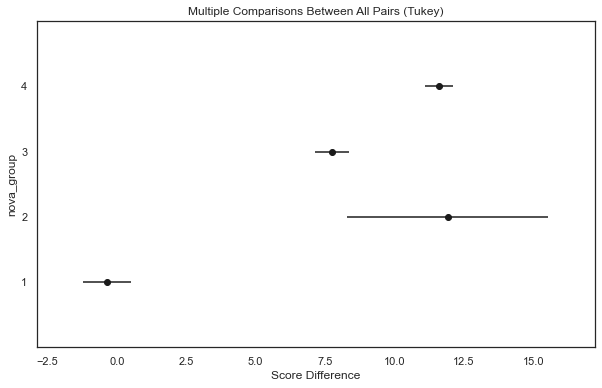

In [55]:

def plot_pairwise_tukey(df:pd.DataFrame, groups_var, y_var):
    """Comparer les moyennes des groupes"""
    data = df[[groups_var, y_var]].dropna()
    print('----Tukey pairwise summary  ------------')
    print('(reject=True signifié les médianes sont différents)')
    comp = mc.MultiComparison(data[y_var], data[groups_var])
    post_hoc_res = comp.tukeyhsd()
    print(post_hoc_res.summary())
    post_hoc_res.plot_simultaneous(
        ylabel=f'{groups_var}', xlabel=f'Score Difference')
    to_png(f'anova_{y_var}_by_{groups_var}_pairwise_tukey')
    plt.show()


cleaned_data.pipe(plot_pairwise_tukey,
                  y_var='nutriscore_score', groups_var='nova_group')



### 3.1.10 Fonctions graphiques

In [56]:

def add_text(ax, x, y, s, **kwargs):
    """Ajouter du texte à un plot"""
    ax.text(x, y, s,
            verticalalignment='bottom', horizontalalignment='left',
            transform=ax.transAxes, **kwargs)

### 3.1.11 Dictionnaires de traductions
Pour afficher les catégories d'alimentation en français 
- PNNS groups 1
- PNNS groups 2

In [57]:
pnns_1_en = list(cleaned_data['pnns_groups_1'].dropna().unique())
print(pnns_1_en)

pnns_2_en = list(cleaned_data['pnns_groups_2'].dropna().unique())
print(pnns_2_en)


['Composite foods', 'Cereals and potatoes', 'Sugary snacks', 'Fruits and vegetables', 'Milk and dairy products', 'Alcoholic beverages', 'Fish Meat Eggs', 'Salty snacks', 'Fat and sauces', 'Beverages']
['One-dish meals', 'Bread', 'Sweets', 'Vegetables', 'Milk and yogurt', 'Alcoholic beverages', 'Chocolate products', 'Fruits', 'Pizza pies and quiches', 'Processed meat', 'Legumes', 'Salty and fatty products', 'Ice cream', 'Offals', 'Dressings and sauces', 'Meat', 'Fish and seafood', 'Cheese', 'Waters and flavored waters', 'Appetizers', 'Cereals', 'Unsweetened beverages', 'Biscuits and cakes', 'Nuts', 'Fruit juices', 'Sweetened beverages', 'Artificially sweetened beverages', 'Potatoes', 'Fruit nectars', 'Dairy desserts', 'Dried fruits', 'Breakfast cereals', 'Fats', 'Plant-based milk substitutes', 'Eggs', 'Pastries', 'Sandwiches', 'Soups', 'Teas and herbal teas and coffees']


In [58]:
# Traduction Google puis figer les listes

pnns_1_en= ['Sugary snacks', 'sugary-snacks', 'Composite foods', 'Cereals and potatoes', 'Fish Meat Eggs', 'Salty snacks', 
            'Milk and dairy products', 'Fruits and vegetables', 'Fat and sauces', 'Beverages', 'Alcoholic beverages']

pnns_1_fr = ['Snacks sucrés', 'Snacks sucrés','Aliments composés','Céréales et pommes de terre','Oeufs viandes et poisson','Snacks salés',
             'Lait et produits laitiers','Fruits et légumes', 'Matières grasses et sauces','Boissons','Boissons alcoolisées']

pnns_2_en = ['Biscuits and cakes', 'Sandwiches', 'Bread', 'Sweets', 'One-dish meals', 'Fish and seafood', 'Appetizers', 'Ice cream',
             'Fruits', 'Cereals', 'Cheese', 'Pizza pies and quiches', 'Chocolate products', 'Pastries', 'Milk and yogurt', 'Processed meat', 
             'Potatoes', 'Salty and fatty products', 'Dressings and sauces', 'Dairy desserts', 'Artificially sweetened beverages', 
             'Meat', 'Fats', 'Vegetables', 'Alcoholic beverages', 'Breakfast cereals', 'Sweetened beverages', 'Eggs', 'Nuts', 'Dried fruits',
             'Soups', 'Plant-based milk substitutes', 'Fruit juices', 'Unsweetened beverages', 'Waters and flavored waters', 
             'Legumes', 'pastries', 'Offals', 'Teas and herbal teas and coffees', 'Fruit nectars']             


pnns_2_fr = ['Biscuits et gâteaux','Sandwichs','Pain', 'Confiseries','Plats simples','Poissons et fruits de mer','Apéritifs','Glaces',
             'Fruits','Céréales','Fromage', 'Pizzas et quiches','Produits chocolatés','Pâtisseries','Lait et yaourt', 'Viandes transformées',
             'Pommes de terre','Produits salés et gras','Garnitures et sauces', 'Desserts lactés','Boissons artificiellement sucrées',
             'Viande','Matières grasses','Légumes','Boissons alcoolisées','Céréales pour le petit-déjeuner',  'Boissons sucrées','Oeufs','Noix', 'Fruits secs', 
             'Soupes','Substituts de lait végétal','Jus de fruits','Boissons non sucrées', 'Eaux et eaux aromatisées',
             'Légumineuses','Pâtisseries','Abats','Thés tisanes et cafés', 'Nectars de fruits']

In [59]:
pnns1_dict = dict(zip(pnns_1_en, pnns_1_fr))
pnns2_dict = dict(zip(pnns_2_en, pnns_2_fr))
# print (pnns1_dict)
# print (pnns2_dict)

In [60]:
def traduire_categories(categories: list, feature_group=None) -> list:
    if feature_group == 'pnns_groups_1':
        return [pnns1_dict[x] for x in categories]
    else:
        # feature_group == 'pnns_groups_2':
        return [pnns2_dict[x] for x in categories]


print(traduire_categories(pnns_1_en, 'pnns_groups_1'))
print(traduire_categories(pnns_2_en))


['Snacks sucrés', 'Snacks sucrés', 'Aliments composés', 'Céréales et pommes de terre', 'Oeufs viandes et poisson', 'Snacks salés', 'Lait et produits laitiers', 'Fruits et légumes', 'Matières grasses et sauces', 'Boissons', 'Boissons alcoolisées']
['Biscuits et gâteaux', 'Sandwichs', 'Pain', 'Confiseries', 'Plats simples', 'Poissons et fruits de mer', 'Apéritifs', 'Glaces', 'Fruits', 'Céréales', 'Fromage', 'Pizzas et quiches', 'Produits chocolatés', 'Pâtisseries', 'Lait et yaourt', 'Viandes transformées', 'Pommes de terre', 'Produits salés et gras', 'Garnitures et sauces', 'Desserts lactés', 'Boissons artificiellement sucrées', 'Viande', 'Matières grasses', 'Légumes', 'Boissons alcoolisées', 'Céréales pour le petit-déjeuner', 'Boissons sucrées', 'Oeufs', 'Noix', 'Fruits secs', 'Soupes', 'Substituts de lait végétal', 'Jus de fruits', 'Boissons non sucrées', 'Eaux et eaux aromatisées', 'Légumineuses', 'Pâtisseries', 'Abats', 'Thés tisanes et cafés', 'Nectars de fruits']


## 3.2 Déscription des variables
- describe (mean, std, percentiles)
- box plots
- distribution

In [61]:
def cols_nutritionnelles(df:pd.DataFrame):
    return df.columns[(df.columns.str.endswith('_100g')) & ~(df.columns.str.contains('energy'))]


colonnes_100g = cleaned_data.pipe(cols_nutritionnelles)

### 3.2.1 Statisques descriptives (groupby, describe)

In [62]:
cleaned_data.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,ecoscore_score_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
count,3576.000000,3576.000000,3576.000000,3543.000000,2308.000000,7762.000000,7713.000000,7535.000000,7715.000000,7629.000000,2431.000000,7714.000000,7326.000000
mean,1.998043,0.021812,0.069072,9.171324,42.653813,1121.807606,13.590649,5.089500,27.722285,12.937151,2.930417,8.702741,0.541176
std,2.851621,0.149870,0.295391,8.820133,25.986346,792.266437,17.140122,7.703763,27.666031,19.255213,4.619038,9.770205,2.042305
min,0.000000,0.000000,0.000000,-14.000000,-17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,2.000000,24.000000,418.000000,0.900000,0.100000,3.400000,0.600000,0.000000,1.500000,0.035000
50%,1.000000,0.000000,0.000000,10.000000,38.000000,1059.000000,7.030000,1.900000,15.300000,3.570000,1.670000,6.000000,0.240000
75%,3.000000,0.000000,0.000000,16.000000,63.000000,1674.000000,21.430000,7.100000,52.360000,17.400000,3.600000,12.500000,0.533000
max,28.000000,2.000000,3.000000,30.000000,121.000000,3780.000000,100.000000,91.000000,100.000000,100.000000,83.300000,92.500000,80.000000


In [63]:

(cleaned_data[['additives_n','pnns_groups_1']]
.groupby('pnns_groups_1')
.describe())

additives_n                                          \
                              count      mean       std  min  25%  50%  75%   
pnns_groups_1                                                                 
Alcoholic beverages            44.0  0.477273  1.320476  0.0  0.0  0.0  0.0   
Beverages                     266.0  1.819549  2.186872  0.0  0.0  1.0  3.0   
Cereals and potatoes          288.0  1.333333  2.154325  0.0  0.0  0.0  2.0   
Composite foods               197.0  3.126904  3.705916  0.0  0.0  2.0  5.0   
Fat and sauces                224.0  1.285714  2.010861  0.0  0.0  0.0  2.0   
Fish Meat Eggs                253.0  1.747036  2.237674  0.0  0.0  1.0  3.0   
Fruits and vegetables         179.0  0.687151  1.604909  0.0  0.0  0.0  1.0   
Milk and dairy products       289.0  1.560554  2.006232  0.0  0.0  1.0  3.0   
Salty snacks                   98.0  1.081633  1.635139  0.0  0.0  0.0  2.0   
Sugary snacks                 548.0  3.260949  3.909788  0.0  1.0  2.0  4.0   

                               
                          max  
pnns_groups_1                  
Alcoholic beverages       6.0  
Beverages                10.0  
Cereals and potatoes     13.0  
Composite foods          22.0  
Fat and sauces           16.0  
Fish Meat Eggs           12.0  
Fruits and vegetables    14.0  
Milk and dairy products  11.0  
Salty snacks              7.0  
Sugary snacks            28.0

#### PNNS group 1 (par nutriscore)

In [64]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe()

pnns_groups_1                                     
                         count unique                      top freq
nutriscore_grade                                                   
a                          476      9     Cereals and potatoes  146
b                          396      9  Milk and dairy products   76
c                          624      9           Fat and sauces  101
d                          865      9            Sugary snacks  253
e                          572      9            Sugary snacks  307

➡️ Les snacks sucrés sont les plus grandes catégories dans les groupes nutriscore D et E:
- 'D' (environ 30% snacks sucrés) 
- 'E' (environ 60% snacks sucrés)

#### PNNS group 2 (par nutriscore - dans NOVA group 4)

In [65]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_nova_group, 4)[['pnns_groups_2', 'nutriscore_grade']]
 .groupby('nutriscore_grade')
 .describe()
 )

pnns_groups_2                                
                         count unique                 top freq
nutriscore_grade                                              
a                           32     11      One-dish meals   12
b                           57     19      One-dish meals   20
c                          103     26      One-dish meals   22
d                          149     23              Sweets   29
e                          136     17  Biscuits and cakes   43

#### Nombre d'additifs (par NOVA group)

In [66]:

cleaned_data[['nova_group', 'additives_n']].groupby('nova_group').describe()


additives_n                                              
                 count      mean       std  min  25%  50%  75%   max
nova_group                                                          
1                309.0  0.100324  0.331711  0.0  0.0  0.0  0.0   2.0
2                 52.0  0.134615  0.444083  0.0  0.0  0.0  0.0   2.0
3                695.0  0.433094  0.821749  0.0  0.0  0.0  1.0   7.0
4               2073.0  3.254703  3.153835  0.0  1.0  2.0  4.0  28.0

In [67]:
cleaned_data['nova_group'].value_counts(normalize=True)

4    0.658723
3    0.220845
1    0.103908
2    0.016524
Name: nova_group, dtype: float64

➡️ La groupe NOVA 4 est 60% des produits

➡️ La groupe NOVA 4 contient 10 fois plus d'additifs que groupes 1 et 2

➡️ Au moins 25% des produits contient 5 additifs ou plus, allant jusqu'à 36 additifs


### 3.2.1 Statistiques univariées 
- Mesures de moyenne, médiane, skew, kurtosis
- percentiles, quantiles, interquartile range
- Tests de normalité

#### 3.2.1.1 fat_100g

In [68]:
cleaned_data['fat_100g'].describe()

count    7713.000000
mean       13.590649
std        17.140122
min         0.000000
25%         0.900000
50%         7.030000
75%        21.430000
max       100.000000
Name: fat_100g, dtype: float64

In [69]:
print(cleaned_data['fat_100g'].skew())
print(cleaned_data['fat_100g'].kurtosis())

2.092782363477389
5.773441972748516


### 3.2.2 Boxplot univarié 
- avec tests de normalité
- fonctions pour trouver des valeurs atypiques

Kolmogorov-Smirnov [additives_n] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
"Boxplot_pour_variable_additives_n.png"


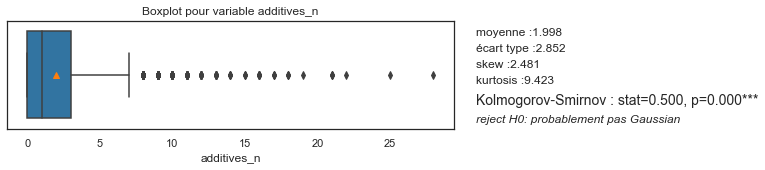

In [70]:
def plot_box(df:pd.DataFrame, col, showstats=False):
    plt.figure(figsize=(8, 2))
    ax = sns.boxplot(data=df, x=col, showmeans=True, showfliers=True)
    plt.title(f'Boxplot pour variable {col}')
    if showstats:
        add_text(ax, x=1.05, y=0.85, s=f'moyenne :{df[col].mean():.3f}')
        add_text(ax, x=1.05, y=0.7, s=f'écart type :{df[col].std():.3f}')
        add_text(ax, x=1.05, y=0.55, s=f'skew :{df[col].skew():.3f}')
        add_text(ax, x=1.05, y=0.4, s=f'kurtosis :{df[col].kurtosis():.3f}')
        p, ch, choix = test_normality(df[col])
        add_text(ax, x=1.05, y=0.20, s=ch, fontsize=14)
        add_text(ax, x=1.05, y=0.05, s=choix, style='italic')


plot_box(cleaned_data, 'additives_n', showstats=True)
to_png()

### 3.2.3 Analyse d'outliers (valeurs atypiques)

In [71]:
def get_valeurs_atypiques(df:pd.DataFrame, col, nb=10, random_state=None):
    desc = df[col].describe()
    q1 = desc['25%']  # df[col].quantile(0.25)
    median = desc['50%']  # df[col].quantile(.50)
    q3 = desc['75%']  # df[col].quantile(.75)
    iqr = (q3 - q1)
    max_val = min(desc['max'], q3 + 1.5 * iqr)
    # print(desc)
    # print(f'Q1 (25%) : {q1}')
    # print(f'médiane : {median}')
    # print(f'Q3 (75%) : {q3}')
    print(f'outliers [{col}] vals > {max_val:.2f}')
    outliers = df[df[col] > max_val]
    nb = min(len(outliers), nb)
    if nb > 0:
        print(outliers.sample(nb, random_state=random_state)['product_name'].to_list())


cleaned_data.pipe(get_valeurs_atypiques, 'additives_n', nb=10, random_state=1)

outliers [additives_n] vals > 7.50
['Brownie cheesecake', 'Ultimate meat pizza', '5" White Grad Cake', 'Biber for Kids (Coop)', "Devil's food donut holes", 'Fruity pops', 'Chocolate chip muffins', 'Mini muffins chocolat', 'Mini Beignets caramel', 'Crisp corn snacks']


#### Outliers - Nutriscore A avec beaucoup d'additifs
- un sandwich de poulet peut avoir > 10 additifs

In [72]:
(cleaned_data[cleaned_data['additives_n'] > 10]
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_tag, 'nutriscore_grade', 'a')
 )

,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,ecoscore_score_fr,ecoscore_grade_fr,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g


#### Outliers - valeurs nutritionnelles
- Quelle sont les produits avec valeurs atypiques dans chaque colonne nutritionnelle ?

In [73]:

print(list(colonnes_100g))
for col in colonnes_100g:
    print(f'------------------------------------')
    cleaned_data.pipe(get_valeurs_atypiques, col, nb=5, random_state=1)

['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g']
------------------------------------
outliers [fat_100g] vals > 52.23
['24 Cans Red Feather Creamery Butter From New Zealand', 'Aceite de oliva virgen extra El Parrite', 'Mantequilla artesanal', 'Aceite refinado de girasol', 'Organic tartar sauce']
------------------------------------
outliers [saturated-fat_100g] vals > 17.60
['Spread vegano', 'Chocolate negro con fresa', "Fondue Chocolats Favoris- saveur de S'Mores", 'Davidstow Cornish Cheddar Matire', 'Mousse, Milk Chocolate With Mousse Filling, Yogurt']
------------------------------------
outliers [carbohydrates_100g] vals > 100.00
------------------------------------
outliers [sugars_100g] vals > 42.60
['Medjoul dates', 'Bonbons fils gélifiés qui piquent', 'Amarula', 'Medjool dates, organic', 'Margarita cocktail mixers']
------------------------------------
outliers [fiber_100g] vals > 9.00
['Muesli Energético', '

### 3.2.4 Distributions univariées avec tests de normalité

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.740, p=0.000*** : reject H0: probablement pas Gaussian
"distribution_nutriscore_stats.png"


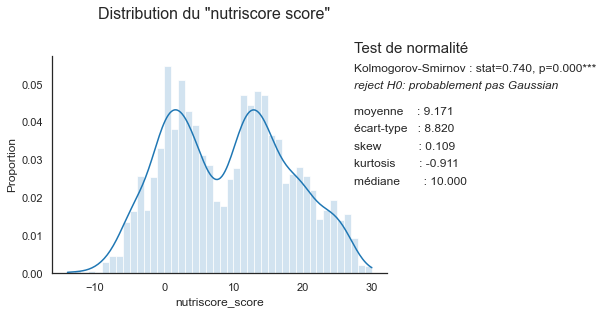

In [74]:
def plot_histogram(df:pd.DataFrame, col, color=None, ax=None, showstats=False, binwidth=None):
    print(f'Plot Histogram for column {col}')
    series: pd.Series = df[col].astype(float).dropna()
    if ax is None:
        plt.figure()
        ax = plt.gca()
    ax = sns.histplot(series, ax=ax, color=color, kde=True, binwidth=binwidth,
                      alpha=0.2, stat='proportion', legend=True)
    ax.set_xlabel(series.name)
    if showstats:
        p, ch, choix = test_normality(series)
        add_text(ax, 0.9, 1, 'Test de normalité', fontsize=15)
        add_text(ax, 0.9, 0.92, ch)
        add_text(ax, 0.9, 0.84, choix, style='italic')
        add_text(ax, 0.9, 0.72, f'moyenne    : {series.mean():.3f}')
        add_text(ax, 0.9, 0.64, f'écart-type   : {series.std():.3f}')
        add_text(ax, 0.9, 0.56, f'skew           : {series.skew():.3f}')
        add_text(ax, 0.9, 0.48, f'kurtosis       : {series.kurtosis():.3f}')
        add_text(ax, 0.9, 0.40, f'médiane       : {series.median():.3f}')
    sns.despine()


cleaned_data.pipe(plot_histogram, 'nutriscore_score', showstats=True, binwidth=1)
plt.suptitle('Distribution du "nutriscore score"', size=16, y=1.05)
to_png('distribution_nutriscore_stats')

#### 3.2.4.1 Histograms pour toutes les colonnes numériques
- change à `plot_all=True` pour générer les diagrammes pour toutes les colonnes numériques

In [75]:
colonnes_numeriques = list(cleaned_data.select_dtypes('number').columns)
print(colonnes_numeriques)

plot_all = False
if plot_all:
    for col in colonnes_numeriques:
        plot_histogram(cleaned_data, col)
        to_png(f'distribution_{col}_stats')
        plt.show()

['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'nutriscore_score', 'ecoscore_score_fr', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g']


### 3.2.5 Effectif et fréquence
- effectif : df[col].value_counts(normalize=False)
- fréquence : df[col].value_counts(normalize=True)


In [76]:
def count_freq(df:pd.DataFrame, col):
    """Calculer l'effectif ET la fréquence en même temps"""
    s = df[col]
    effectif = s.value_counts()
    total = effectif.sum()
    # frequence = s.value_counts(normalize=True)
    frequence = effectif.div(total)
    percent100 = frequence.mul(100).round(1).astype(str) + '%'
    return (pd.DataFrame({'effectif': effectif, 'freq': frequence, 'per100': percent100})
            .rename_axis(col)
            .reset_index())


(cleaned_data
 .pipe(filtre_par_top_freq, col='creator', nb=10)
 .to_frame(name='creator')
 .pipe(count_freq, col='creator')
 )


,creator,effectif,freq,per100
0,kiliweb,5701,0.599537,60.0%
1,other,1020,0.107267,10.7%
2,usda-ndb-import,780,0.082028,8.2%
3,openfoodfacts-contributors,765,0.080450,8.0%
4,org-database-usda,656,0.068987,6.9%
...,...,...,...,...
6,elcoco,135,0.014197,1.4%
7,foodvisor,122,0.012830,1.3%
8,inf,71,0.007467,0.7%
9,openfood-ch-import,62,0.006520,0.7%


In [77]:


cleaned_data.pipe(top_n_freq, col='creator', nb=10)


,creator,freq
0,kiliweb,5701.0
1,usda-ndb-import,780.0
2,openfoodfacts-contributors,765.0
3,org-database-usda,656.0
4,date-limite-app,151.0
...,...,...
6,foodvisor,122.0
7,inf,71.0
8,openfood-ch-import,62.0
9,sebleouf,46.0


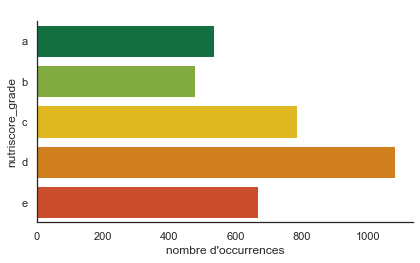

In [78]:
plot_bar_top_n(cleaned_data, 'nutriscore_grade', others=False,
               sort_values=True, palette=nutriscore_palette)


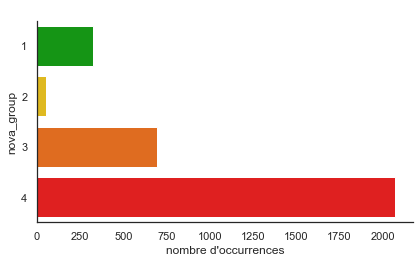

In [79]:
plot_bar_top_n(cleaned_data, 'nova_group', others=False,
               sort_values=True, palette=nova_palette)


## 3.3 Contributions sur le temps

- Nombre de registres créés / modifiés dans le temps
- Par contributeur dans le temps


### 3.3.1 Nombre de registres créés / modifiés dans le temps


In [80]:
date_cols=cleaned_data[['created_datetime', 'last_modified_datetime', 'creator', 'countries_en']].copy()
date_cols.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9509 entries, 0 to 9508
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   created_datetime        9509 non-null   datetime64[ns]
 1   last_modified_datetime  9509 non-null   datetime64[ns]
 2   creator                 9509 non-null   object        
 3   countries_en            9484 non-null   object        
dtypes: datetime64[ns](2), object(2)
memory usage: 297.3+ KB


Crée une colonne pour indiquer le nombre de jours entre création et la dernière modification

In [81]:

def create_column_days_diff(df:pd.DataFrame):
    df = df.copy()
    # convert time delta (discrete, in ns) to continuous (float)
    df['days_diff'] = (
            (df['last_modified_datetime'] - df['created_datetime'])
            / np.timedelta64(1, 'D')
    )
    return df

date_cols = date_cols.pipe(create_column_days_diff)

# get maximum date difference
date_cols.sort_values(by='days_diff', ascending=False).head()


,created_datetime,last_modified_datetime,creator,countries_en,days_diff
8214,2012-03-18 15:16:10,2021-09-22 10:30:42,stephane,France,3474.801759
1810,2012-05-16 23:49:22,2021-09-11 13:43:16,stephane,"France,Switzerland",3404.579097
7112,2012-06-02 11:42:12,2021-09-26 16:48:04,arthurlutz,"France,Portugal,Russia,Spain,Sweden,United Kingdom",3403.212407
1141,2012-10-08 21:52:29,2021-09-09 12:23:25,javichu,Spain,3257.604815
5625,2012-09-16 17:10:01,2021-07-17 06:11:02,stephane,France,3225.542373


In [82]:
date_cols.describe(datetime_is_numeric=True).style.set_precision(2)

,created_datetime,last_modified_datetime,days_diff
count,9509,9509,9509.00
mean,2019-06-03 12:32:13.143337984,2020-07-23 00:28:00.494689024,415.50
min,2012-03-18 15:16:10,2014-01-11 16:50:59,0.00
25%,2018-04-12 06:15:43,2020-02-27 00:44:29,0.00
50%,2019-10-03 11:39:18,2020-09-12 20:06:39,125.58
75%,2020-10-20 00:05:37,2021-05-01 11:15:17,721.97
max,2021-10-19 23:11:37,2021-10-19 23:11:38,3474.80
std,nan,nan,551.09


➡️ 75% des données ont été crée depuis 2018


➡️ Au moins 25% des données n'ont jamais était modifiés

"date_diff_displot.png"


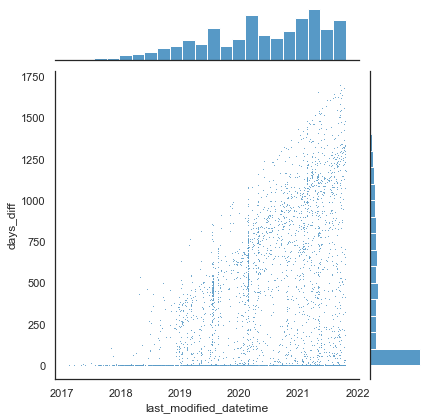

In [83]:
def plot_dist_date_diff(df:pd.DataFrame):
    # sns.displot(df,x='days_diff')
    sns.jointplot(data=df[['last_modified_datetime', 'days_diff']].dropna(
    ), x='last_modified_datetime', y='days_diff', s=1)


(date_cols
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'creator', 'kiliweb')
 .pipe(plot_dist_date_diff)
 )
to_png('date_diff_displot')

IntervalIndex([(-0.1, 2e-05], (2e-05, 125.6], (125.6, 722.0], (722.0, 3474.8]], dtype='interval[float64, right]')
"date_created_hue_day_diff_displot.png"


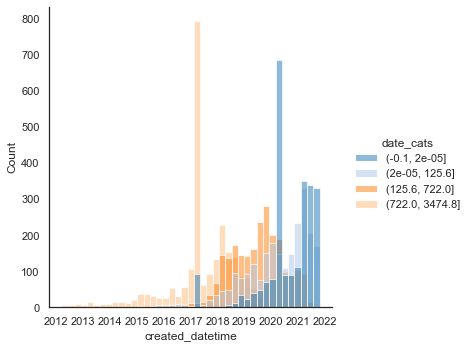

In [84]:
date_cols['date_cats'] = pd.qcut(
    date_cols['days_diff'], 4, precision=0, duplicates='drop')
print(date_cols['date_cats'].cat.categories)

sns.displot(data=date_cols, x='created_datetime', hue='date_cats')
to_png('date_created_hue_day_diff_displot')


### 3.3.2 Principaux contributeurs par année

"contributeurs_over_time_displot_creator.png"


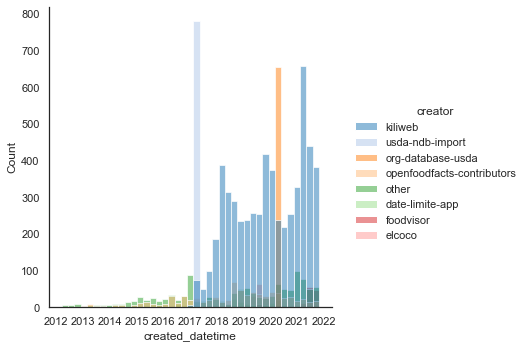

In [85]:
def contrib_over_time(df:pd.DataFrame, nb=7):
    top_contrib = pd.concat([
        df.pipe(filtre_par_top_freq, 'creator', nb=nb),
        df['created_datetime']
    ], axis=1)
    sns.displot(data=top_contrib, x='created_datetime', hue='creator')
    return top_contrib


contributeurs_over_time = date_cols.pipe(contrib_over_time, 7)
to_png('contributeurs_over_time_displot_creator')


On regarde chaque contributeur séparément :

"contributeurs_over_time_facetgrid_creator.png"


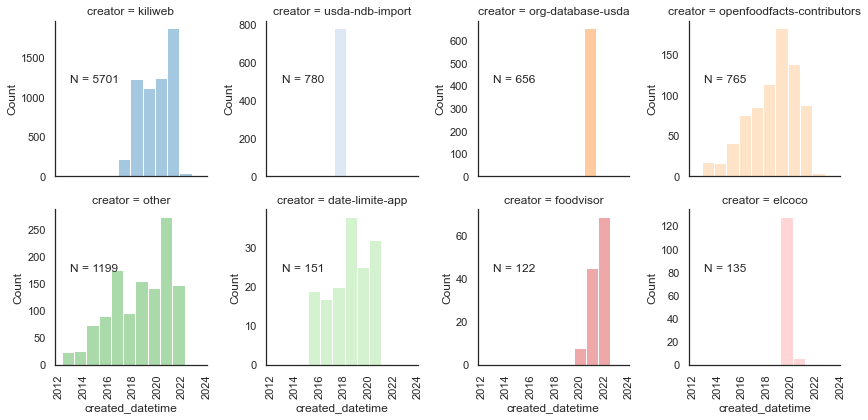

In [86]:
def plot_over_time(df:pd.DataFrame, col):
    def annotate(data, **kws):
        n = len(data)
        ax = plt.gca()
        ax.text(.1, .6, f"N = {n}", transform=ax.transAxes)
    df=df[['created_datetime',col]].dropna()
    g = sns.FacetGrid(df, hue=col, col=col, col_wrap=4,
                      sharex=True, sharey=False)
    # binwidth = 1 an 
    g.map(sns.histplot, "created_datetime", binwidth=365, alpha=.4)
    g.set_xticklabels(rotation=90)
    g.map_dataframe(annotate)


contributeurs_over_time.pipe(plot_over_time, 'creator')
to_png('contributeurs_over_time_facetgrid_creator')


"contributeurs_over_time_facet_grid.png"


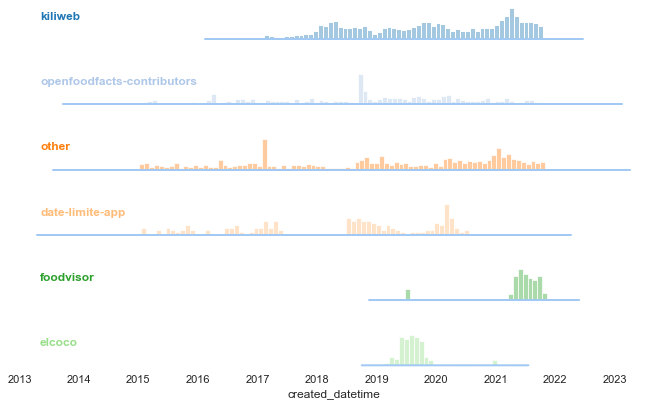

In [87]:
from dateutil import parser


def plot_contributeurs_facet(df:pd.DataFrame):
    df=df[['created_datetime','creator']].dropna()
    datefrom = parser.parse('01/01/2015', ignoretz=True)
    filtre1 = df['created_datetime'] > datefrom
    filtre = df['creator'].str.contains('usda|import', regex=True)
    g = sns.FacetGrid(df[filtre1 & ~filtre], row="creator", hue='creator',
                      aspect=10, height=1, sharey=False)
    # Draw the densities in a few steps
    g.map(sns.histplot, "created_datetime", alpha=.4, binwidth=30, clip_on=False)
    g.map(sns.kdeplot, "created_datetime", clip_on=False, color="b", lw=2)

    # Define and use a simple function to label the plot in axes coordinates
    def annotate(x, color, label):
        ax = plt.gca()
        ax.text(0.05, .7, label, fontweight="bold", color=color,
                ha="left", va="center", transform=ax.transAxes)

    g.map(annotate, 'created_datetime')

    # Supprime détail
    g.set_titles("")
    g.set(yticks=[], ylabel="")
    g.despine(bottom=True, left=True)
    plt.gcf().title = 'Distribution des contributions sur le temps'


contributeurs_over_time.pipe(plot_contributeurs_facet)
to_png('contributeurs_over_time_facet_grid')

Supprime datasets temporaraires

In [88]:
del contributeurs_over_time
del date_cols


### 3.3.3 Fréquence par année (groupé par nutrigrade, groupe NOVA, nombre d'additifs)


In [89]:
def count_freq_by_year(df:pd.DataFrame, groupby_var, date_col='last_modified_datetime'):
    count_by_year = (
        df[[groupby_var, date_col]]
            .groupby(by=[groupby_var, df[date_col].dt.year]).count()
    )
    freq_by_year = (count_by_year
                    .groupby(level=1)
                    .apply(lambda x: 100 * x / float(x.sum()))
                    # .rename(columns={date_col:groupby_var})
                    )

    return freq_by_year.unstack(level=0).droplevel(0, axis=1)


cleaned_data.pipe(count_freq_by_year, groupby_var='nutriscore_grade').style.set_precision(2)

nutriscore_grade,a,b,c,d,e
last_modified_datetime,,,,,
2014,nan,nan,100.00,nan,nan
2015,25.00,8.33,16.67,8.33,41.67
2016,11.76,11.76,5.88,23.53,47.06
2017,13.33,13.33,20.00,33.33,20.00
2018,12.62,11.65,17.48,41.75,16.50
2019,12.10,11.24,25.07,31.99,19.60
2020,16.87,12.16,21.40,30.01,19.56
2021,13.57,15.97,23.02,30.23,17.21


In [90]:
def pivot_freq(df:pd.DataFrame, col='nova_group', groupby_var='nutriscore_grade', date_col='last_modified_datetime'):
    if col == 'nova_group':
        df=df.copy()
        df[col]=df[col].astype(float)
    if col == groupby_var:
        piv_index = [df[date_col].dt.year]
    else:
        piv_index = [groupby_var, df[date_col].dt.year]
    addx: pd.DataFrame = (pd.pivot_table(df,
                                         columns=[col],
                                         index=piv_index,
                                         aggfunc={
                                             col: ['count', 'mean']
                                         },
                                         )
                          #  fill_value=None, margins=False, dropna=False, margins_name='All', observed=False, sort=True)
                          )

    # addx[(col,'freq')]=addx[(col,'count')].astype(float)/addx[(col,'len')].astype(float)
    return addx


cleaned_data.pipe(pivot_freq)

nova_group                         \
                                             count                   mean   
nova_group                                     1.0  2.0   3.0    4.0  1.0   
nutriscore_grade last_modified_datetime                                     
a                2015                          3.0  NaN   NaN    NaN  1.0   
                 2016                          1.0  NaN   1.0    NaN  1.0   
                 2017                          2.0  NaN   NaN    1.0  1.0   
                 2018                          2.0  NaN   7.0    NaN  1.0   
                 2019                          7.0  NaN  12.0    6.0  1.0   
...                                            ...  ...   ...    ...  ...   
e                2017                          NaN  NaN   3.0    3.0  NaN   
                 2018                          NaN  NaN   NaN    9.0  NaN   
                 2019                          NaN  2.0   4.0   28.0  NaN   
                 2020                          5.0  1.0  42.0  215.0  1.0   
                 2021                          1.0  3.0  22.0  110.0  1.0   

                                                        
                                                        
nova_group                               2.0  3.0  4.0  
nutriscore_grade last_modified_datetime                 
a                2015                    NaN  NaN  NaN  
                 2016                    NaN  3.0  NaN  
                 2017                    NaN  NaN  4.0  
                 2018                    NaN  3.0  NaN  
                 2019                    NaN  3.0  4.0  
...                                      ...  ...  ...  
e                2017                    NaN  3.0  4.0  
                 2018                    NaN  NaN  4.0  
                 2019                    2.0  3.0  4.0  
                 2020                    2.0  3.0  4.0  
                 2021                    2.0  3.0  4.0  

[36 rows x 8 columns]

### 3.3.4 Top pays (nombre de produits)


"Produits_par_pays.png"


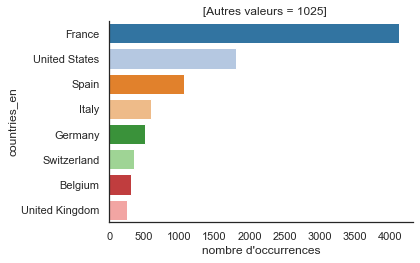

In [91]:
def plot_produits_par_pays(df:pd.DataFrame):
    plot_bar_top_n(df, 'countries_en', nb=8)


cleaned_data.pipe(plot_produits_par_pays)
to_png('Produits_par_pays')


## 3.4 Distribution des données (manquantes)

Cette section analyse:
 - les colonnes avec des données manquantes
 - les principaux contributeurs des données pour chaque colonne 


**Note :** Les données nettoyées ont toujours des données manquantes après :
  - suppression de produits sans nom
  - suppression de produits non alimentaires
  - suppression de doublons
  - imputation des valeurs nutritionnelles / nutriscore
  - suppression des lignes sans ingredients

Voir P3_nettoyage.ipynb section 4.5 pour plus de détails

### 3.4.1 Matrix de missingno 

"Valeurs_manquantes_(données_nettoyés).png"


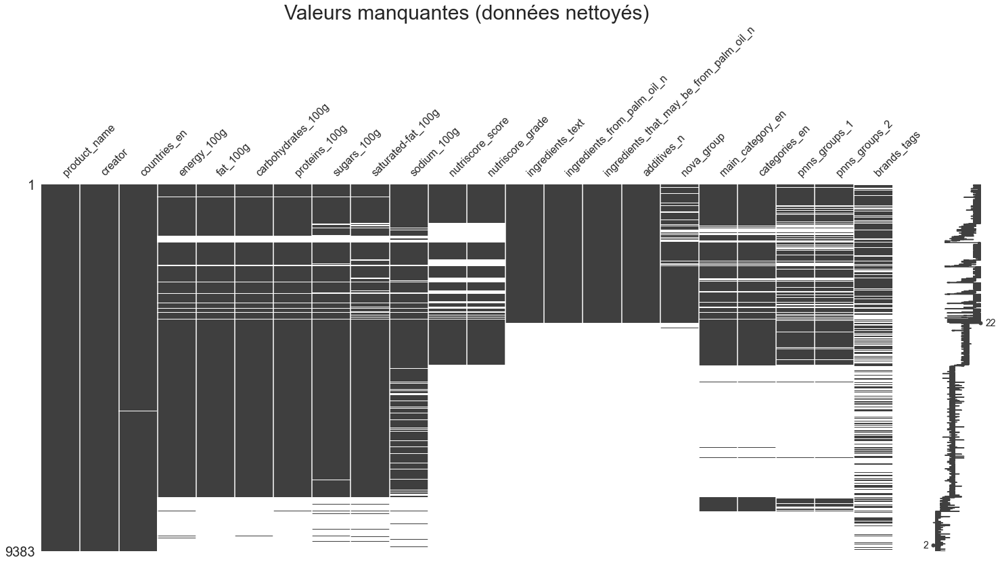

In [92]:
import missingno as msno


def sort_by_priority(df: pd.DataFrame):
    return (df.dropna(subset=['product_name'])
            .sort_values(by=['additives_n', 'nutriscore_score', 'fat_100g', 'main_category_en'])
            )


analyse_cols = ['product_name',
                'creator', 'countries_en',
                # colonnes nutritionnelles
                'energy_100g', 'fat_100g', 'carbohydrates_100g', 'proteins_100g', 'sugars_100g', 'saturated-fat_100g',
                'sodium_100g',
                'nutriscore_score', 'nutriscore_grade',
                'ingredients_text', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                'additives_n',
                'nova_group',
                'main_category_en', 'categories_en',
                'pnns_groups_1', 'pnns_groups_2',
                'brands_tags'
                ]

msno.matrix(cleaned_data[analyse_cols].pipe(sort_by_priority))
plt.title('Valeurs manquantes (données nettoyés)', size=30)
to_png()

"Valeurs_manquantes_-_(creator_=_usda-ndb-import).png"


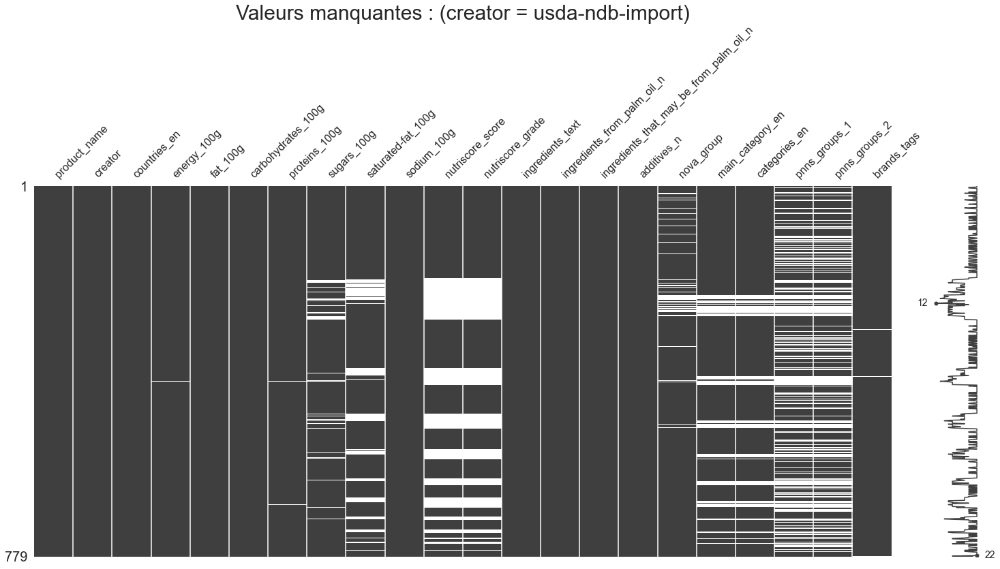

In [93]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'creator', 'usda-ndb-import')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes : (creator = usda-ndb-import)', size=30)
to_png()

"Valeurs_manquantes_-_France.png"


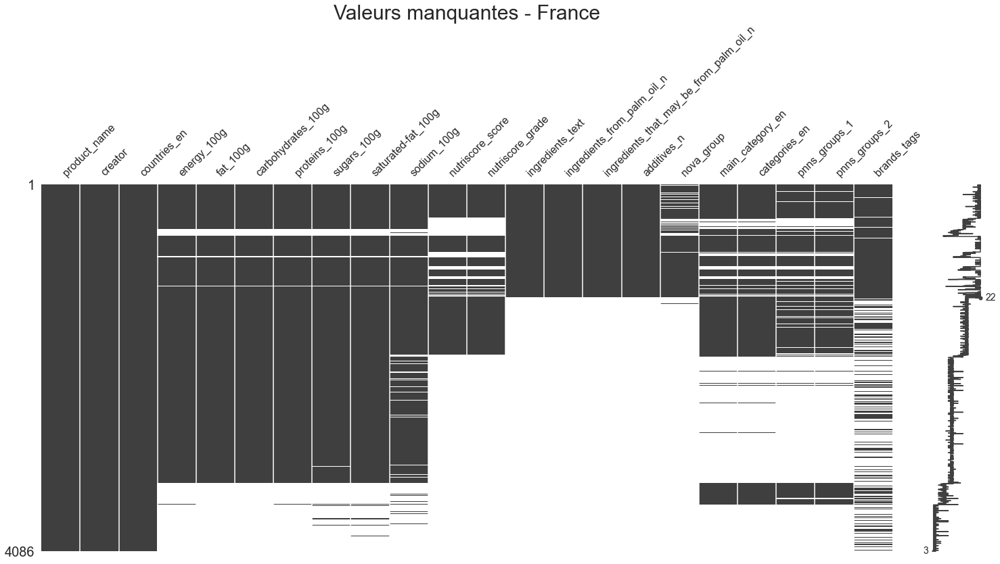

In [94]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'countries_en', 'france')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes - France', size=30)
to_png()

"Valeurs_manquantes_-_Etats_Unis.png"


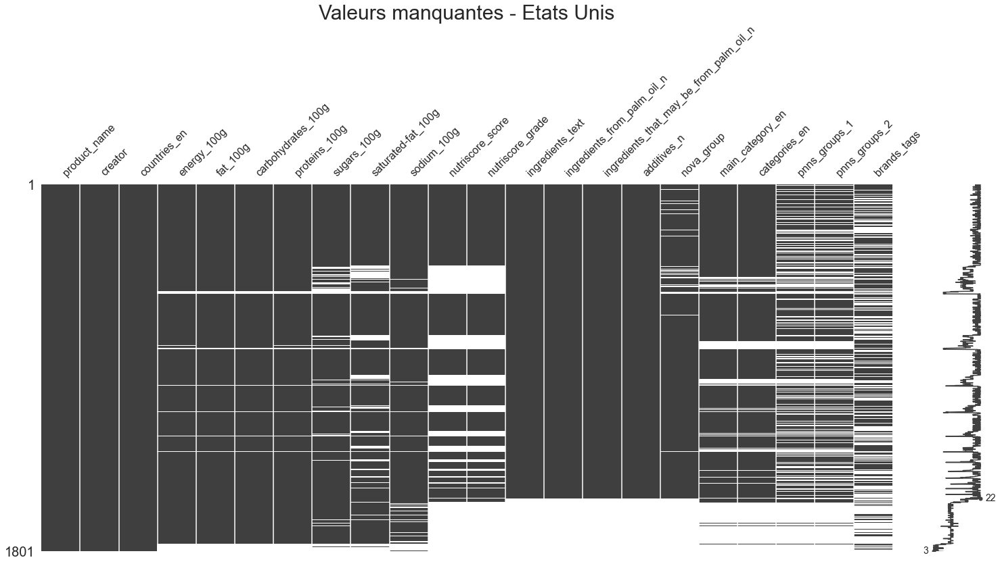

In [95]:
msno.matrix(cleaned_data
            .pipe(filter_by_tag, 'countries_en', 'united states')[analyse_cols]
            .pipe(sort_by_priority))
plt.title('Valeurs manquantes - Etats Unis', size=30)
to_png()

### 3.4.2 Top contributeurs - pie charts

In [96]:
def plot_top_contributeurs(df:pd.DataFrame, nb=7, for_column='creator', palette=None):
    
    column_exists = (for_column in df.columns)
    print(f'plot_top_contributeurs for {for_column} (column_exists={column_exists})')
    top_contributeurs = df.dropna(subset=[for_column]).pipe(
        top_n_freq, col='creator', nb=nb, others=True)
    nb = min(nb + 1, len(top_contributeurs))  # nb + 'others'
    top_contributeurs = top_contributeurs.head(nb).sort_values(by='freq', ascending=False)
    contributeurs = top_contributeurs['creator'].tolist()
    colors = sns.color_palette("tab20").as_hex()

    # reutilise la palette du dernier pie pour pouvoir comparer les pies,
    # sans changer la couleur de chaque contributeur
    if palette is None:
        palette = dict(zip(contributeurs, colors[:nb]))
    for creator in contributeurs:
        keys = list(palette.keys())
        if not (creator in keys):
            n = len(keys) % 20
            palette[creator] = colors[n]

    colors = [palette[col] for col in contributeurs]
    labels = (top_contributeurs['creator']
        # pass normalize=True to top_n_freq to display freq as frequency
        # +  ' (' + (round(top_contributeurs['freq']*1000)/10).astype(str)+'%)'
        )
    wedges, texts, autotexts = plt.pie(
        data=top_contributeurs, x='freq', colors=colors, autopct="%.1f%%",
         explode=[0.05] * nb, pctdistance=1.2)
    plt.suptitle(
        f'Principaux contributeurs (colonne "{for_column}")', fontsize=16, y=1.05)
    plt.legend(wedges, labels, title=f'contributeur',
               bbox_to_anchor=(1.0, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.subplots_adjust(left=0.0, bottom=0.1, right=0.4)

    return palette


# reinitialise la palette à utiliser
contributeur_palette = None


#### 3.4.2.1 Contributeurs - nombre de produits créés
- Tous pays
- France
- Etats Unis

plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_all_created.png"


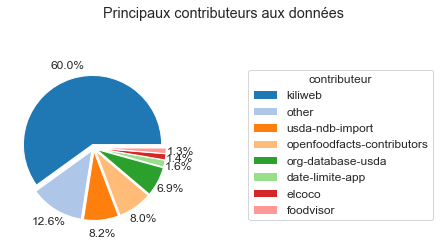

In [97]:
contributeur_palette = (cleaned_data
                        .pipe(plot_top_contributeurs, nb=7, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données")
to_png('principaux_contributeurs_pie_all_created')


plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_france_created.png"


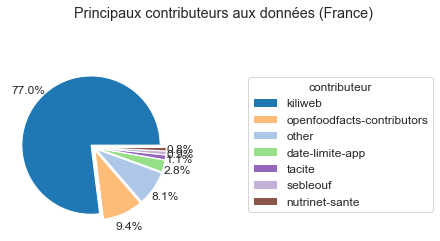

In [98]:
contributeur_palette = (cleaned_data.pipe(filter_by_country, 'France')
                        .pipe(plot_top_contributeurs, nb=6, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données (France)")
to_png('principaux_contributeurs_pie_france_created')


plot_top_contributeurs for creator (column_exists=True)
"principaux_contributeurs_pie_usa_created.png"


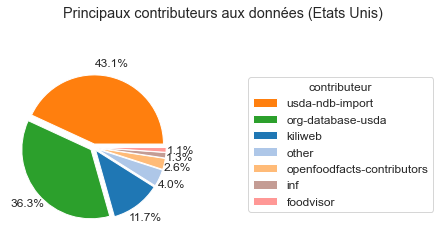

In [99]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'United States')
                        .pipe(plot_top_contributeurs, nb=6, palette=contributeur_palette))
plt.suptitle("Principaux contributeurs aux données (Etats Unis)")
to_png('principaux_contributeurs_pie_usa_created')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_all_additives.png"


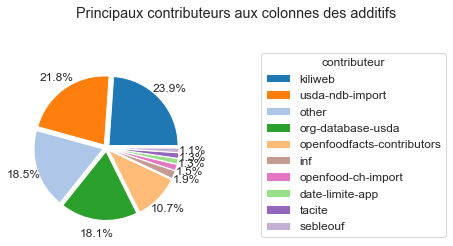

In [100]:

contributeur_palette = (cleaned_data
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=9, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs')
to_png('principaux_contributeurs_pie_all_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_france_additives.png"


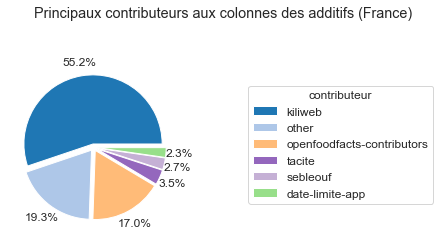

In [101]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'France')
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=5, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (France)')
to_png('principaux_contributeurs_pie_france_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_usa_additives.png"


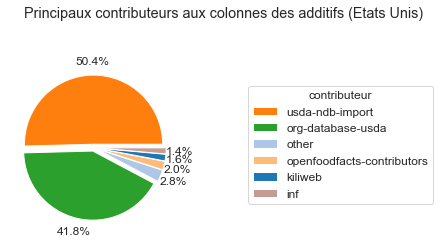

In [102]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'United States')
                        .pipe(plot_top_contributeurs, for_column='additives_n',
                              nb=5, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Etats Unis)')
to_png('principaux_contributeurs_pie_usa_additives')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_spain_additives.png"


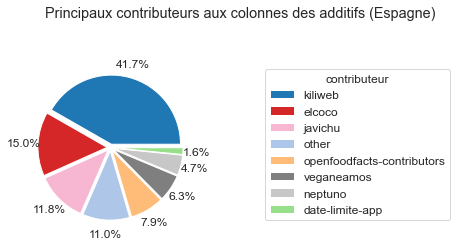

In [103]:
contributeur_palette = (cleaned_data.pipe(filter_by_country, 'Spain')
                        .pipe(plot_top_contributeurs, for_column='additives_n', nb=7, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Espagne)')
to_png('principaux_contributeurs_pie_spain_additives')

plot_top_contributeurs for brands_tags (column_exists=True)
"principaux_contributeurs_pie_brands.png"


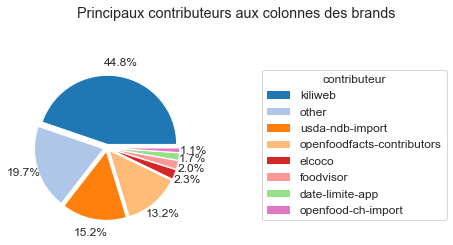

In [104]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='brands_tags', nb=7, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux colonnes des brands')
to_png('principaux_contributeurs_pie_brands')


plot_top_contributeurs for energy_100g (column_exists=True)
"principaux_contributeurs_pie_nutrition_values.png"


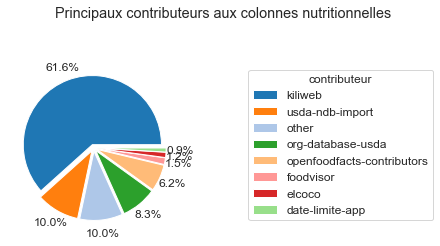

In [105]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='energy_100g', nb=7, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux colonnes nutritionnelles')
to_png('principaux_contributeurs_pie_nutrition_values')


plot_top_contributeurs for labels_en (column_exists=True)
"principaux_contributeurs_pie_labels_en.png"


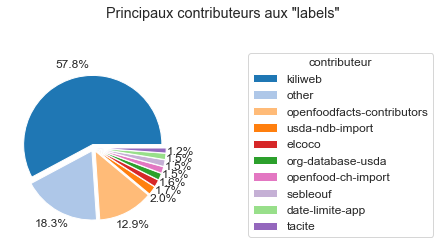

In [106]:

contributeur_palette = cleaned_data.pipe(
    plot_top_contributeurs, for_column='labels_en', nb=9, palette=contributeur_palette)
plt.suptitle('Principaux contributeurs aux "labels"')
to_png('principaux_contributeurs_pie_labels_en')


plot_top_contributeurs for additives_n (column_exists=True)
"principaux_contributeurs_pie_germany_additives.png"


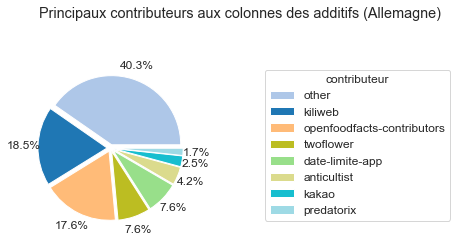

In [107]:

contributeur_palette = (cleaned_data.pipe(filter_by_country, 'Germany')
                        .pipe(plot_top_contributeurs, for_column='additives_n', nb=7, palette=contributeur_palette))
plt.suptitle('Principaux contributeurs aux colonnes des additifs (Allemagne)')
to_png('principaux_contributeurs_pie_germany_additives')

### 3.4.3 Conclusion
   - Les données manquantes varient par pays
   - La plupart des données en Europe vient des apps de chaque pays
   - Yuka App (Kiliweb) fourni 75% des données de France, mais seulement 24% des données des additifs
   - Si on analyse que les données de France, on perd presque 70% des informations sur les additifs


## 3.5 Intersections des données

### 3.5.1 Visualise intersection de tags (venn diagram)

Objectif: voir s'il y a des correlations entre les tags :
- produits commun à plusieurs pays
- additifs qui se trouvent ensembles
- corrélations entre labels (exemple 'bio' et 'organic') 
- les top catégories trouvés ensembles

Il est très compliqué de faire des corrélations entre des tags :

- il faut 'exploser' la colonne
- filtre sur les top 100 tags
- faire un crosstab sur les top tags
- faire des correlations sur ce crosstab

La plupart des colonnes de tags contient plus de 40000 tags
Avec 2 millions de registres, ça prend beaucoup de memoire et beaucoup de temps

Donc, on regarde simplement les top 3 tags

In [108]:
def calc_tag_intersections(df:pd.DataFrame, tag_col, tag1=None, tag2=None, tag3=None):
    """calculer les co-occurences (intersections) de 2 ou 3 tags dans une colonne"""
    data = df[[tag_col]].dropna()
    if tag1 is None:
        [tag1, tag2, tag3] = (explode_series(data[tag_col])
                              .value_counts()
                              .index[:3].to_list())
        titre = f'Nombre de top 3 tags dans colonne "{tag_col}"'
    else:
        titre = f'Nombre de tags sélectionnés dans colonne "{tag_col}"'
    has_tag1 = data[tag_col].str.contains(tag1)
    has_tag2 = data[tag_col].str.contains(tag2)
    c100 = sum(has_tag1)
    c010 = sum(has_tag2)
    c110 = sum(has_tag1 & has_tag2)
    print(titre)
    print(f'{tag1} : {c100} produits')
    print(f'{tag2} : {c010} produits')

    if tag3 is None:
        print(f'{tag1} & {tag2} : {c110} produits')
    else:
        has_tag3 = data[tag_col].str.contains(tag3)
        c001 = sum(has_tag3)
        c101 = sum(has_tag1 & has_tag3)
        c011 = sum(has_tag2 & has_tag3)
        c111 = sum(has_tag1 & has_tag2 & has_tag3)
        print(f'{tag3} : {c001} produits')
        print(f'{tag1} & {tag2} : {c110} produits')
        print(f'{tag1} & {tag3} : {c101} produits')
        print(f'{tag2} & {tag3} : {c011} produits')
        print(f'{tag1} & {tag2} & {tag3} : {c111} produits')

cleaned_data.pipe(calc_tag_intersections, 'countries_en',
                  'France', 'United States')
plt.show()

Nombre de tags sélectionnés dans colonne "countries_en"
France : 4122 produits
United States : 1809 produits
France & United States : 25 produits


In [109]:
cleaned_data.pipe(calc_tag_intersections, 'countries_en')
plt.show()


Nombre de top 3 tags dans colonne "countries_en"
France : 4122 produits
United States : 1809 produits
Spain : 1061 produits
France & United States : 25 produits
France & Spain : 57 produits
United States & Spain : 2 produits
France & United States & Spain : 1 produits


In [110]:
cleaned_data.pipe(calc_tag_intersections, 'main_category_en')

Nombre de top 3 tags dans colonne "main_category_en"
Snacks : 154 produits
Confectioneries : 83 produits
Biscuits : 95 produits
Snacks & Confectioneries : 0 produits
Snacks & Biscuits : 0 produits
Confectioneries & Biscuits : 0 produits
Snacks & Confectioneries & Biscuits : 0 produits


In [111]:
cleaned_data.pipe(calc_tag_intersections, 'additives_en')

Nombre de top 3 tags dans colonne "additives_en"
E330 - Citric acid : 673 produits
E322 - Lecithins : 438 produits
E322i - Lecithin : 406 produits
E330 - Citric acid & E322 - Lecithins : 96 produits
E330 - Citric acid & E322i - Lecithin : 95 produits
E322 - Lecithins & E322i - Lecithin : 406 produits
E330 - Citric acid & E322 - Lecithins & E322i - Lecithin : 95 produits


In [112]:
cleaned_data.pipe(calc_tag_intersections, 'labels_en')

Nombre de top 3 tags dans colonne "labels_en"
Organic : 760 produits
EU Organic : 458 produits
Vegetarian : 194 produits
Organic & EU Organic : 458 produits
Organic & Vegetarian : 67 produits
EU Organic & Vegetarian : 52 produits
Organic & EU Organic & Vegetarian : 52 produits


### 3.5.2 Conclusion

- ➡️ Les données de chaque pays ont très peu d'intersection avec d'autres pays
- ➡️ Pour utiliser les données de plusieurs pays, il faut être sûr que les données vient de la même population (moyennes et variance)

## 3.6 Effet de suppression des données manquantes sur les distributions

- On ne peut pas imputer les données manquantes, car ça modifie les distributions de nutriscore et valeurs nutritionnelles



### 3.6.1 Si on supprime les données manquants, quel est l'effet sur les distributions?

On peut si les produits sans information sur les additifs, le groupe NOVA ou le Nutriscore

Notre objectif est de 
- remplacer le NOVA score `[nova_group]` et le nombre d'additifs `[additives_n]` par l'ADDISCORE

Il faut comparer les colonnes `nutriscore_score`, `nova_group` et `additives_n`

Avant de supprimer les produits avec données manquantes dans ces colonnes, il faut verifier que les produits qui restent sont répresentatif de la population.


### 3.6.2 Hypothese : Est-ce que les données avec additifs sont répresentatives de la population ?

- H0 - les données avec additifs ont la même nutriscore distribution que les données sans information
- H1 - les données avec additifs ne sont pas de la même population

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.735, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(SANS_additif_info).png"


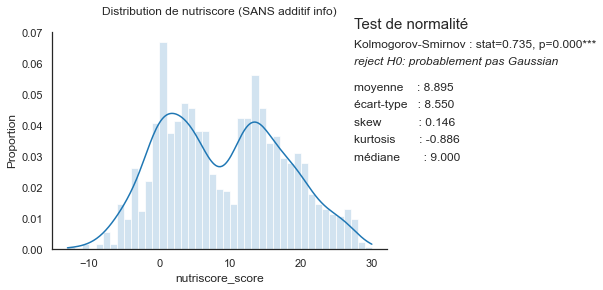

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.742, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(AVEC_additif_info).png"


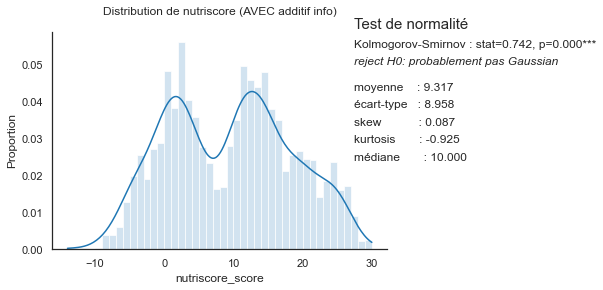

(n=3543), [1223, 2320]
Kruskal-Wallis H-test : stat=1.188, p=0.276
les médianes ne sont pas significativement différentes, (fail to reject H0)


In [113]:
def test_nutriscore_avec_sans_additif_info(df: pd.DataFrame):
    filtre = df['additives_n'].isnull() | df['nova_group'].isnull() | df['nutriscore_score'].isnull()
    sans_additif_info = df[filtre][['nutriscore_score']].dropna()
    avec_additif_info = df[~filtre][['nutriscore_score']].dropna()
    # Test de normality
    plot_histogram(sans_additif_info, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (SANS additif info)', y=1.05)
    to_png()
    plt.show()
    plot_histogram(avec_additif_info, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (AVEC additif info)',y=1.05)
    to_png()
    plt.show()

    groups = [
        sans_additif_info['nutriscore_score'].rename('SANS additif info'),
        avec_additif_info['nutriscore_score'].rename('AVEC additif info'),
    ]
    test_kruskal(groups, showsize=True)
    # stat,p=mannwhitneyu(x=groups[1],y=groups[2])


cleaned_data.pipe(test_nutriscore_avec_sans_additif_info)



#### 3.6.2.1 ➡️ Données sans additifs très similaires aux données avec additifs
- Les nutriscores ne sont pas distribuées normalement
- Les distributions sont très similaires
- La médiane est identique
- La test Kruskal-Wallis est significatif (reject H0)

La nutriscore des produits sans info additifs est légèrement plus haut (9.4 versus 8.9)
- données sans info d'additifs sont un peu moins gras, sucré ou salé
- peut-être sont les fromages, viandes, gateaux artisanaux ?

On conclut qu'on peut supprimer les données sans additifs, et que la relation entre additifs et nutriscore applique à tous les produits

À faire, si besoin sur les 2 groupes :
- tester si la proportion de NOVA 4 est la même
- tester si la distribution entre PNNS groupes est la même

#### 3.6.2.2 Supprime les données sans information sur les additifs de la base de données
- L'analyse des données manquantes et analyse d'intersections des données est terminé
- on peut supprimer les données sans informations sur les additifs

In [114]:
print(f'Données nettoyés : {cleaned_data.shape}')
cleaned_data = cleaned_data.dropna(
    subset=['additives_n']
)
print(f'Données nettoyés pour analyse des additifs : {cleaned_data.shape}')

Données nettoyés : (9509, 34)
Données nettoyés pour analyse des additifs : (3576, 34)


### 3.6.3 Les données sans/avec NOVA groupe sont-ils representatives de la population ?

- H0 - les données avec NOVA groupe ont la même nutriscore distribution que les données sans information
- H1 - les données avec NOVA groupe ne sont pas de la même population

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.536, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(SANS_NOVA_group).png"


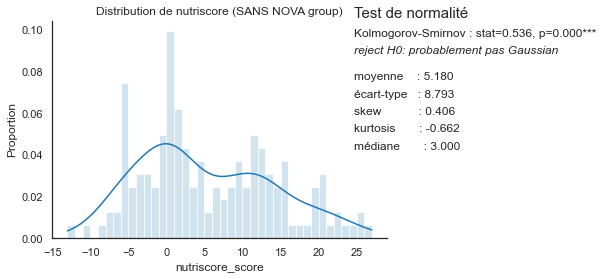

Plot Histogram for column nutriscore_score
Kolmogorov-Smirnov [nutriscore_score] : stat=0.742, p=0.000*** : reject H0: probablement pas Gaussian
"Distribution_de_nutriscore_(AVEC_NOVA_group).png"


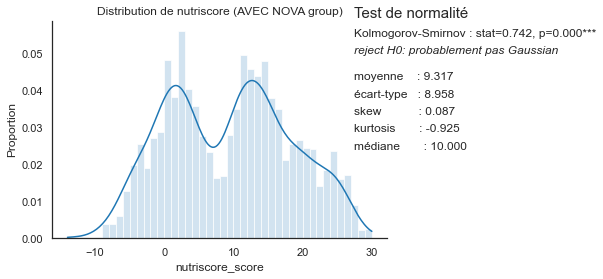

(n=2481), [161, 2320]
Kruskal-Wallis H-test : stat=31.943, p=0.000***
les médianes sont significativement différentes (reject H0)


In [115]:
def test_nutriscore_avec_sans_nova_group(df: pd.DataFrame):
    sans_nova_group = df[df['nova_group'].isnull()][['nutriscore_score']].dropna()
    avec_nova_group = df[df['nova_group'].notnull()][['nutriscore_score']].dropna()
    # Test de normality
    plot_histogram(sans_nova_group, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (SANS NOVA group)')
    to_png()
    plt.show()
    plot_histogram(avec_nova_group, 'nutriscore_score', binwidth=1, showstats=True)
    plt.title('Distribution de nutriscore (AVEC NOVA group)')
    to_png()
    plt.show()

    groups = [
        sans_nova_group['nutriscore_score'].rename('SANS nova_group'),
        avec_nova_group['nutriscore_score'].rename('AVEC nova_group'),
    ]
    test_kruskal(groups, showsize=True)


cleaned_data.pipe(test_nutriscore_avec_sans_nova_group)



#### 3.7.2.1 ➡️ Données sans nova groupe très similaires aux données avec nova_group
- Les nutriscores ne sont pas distribuées normalement
- Les distributions sont très similaires
- La médiane est identique
- La test Kruskal-Wallis est significatif (reject H0)

La nutriscore des produits sans nova_group est légèrement plus bas (8.8 versus 9.2)
- données sans nova_group sont un peu moins gras, sucré ou salé
- à faire : identifier pourquoi

On conclut qu'on peut supprimer les données sans nova_group, car ils changent très peu la nutriscore de tous les produits

À faire, si besoin sur les 2 groupes :
- tester si la distribution entre PNNS groupes est la même

## 3.7 Conclusion
Basée sur la distribution des nutriscores:
- ➡️ Les données de tous les pays peuvent être intégrés
- ➡️ Supprimer (au lieu d'imputer) les registres avec données manquantes (nombre d'additifs, nutriscore, ou groupe nova) 
 pour preserver la distribution des nutriscores 

## 3.8 Supprimer au lieu d'imputer les valeurs manquantes 
- (additifs_n, nutriscore, groupe NOVA)

In [116]:
cleaned_data= cleaned_data.dropna(subset=['additives_n', 'nutriscore_score', 'nova_group'], how='any')

---

# 4. Analyses multivariées

## 4.1 Analyses sur le nombre d'additifs

#### 4.1.1 Nombre d'additifs par nutriscore (scatterplot)

"regression_additives_n_vs_nutriscore_score_hue_None_lmplot.png"


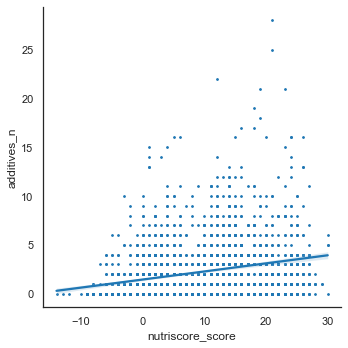

In [117]:
def plot_reg(df:pd.DataFrame, x_var='nutriscore_score', y_var='additives_n', hue='nova_group',
             nb=7, size=3, alpha=1):
    """
    Régression de 2 variables, x et y.
    Si hue est fourni, l'analyse bivariée est répetée pour chaque catégorie de hue
    """
    if hue is None:
        df2 = df[[x_var, y_var]].dropna(subset=[x_var, y_var])
    else:
        df2 = df[[x_var, y_var, hue]].dropna(subset=[x_var, y_var])
    df2[x_var] = df2[x_var].astype(np.float64)
    df2[y_var] = df2[y_var].astype(np.float64)
    if hue is None:
        g = sns.lmplot(data=df2, x=x_var, y=y_var,
                       scatter_kws={'s': size, 'alpha': alpha})
        hue = 'None'
    else:
        hue_palette = get_palette_df(df, feature=hue, nb=nb)
        hue_order = list(hue_palette.keys())
        g = sns.lmplot(data=df2, x=x_var, y=y_var,
                       hue=hue, hue_order=hue_order, palette=hue_palette,
                       #    x_jitter=0.2,y_jitter=0.2,
                       scatter_kws={'s': size, 'alpha': alpha})
        leg = g._legend
        # # coordinates of lower left of bounding box
        leg.set_bbox_to_anchor([1.1, 0.8])
        leg._loc = 6  # center left
        for lh in g._legend.legendHandles:
            lh.set_alpha(1)
            lh._sizes = [50]
            # plt.tight_layout()
    to_png(f'regression_{y_var}_vs_{x_var}_hue_{hue}_lmplot')

# sns.regplot(data=cleaned_data[['nutriscore_score', 'additives_n']].astype(np.float64),
#              x='nutriscore_score', y='additives_n',
#                        scatter_kws={'s': 3, 'alpha': 0.5})
sample_size=min(10000,len(cleaned_data))
cleaned_data.sample(sample_size).pipe(plot_reg, hue=None)


### 4.1.2 Box-plot groupé par catégorie (avec tests statistiques)
- version univariée est `plot_box(df,col)`

In [118]:
def plot_box_groupby(df:pd.DataFrame, y_var, groups_var, showfliers=True,
                     showstats=True, showtukey=False, showmeans=True):
    """P"""

    data = df[[groups_var, y_var]].dropna()
    data[y_var] = data[y_var].astype(float)
    palette = get_palette(groups_var)
    if palette is None:
        order = data[groups_var].value_counts().index.to_list()
    else:
        order = list(palette.keys())
        order.sort()
    ax = sns.boxplot(data=data, x=groups_var, y=y_var,
                     showmeans=True,
                     showfliers=showfliers,
                     palette=palette, order=order)
    ax.set_title(f'box plot de {y_var} by {groups_var}')
    sns.despine()
    if showstats:
        # Groupes
        groups = []
        categories = data[groups_var].dropna().unique()
        categories.sort()
        for categ in categories:
            groups.append(data[data[groups_var] == categ][y_var].rename(categ))

        # Normalité
        x = 1.1
        y = 1
        add_text(ax, x - 0.05, y, 'Tests de normalité des distributions', fontsize=15)
        normality = True
        y -= 0.08
        for grp in groups:
            p, ch, choix = test_normality(grp)
            if showmeans:
                add_text(ax, x, y, f'{grp.name} (mean:{grp.mean():.2f}, std:{grp.std():.2f}): {ch}')
            else:
                add_text(ax, x, y, f'{grp.name} : {ch}')
            y -= 0.08
            if p < 0.05:
                normality = False
        add_text(ax, x, y, style='italic',
                 s=f"La variable dependant ({y_var}) {('est' if normality else 'nʼest pas')} distribuée normalement")
        y -= 0.08
        add_text(ax, x, y, style='italic',
                 s=f" pour chaque groupe dans {groups_var}.")

        # Homoscédasticité
        y -= 0.12
        add_text(ax, x - 0.05, y, 'Test de homoscédasticité', fontsize=15)
        y -= 0.08
        stat, p, ch, choix = test_homoscedascity(groups, normality)
        add_text(ax, x, y, ch)
        y -= 0.08
        add_text(ax, x, y, style='italic', s=choix)

        alpha = 0.05
        homoscedascity = p > alpha
        if homoscedascity:

            # F-ANOVA
            y -= 0.12
            add_text(ax, x - 0.05, y, 'Test F-ANOVA (1-way)', fontsize=15)
            y -= 0.08
            stat, p = f_oneway(*groups)
            ch = format_stat_p(stat, p, 'F test')
            add_text(ax, x, y, ch)

        else:
            # H-ANOVA
            y -= 0.12
            add_text(ax, x - 0.05, y, 'Test H-ANOVA (Kruskal-Wallis)', fontsize=15)
            y -= 0.08
            p, ch, choix = test_kruskal(groups)
            add_text(ax, x, y, ch)
            y -= 0.08
            add_text(ax, x, y, choix, style='italic')

        if showtukey:
            y -= 0.12
            add_text(
                ax, x - 0.05, y, 'Pairwise Tukey HSD test (honestly significant difference)', fontsize=15)
            y -= 0.08
            results = get_pairwise_tukey_table(data, groups_var, y_var)
            results = results[results['reject'] == True]
            ch = ''
            for i in range(len(results)):
                row = results.iloc[i, :]
                ch += f"[{row['group1']}, {row['group2']}] p={row['p-adj']:.3f}; "
                if len(ch) > 10:
                    add_text(ax, x, y, ch)
                    y -= 0.08
                    ch = ''
            return results

### 4.1.2 Moyenne nombre d'additifs par nutrigrade par an (line plot)

In [119]:
def plot_column_agg_by_nutriscore_grade(df:pd.DataFrame, col='additives_n', aggfunc='mean', ylabel='moyenne', titre='',
                                        soustitre=''):
    data = (col_group_by_year(
        df, date_col='last_modified_datetime', col=col, aggfunc=aggfunc)
    )

    g = sns.relplot(data=data, kind="line",
                    palette=nutriscore_palette, linewidth=3)
    leg = g._legend
    leg.set_title('nutriscore grade')
    # # coordinates of lower left of bounding box
    leg.set_bbox_to_anchor([1.1, 0.8])
    leg._loc = 1  # upper right
    ax = plt.gca()
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


### 4.1.3 Nombre d'additifs (moyenne) par nutriscore grade par an (lineplot)

"Moyenne_nombre_d'additifs_par_produit_(France).png"


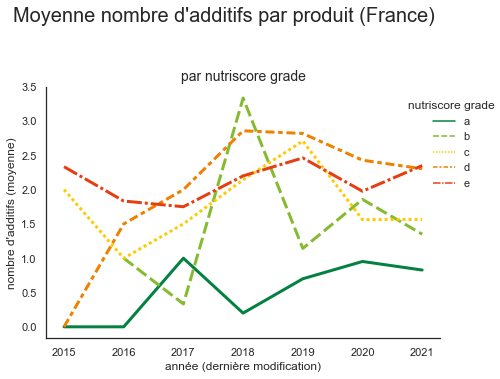

In [120]:

(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_agg_by_nutriscore_grade,
       col='additives_n',
       aggfunc='mean',
       ylabel="nombre d'additifs (moyenne)",
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='par nutriscore grade'
       )
 )
to_png()


### Pourcent des produits avec additifs (by tag col)

filtre:

- avec/sans additifs
- avec/sans additifs de risque modéré
- avec/sans additifs de risque élevé
- avec/sans huile de palme


"pourcent_produits_avec_additifs_(France).png"


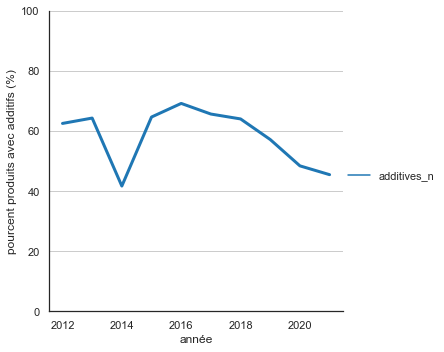

In [121]:
def percent_with_additives(series: pd.Series):
    # series=series.dropna()
    return (series > 0).count() / len(series)


def plot_freq_additives_by_year(df: pd.DataFrame, col='additives_n', groupby_var='nutriscore_grade', aggfunc='mean', date_col='created_datetime'):
    """Visualiser l'évolution dans le temps, basé sur date_col"""
    with_additives = df.pipe(col_group_by_year, groupby_var=groupby_var,
                             col=col, aggfunc=lambda x: (x > 0).sum(), date_col=date_col)
    # print(no_additives.head())
    totals = df.pipe(col_group_by_year, groupby_var=groupby_var,
                     col=col, aggfunc=len, date_col=date_col)
    # print(totals.head())
    frequency = with_additives / totals * 100
    g = sns.relplot(data=frequency, kind="line",
                    palette=get_palette(groupby_var), linewidth=3)
    ax = plt.gca()
    ax.set_ylim(0, 100)
    ax.set_xlabel('année')
    ax.set_ylabel('pourcent produits avec additifs (%)')
    ax.yaxis.grid(True)  # Hide the horizontal gridlines
    # ax.xaxis.grid(True) # Show the vertical gridlines
    return frequency


(
    cleaned_data.dropna(
        subset=['additives_n', 'nutriscore_grade', 'nova_group'])
        .pipe(filter_by_country, 'France')
        # .pipe(filter_by_year_created,2018,2019)
        .pipe(plot_freq_additives_by_year, groupby_var=None)
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)
to_png("pourcent produits avec additifs (France)")


"Pourcentage_de_produits_avec_additifs_(France).png"


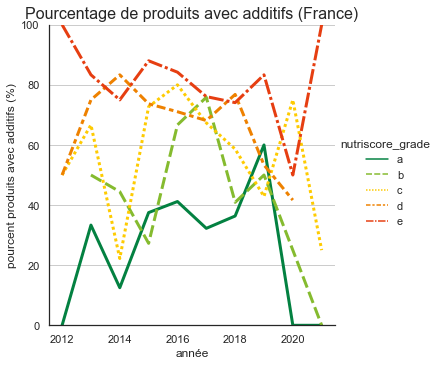

In [122]:
(cleaned_data
        .pipe(filter_by_country, 'France')
        .pipe(plot_freq_additives_by_year, groupby_var='nutriscore_grade', date_col='created_datetime')
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)

plt.title('Pourcentage de produits avec additifs (France)', size=16)
sns.despine()
to_png()


"pourcent_produits_avec_additives_-_NOVA_group_(France).png"


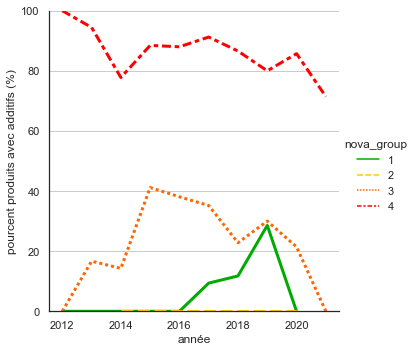

In [123]:
(
    cleaned_data.dropna(
        subset=['additives_n', 'nutriscore_grade', 'nova_group'])
        .pipe(filter_by_country, 'France')
        .pipe(plot_freq_additives_by_year, groupby_var='nova_group')
    # .pipe(col_group_by_year,col='additives_n',aggfunc=lambda x: (x==0).sum())
)
to_png("pourcent produits avec additives - NOVA group (France)")


### 4.1.2 Fréquence (distribution) de nombre d'additifs par nutriscore grade


In [124]:
def plot_column_mean_by_tag(df:pd.DataFrame, col='additives_n', titre='', soustitre=''):
    data = (col_group_by_year(df, date_col='last_modified_datetime', col=col, aggfunc='mean')
            .droplevel(0, axis='columns'))
    ax = data.plot(kind='line', color=nutriscore_palette.values())
    # ax = sns.relplot(data=data, kind="line", color=nutriscore_palette.values())
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    plt.legend(title=f'nutriscore grade',
               bbox_to_anchor=(1.1, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()

#### Nombre d'additifs (huile de palme)

"additifs_huile_de_palme_par_produit_-_Nutriscore_(France).png"


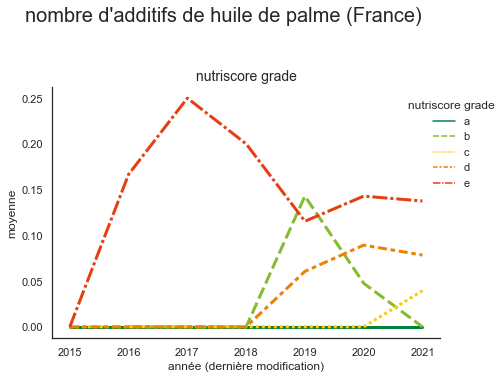

In [125]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_agg_by_nutriscore_grade,
       col='ingredients_from_palm_oil_n',
       aggfunc='mean',
       titre="nombre d'additifs de huile de palme (France)",
       soustitre='nutriscore grade'
       )
 )

to_png("additifs huile de palme par produit - Nutriscore (France)")


"additifs_par_produit_-_NOVA_group_(France).png"


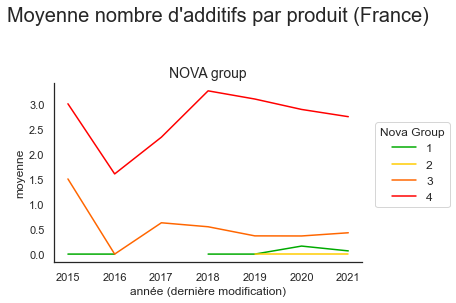

In [126]:
def plot_column_mean_by_nova_group(df:pd.DataFrame, col='unsafe', titre='', soustitre=''):
    data = col_group_by_year(df, groupby_var='nova_group',
                             date_col='last_modified_datetime', col=col, aggfunc='mean')
    ax = data.plot(kind='line', color=nova_palette.values())
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    plt.legend(title=f'Nova Group',
               bbox_to_anchor=(1.05, 0.5), loc="right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    # plt.legend(title=f'Nova Group',loc="upper right", fontsize=12)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_mean_by_nova_group,
       col='additives_n',
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='NOVA group'
       )
 )
to_png("additifs par produit - NOVA group (France)")


In [127]:
def count_group_by_year(df: pd.DataFrame, groupby_var='nutriscore_grade', date_col='last_modified_datetime'):
    """Compter l'évolution dans le temps, basé sur date_col"""
    count_by_year: pd.DataFrame = (df[[groupby_var, date_col]]
                                   .groupby(by=[groupby_var, df[date_col].dt.year], dropna=True).agg('count')
                                   .rename(columns={date_col: 'effectif'}))
    total_by_yr: pd.DataFrame = (count_by_year
                                 .groupby(level=1, dropna=True).sum()
                                 .rename(columns={'effectif': 'total'}))
    evol_by_year = (count_by_year.join(total_by_yr, how="left", on=date_col))
    evol_by_year['freq'] = (evol_by_year['effectif'] /
                            evol_by_year['total']) * 100
    return evol_by_year


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2014, 2021)
 .pipe(count_group_by_year, date_col='last_modified_datetime')['freq']
 .unstack().style.background_gradient(axis=1)).set_precision(1)


last_modified_datetime,2014,2015,2016,2017,2018,2019,2020,2021
nutriscore_grade,,,,,,,,
a,nan,28.6,16.7,10.5,11.1,11.5,11.5,15.3
b,nan,nan,8.3,15.8,13.3,8.7,10.9,16.8
c,100.0,14.3,8.3,15.8,15.6,23.1,26.6,20.1
d,nan,14.3,16.7,36.8,46.7,31.7,29.2,27.1
e,nan,42.9,50.0,21.1,13.3,25.0,21.9,20.8


## 4.2 Analyses sur le nutriscore grade
### 4.2.1 Nutriscore Grade par année (stacked bar chart)

In [128]:

def plot_groupvar_by_year(df:pd.DataFrame, groupby_var='nutriscore_grade', palette=nutriscore_palette,
                          legend=None, titre='', soustitre=''):
    """Affiche fréquence des catégories stacked par an """
    effectif_group_by_year = df.pipe(
        count_group_by_year, groupby_var=groupby_var, date_col='last_modified_datetime')
    ax = (effectif_group_by_year['freq'].unstack(level=0)
          .plot(kind='bar', stacked=True, color=palette.values()))
    if legend is None:
        legend = groupby_var
    plt.legend(title=f'{legend}',
               bbox_to_anchor=(1.1, 0.5), loc="center left", fontsize=12)
    ax.set_xlabel('année (dernière modification)', size=14)
    ax.set_ylabel('produits (%)', size=14)
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


"Distribution_nutriscore_par_année_(France).png"


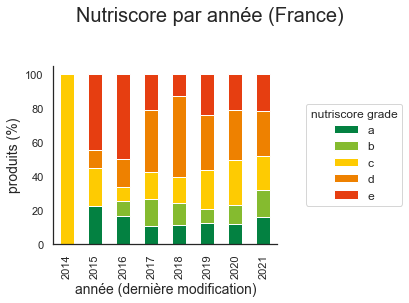

In [129]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nutriscore_grade',
       legend='nutriscore grade',
       palette=nutriscore_palette,
       titre="Nutriscore par année (France)"
       #    soustitre='pour les produits ayant un nutriscore')
       ))
to_png('Distribution_nutriscore_par_année_(France)')


### Nombre d'additifs par an

In [130]:

# evol_by_year.reset_index()['freq'].plot(hue=evol_by_year[groupby_var])
additives_by_year = cleaned_data.pipe(
    count_group_by_year, groupby_var='additives_n')
additives_by_year


effectif  total        freq
additives_n last_modified_datetime                             
0           2014                           1      1  100.000000
            2015                           5     12   41.666667
            2016                           4     16   25.000000
            2017                          12     26   46.153846
            2018                          20     64   31.250000
...                                      ...    ...         ...
19          2020                           1   1344    0.074405
21          2020                           2   1344    0.148810
22          2021                           1    703    0.142248
25          2020                           1   1344    0.074405
28          2020                           1   1344    0.074405

[77 rows x 3 columns]

"Distribution_novagroup_par_année_(France).png"


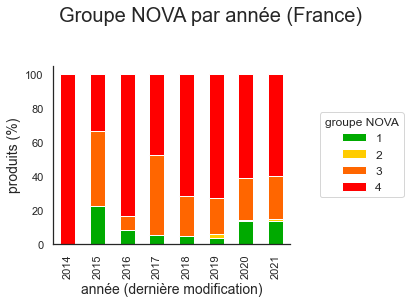

In [131]:
(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='groupe NOVA',
       palette=nova_palette,
       titre="Groupe NOVA par année (France)"
       )
 )
to_png('Distribution_novagroup_par_année_(France)')


"Distribution_novagroup_par_année_(Espagne).png"


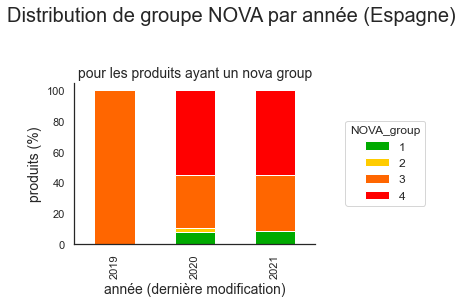

In [132]:
(cleaned_data
 .pipe(filter_by_country, 'Spain')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='NOVA_group',
       palette=nova_palette,
       titre="Distribution de groupe NOVA par année (Espagne)",
       soustitre='pour les produits ayant un nova group')
 )
to_png('Distribution_novagroup_par_année_(Espagne)')


"Distribution_novagroup_par_année_(Allemagne).png"


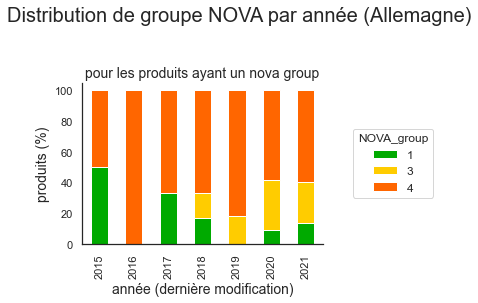

In [133]:
(cleaned_data
 .pipe(filter_by_country, 'Germany')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='nova_group',
       legend='NOVA_group',
       palette=nova_palette,
       titre="Distribution de groupe NOVA par année (Allemagne)",
       soustitre='pour les produits ayant un nova group')
 )
to_png('Distribution_novagroup_par_année_(Allemagne)')

"Distribution_de_nutriscore_grade_par_pays.png"


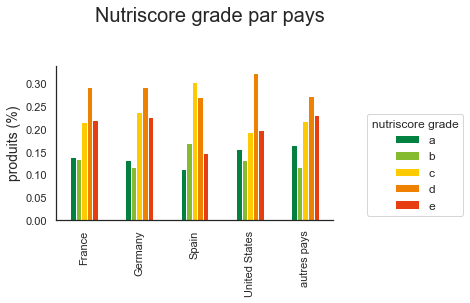

In [134]:
def freq_group_by_tag(df: pd.DataFrame, col='countries_en',
                      groupby_var='nutriscore_grade',
                      nb=10,
                      others=True,
                      others_name='others'
                      ):
    """Comparer les groupes, basé sur country
    Exemple :
        distribution de nutriscore by country
        distribution de nutriscore by brand
        distribution de nutriscore by pnns_group
        distribution de novagroup by country
        distribution de 

    Si les deux variables sont catégoriques, on peut faire un crosstab
    """
    df = explode_frame(df[[groupby_var, col]], col)
    nb = max(1, nb)
    top = df[col].value_counts()[:nb]
    if others:
        df[col] = df[col].where(
            df[col].isna() | df[col].isin(top.index), other=others_name)
    else:
        df = df.where(df[col].isna() | df[col].isin(top.index))
    return pd.crosstab(df[groupby_var], df[col], normalize='columns')


(cleaned_data
 .pipe(freq_group_by_tag,
       groupby_var='nutriscore_grade',
       col='countries_en',
       others=True,
       others_name='autres pays',
       nb=4).T
 # .plot(kind='bar', stacked=True, color=nutriscore_palette.values())
 .plot(kind='bar', stacked=False, color=nutriscore_palette.values())
 # .plot(kind='line', color=nutriscore_palette.values())
 )

plt.legend(title='nutriscore grade',
           bbox_to_anchor=(1.1, 0.5), loc="right", fontsize=12,
           bbox_transform=plt.gcf().transFigure)
ax = plt.gca()
ax.set_xlabel('')
ax.set_ylabel('produits (%)', size=14)
sns.despine()
plt.suptitle('Nutriscore grade par pays', size=20, y=1.05)
# plt.title('pour produits ayant un nutriscore', size=14)
plt.tight_layout()
to_png('Distribution de nutriscore grade par pays')


"Distribution_de_groupe_NOVA_par_pays.png"


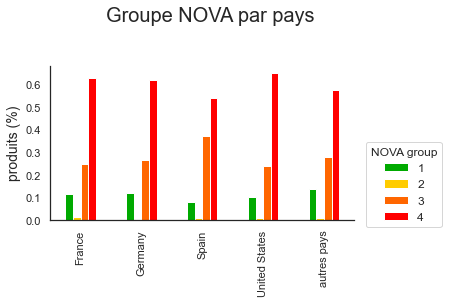

In [135]:
(cleaned_data
 .pipe(freq_group_by_tag,
       groupby_var='nova_group',
       col='countries_en',
       others=True,
       others_name='autres pays',
       nb=4).T
 .plot(kind='bar', stacked=False, color=nova_palette.values())
 )

plt.legend(title='NOVA group',
           bbox_to_anchor=(1.05, 0.6), loc=1, fontsize=12,
           bbox_transform=plt.gcf().transFigure)
ax = plt.gca()
ax.set_xlabel('')
ax.set_ylabel('produits (%)', size=14)
sns.despine()
plt.suptitle('Groupe NOVA par pays', size=20, y=1.05)
plt.tight_layout()
to_png('Distribution de groupe NOVA par pays')


"Proportion_de_produits_ayant_un_nombre_d'additifs_par_année.png"


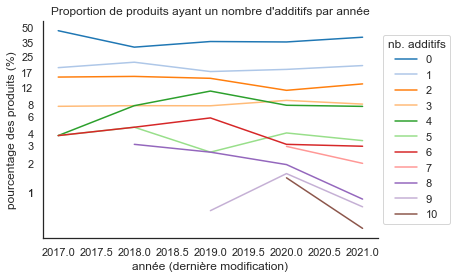

In [136]:
from matplotlib.ticker import FormatStrFormatter

additives_by_year.unstack(level=0)['freq'].iloc[3:, :11].plot()
plt.xlabel('année (dernière modification)')
plt.ylabel('pourcentage des produits (%)')
plt.yscale('log')
plt.gca().set_yticks(np.geomspace(1, 50, 12).round())
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%d'))
plt.legend(title='nb. additifs', loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Proportion de produits ayant un nombre d'additifs par année")
sns.despine()
to_png("Proportion de produits ayant un nombre d'additifs par année")


In [137]:
additives_by_year.unstack(level=0)['freq'].T


last_modified_datetime,2014,2015,2016,2017,2018,2019,2020,2021
additives_n,,,,,,,,
0,100.0,41.666667,25.00,46.153846,31.2500,35.714286,35.342262,39.544808
1,NaN,NaN,37.50,19.230769,21.8750,17.532468,18.452381,20.199147
2,NaN,33.333333,6.25,15.384615,15.6250,14.935065,11.235119,13.086771
3,NaN,8.333333,25.00,7.692308,7.8125,7.792208,8.854167,8.108108
4,NaN,8.333333,6.25,3.846154,7.8125,11.038961,7.886905,7.681366
...,...,...,...,...,...,...,...,...
19,NaN,NaN,NaN,NaN,NaN,NaN,0.074405,NaN
21,NaN,NaN,NaN,NaN,NaN,NaN,0.148810,NaN
22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.142248


### Est-ce que les valeurs moyennes des additifs, valeurs nutritionnelles ont changé pendant le temps ?


In [138]:
# pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option("precision", 2)
(cleaned_data
 .groupby(cleaned_data['last_modified_datetime'].dt.year).mean()
 .style.bar(color='#33d65f50')
 )


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,ecoscore_score_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
last_modified_datetime,,,,,,,,,,,,,
2014,0.00,0.00,0.00,2.00,94.00,17.00,0.00,0.00,0.50,0.50,0.00,0.50,0.00
2015,1.83,0.00,0.33,10.08,56.43,1101.00,20.66,5.53,13.99,9.00,3.67,4.63,0.40
2016,1.50,0.06,0.00,15.19,31.80,1361.88,18.54,9.81,27.88,15.10,3.90,10.76,0.42
2017,1.31,0.04,0.15,9.77,44.35,974.08,9.15,4.05,28.25,15.92,2.06,8.95,0.34
2018,2.20,0.02,0.12,8.72,44.86,1083.77,11.32,3.87,30.88,16.95,3.26,7.84,0.35
2019,2.07,0.05,0.16,9.37,40.30,1131.76,14.92,6.06,24.20,12.36,2.77,8.37,0.45
2020,2.48,0.01,0.05,9.55,41.97,1200.13,13.86,5.08,33.14,15.04,2.55,8.07,0.49
2021,1.81,0.04,0.08,8.77,49.07,1100.38,13.49,5.18,27.53,12.50,2.84,7.33,0.40


In [139]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .groupby(cleaned_data['created_datetime'].dt.year).mean()
 .style.bar()
 )


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,ecoscore_score_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
created_datetime,,,,,,,,,,,,,
2012,1.88,0.00,0.25,13.25,45.50,1213.88,19.70,8.16,18.60,13.72,2.18,8.16,0.42
2013,2.07,0.07,0.29,9.36,48.48,1165.46,14.41,7.10,28.74,14.15,3.28,7.41,0.31
2014,1.36,0.00,0.08,5.97,59.79,1092.56,14.47,2.86,25.85,7.20,2.27,6.44,0.71
2015,1.91,0.10,0.06,10.07,40.88,1176.19,14.29,6.25,29.50,16.94,3.78,7.92,0.30
2016,2.21,0.08,0.21,9.64,53.26,1194.15,14.25,6.12,29.61,12.69,2.85,8.06,0.36
2017,1.81,0.04,0.17,9.00,46.95,1053.87,12.04,4.90,27.05,14.18,2.60,7.71,0.39
2018,2.22,0.05,0.13,10.46,42.77,1185.94,15.50,6.29,27.93,16.19,2.40,7.92,0.36
2019,1.25,0.05,0.05,8.32,50.86,1118.98,13.53,4.72,24.48,11.87,2.54,7.87,0.40
2020,1.10,0.03,0.03,11.10,40.96,1278.77,19.72,10.20,26.17,14.22,4.20,8.03,0.28


### Conclusion

### 4.1.4 Additives by nutriscore grade (descriptive)


In [140]:
cleaned_data[['additives_n', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


additives_n                                      
                       count  mean   std  min  25%  50%  75%   max
nutriscore_grade                                                  
a                      351.0  0.77  1.50  0.0  0.0  0.0  1.0  10.0
b                      313.0  1.78  2.49  0.0  0.0  1.0  3.0  15.0
c                      496.0  1.99  2.64  0.0  0.0  1.0  3.0  16.0
d                      699.0  2.78  3.21  0.0  0.0  2.0  4.0  22.0
e                      461.0  3.01  3.64  0.0  1.0  2.0  4.0  28.0

In [141]:
(cleaned_data
 .pipe(filter_by_country, 'france')[['additives_n', 'nutriscore_grade']]
 .groupby('nutriscore_grade').describe(percentiles=None)
 )


additives_n                                      
                       count  mean   std  min  25%  50%  75%   max
nutriscore_grade                                                  
a                      113.0  0.74  1.43  0.0  0.0  0.0  1.0   9.0
b                      109.0  1.50  2.07  0.0  0.0  1.0  2.0   8.0
c                      176.0  1.74  2.29  0.0  0.0  1.0  3.0  14.0
d                      238.0  2.46  2.66  0.0  0.0  2.0  4.0  12.0
e                      179.0  2.24  2.25  0.0  1.0  2.0  3.0  13.0

On note qu'il y jusqu'à 21 additifs pour le meilleur nutriscore grade !!


"additives_n_vs_nutriscore_grade_boxplot.png"


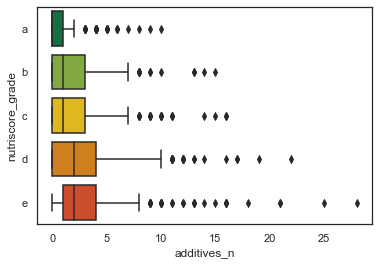

In [142]:
sns.boxplot(data=cleaned_data, y='nutriscore_grade', x='additives_n',
            palette=nutriscore_palette, order=nutriscore_order)
to_png('additives_n_vs_nutriscore_grade_boxplot')


### 4.1.4 Nombre d'additifs (distributions) par nutriscore grade (kdeplot)


"additives_n_vs_nutriscore_grade_kdeplot.png"


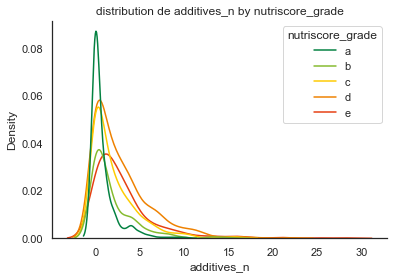

In [143]:
def plot_kde(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    df[y_var]=df[y_var].astype(np.float64)
    palette = get_palette(groups_var)
    order = list(palette.keys())
    order.sort()
    g = sns.kdeplot(data=df, x=y_var, hue=groups_var,
                    palette=palette, hue_order=order)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()

plot_kde(cleaned_data,groups_var='nutriscore_grade', y_var='additives_n')
to_png('additives_n_vs_nutriscore_grade_kdeplot')


#### 4.1.4.1 Nombre d'additifs distribution par nutriscore_score (joint plots)


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot.png"


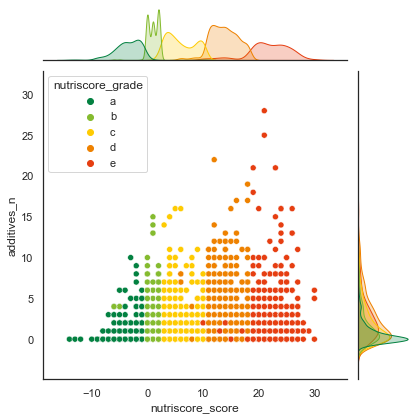

In [144]:
# Error warnings si pandas < 1.3.0
data=cleaned_data[['nutriscore_score','additives_n','nutriscore_grade','countries_en']].copy()
data['additives_n']=data['additives_n'].astype(np.float64)
g=sns.jointplot(data=data, x='nutriscore_score', y='additives_n',
              hue='nutriscore_grade', hue_order=nutriscore_order, palette=nutriscore_palette)
g.ax_joint.legend(loc='upper left', title='nutriscore_grade')
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot')


#### 4.1.4.2 C'est répresentatif de la France ? (jointplot)


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot_france.png"


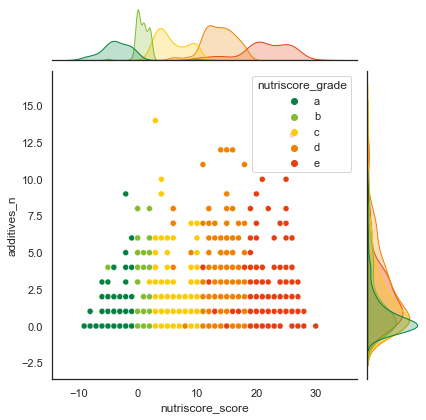

In [145]:
sns.jointplot(data=data.pipe(filter_by_country, 'france'),
              x='nutriscore_score', y='additives_n',
              hue='nutriscore_grade', hue_order=nutriscore_order, palette=nutriscore_palette)
g.ax_joint.legend(loc='upper left', title='nutriscore_grade')
del data
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot_france')


#### 4.1.4.3 Essaie (sans succès) de mettre la densité dans le scatter plot (hexbin jointplot)

- trop d'information
- il y a d'autres plus interessant


"additives_n_vs_nutriscore_hue_nutrigrade_jointplot_hexbin.png"


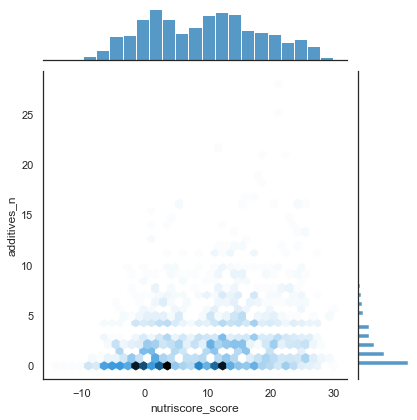

In [146]:
sns.jointplot(data=cleaned_data, kind='hex', x='nutriscore_score',
              y='additives_n', palette=nutriscore_palette)
to_png('additives_n_vs_nutriscore_hue_nutrigrade_jointplot_hexbin')


---

# 5. Analyse des additifs (par tag)

_"Les additifs alimentaires sont des substances ajoutées intentionnellement aux aliments pour exercer certaines fonctions technologiques spécifiques, par exemple pour colorer, sucrer ou contribuer à la conservation des aliments."_

_"Dans l’Union européenne, tous les additifs alimentaires sont identifiés par un numéro commençant par « E ». Les additifs alimentaires sont toujours inclus dans la liste des ingrédients des aliments auxquels ils sont ajoutés. L’étiquetage du produit doit mentionner tant la fonction de l’additif dans le produit fini (par ex. colorant, conservateur) que la substance spécifique utilisée, soit en se référant au numéro E correspondant ou à son nom (ex. E 415 ou gomme xanthane)."_

_"Les additifs les plus communs mentionnés sur les étiquettes sont les antioxydants (qui empêchent la détérioration due à l'oxydation), les colorants, les émulsifiants, les stabilisateurs, les agents gélifiants et épaississants, les conservateurs et les édulcorants."_

- <https://www.efsa.europa.eu/fr/topics/topic/food-additives>


"fat_100g_vs_nutriscore_grade_boxplot.png"


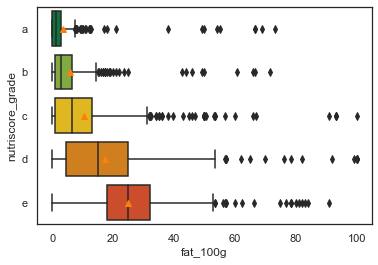

"saturated-fat_100g_vs_nutriscore_grade_boxplot.png"


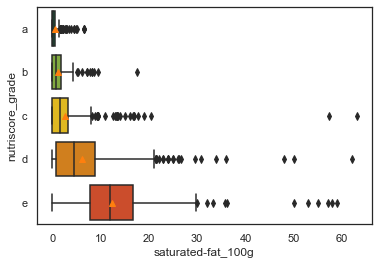

"carbohydrates_100g_vs_nutriscore_grade_boxplot.png"


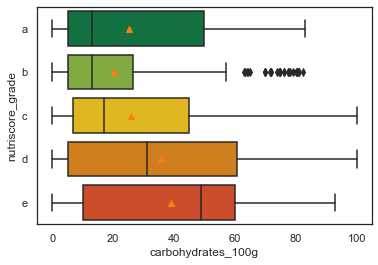

"sugars_100g_vs_nutriscore_grade_boxplot.png"


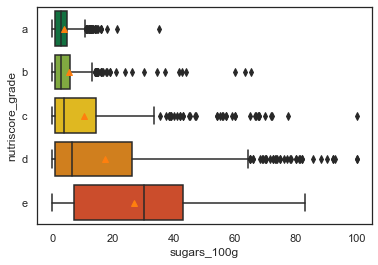

"fiber_100g_vs_nutriscore_grade_boxplot.png"


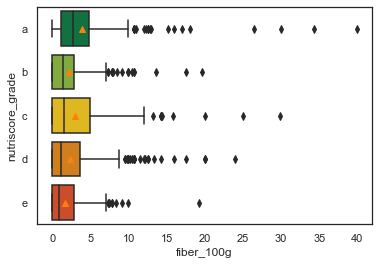

"proteins_100g_vs_nutriscore_grade_boxplot.png"


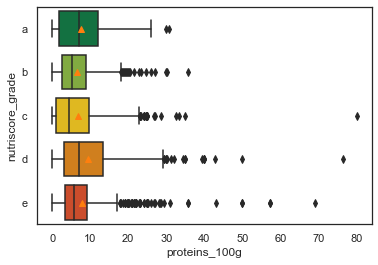

"sodium_100g_vs_nutriscore_grade_boxplot.png"


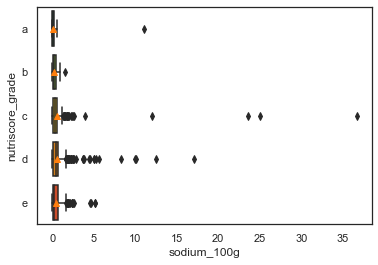

In [147]:
for col in colonnes_100g:
    sns.boxplot(data=cleaned_data, y='nutriscore_grade', x=col, showmeans=True,
                palette=nutriscore_palette, order=nutriscore_order)
    to_png(f'{col}_vs_nutriscore_grade_boxplot')
    plt.show()


"colonnes_nutritionnelles_boxplot.png"


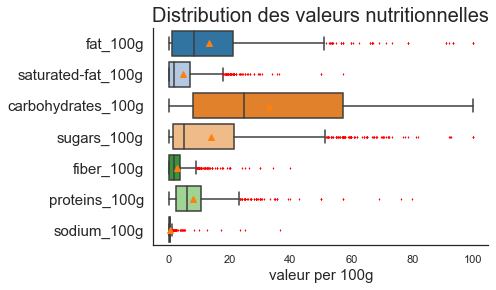

"colonnes_nutritionnelles_(France)_boxplot.png"


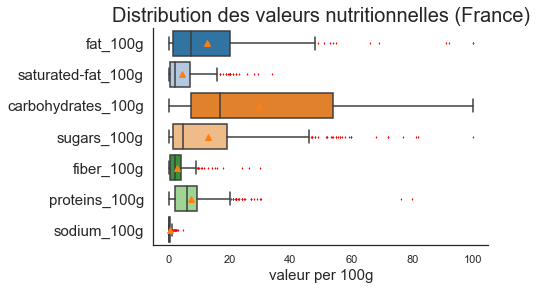

"colonnes_nutritionnelles_(United_states)_boxplot.png"


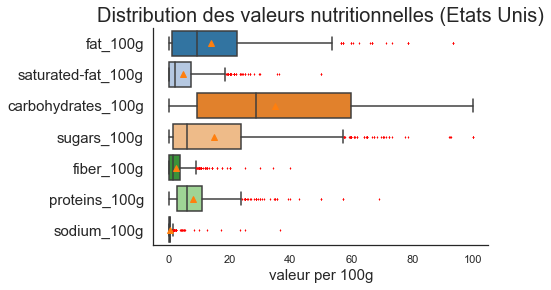

In [148]:
def cols_nutritionnelles_not_fln(df:pd.DataFrame):
    return df.columns[
        (df.columns.str.endswith('_100g'))
        & ~(df.columns.str.contains('energy'))
        & ~(df.columns.str.contains('estimate'))
        ]


colonnes_100g_not_fln = cleaned_data.pipe(cols_nutritionnelles_not_fln)


def plot_box_colonnes_100g(df:pd.DataFrame, colonnes=colonnes_100g_not_fln):
    colonnes = cols_in_df(df, colonnes)
    data = df[colonnes].dropna()
    flierprops = dict(markerfacecolor='red', markersize=2,
                      markeredgecolor='None')
    g = sns.boxplot(data=pd.melt(data), y='variable', x='value',
                    showmeans=True, showfliers=True, flierprops=flierprops)
    labels = g.get_yticklabels()
    g.set_yticklabels(labels, fontsize=15)
    g.set_title(f'box plot des colonnes nutritionnelles')
    g.set_xlabel('valeur per 100g', fontsize=15)
    g.set_ylabel('')
    sns.despine()


(cleaned_data
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles', size=20)
to_png('colonnes nutritionnelles boxplot')
plt.show()

# Est-ce que les valeurs pour France sont différentes ?
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles (France)', size=20)
to_png('colonnes nutritionnelles (France) boxplot')
plt.show()

# est-ce que les valeurs pour France sont différentes ?
(cleaned_data
 .pipe(filter_by_country, 'United States')
 .pipe(plot_box_colonnes_100g))
plt.title(f'Distribution des valeurs nutritionnelles (Etats Unis)', size=20)
to_png('colonnes nutritionnelles (United states) boxplot')


## 4.3 Analyses sur le nutriscore score

### 4.3.1 Nutriscore score par pays
#### 4.3.1.1 Est-ce que les nutriscores ont la même distribution pour tous les pays? 

Kolmogorov-Smirnov [France] : stat=0.742, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [Germany] : stat=0.768, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [Spain] : stat=0.786, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [United States] : stat=0.748, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=2200), [815, 182, 89, 1114]
Levene homoscédasticité : stat=1.033, p=0.377
Levene test, accept H0: groups have similar variance
----Tukey pairwise summary  ------------
(reject=True signifié les médianes sont différents)
"nutriscore_score_par_pays_box_plot.png"


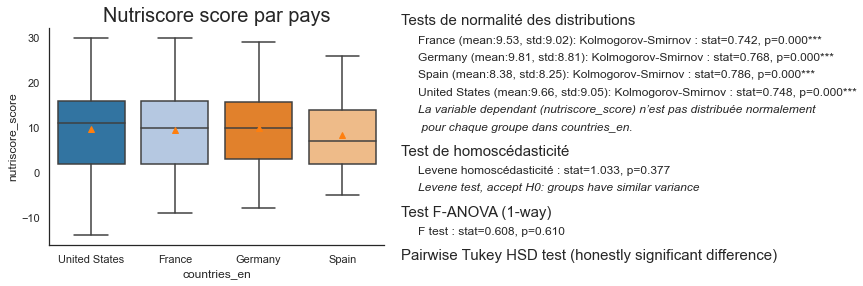

In [149]:
def plot_colonne_mean_by_top_categories(df:pd.DataFrame, y_var='nutriscore_score', groups_var='countries_en', nb=4):
    data = df[[y_var, groups_var]].dropna()
    data = explode_frame(data, groups_var)
    categories = data[groups_var].value_counts()
    nb = min(len(categories), nb)
    top_categories = categories.head(nb).index.to_list()
    top_categories.sort()

    # exclure les autres categories qui ne sont pas dans le plus frequent
    data = data[data[groups_var].isin(top_categories)]

    # Groupes
    # groups=group_by_groups(data,y_var, groups_var)
    plot_box_groupby(data, y_var, groups_var, showtukey=True)


cleaned_data.pipe(plot_colonne_mean_by_top_categories, y_var='nutriscore_score', groups_var='countries_en')
plt.title('Nutriscore score par pays', fontsize=20)
to_png('nutriscore_score_par_pays_box_plot')

## 5.1 Import des données des additifs


In [150]:
additives_detail = (pd.read_csv(os_path_join(OUT_FOLDER, ADDITIVES_DETAIL),
                                encoding='UTF-8', sep='\t')
                    .pipe(drop_colonnes_sans_nom))
additives_detail.info(verbose=False)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 655 entries, 0 to 654
Columns: 28 entries, id to efsa_evaluation_exposure_mean_greater_than_noael
dtypes: float64(1), object(27)
memory usage: 143.4+ KB


In [151]:
print(list(additives_detail.columns))


['id', 'efsa_evaluation', 'name', 'efsa_evaluation_date', 'vegetarian', 'efsa_evaluation_url', 'e_number', 'vegan', 'wikidata', 'efsa', 'additives_classes', 'efsa_evaluation_overexposure_risk', 'efsa_evaluation_adi', 'from_palm_oil', 'efsa_evaluation_exposure_95th_greater_than_adi', 'efsa_evaluation_exposure_mean_greater_than_adi', 'colour_index', 'description', 'efsa_evaluation_adi_established', 'efsa_evaluation_safety_assessed', 'organic_eu', 'mandatory_additive_class', 'comment', 'default_additive_class', 'ciqual_food_name', 'ciqual_food_code', 'efsa_evaluation_exposure_95th_greater_than_noael', 'efsa_evaluation_exposure_mean_greater_than_noael']


## 5.2 Filtre les classes d'additifs par ceux qui sont present dans la base de données


In [152]:
def filtre_additive_classes(detail=additives_detail, data_df=cleaned_data):
    # TODO
    additives_in_data = (pd.DataFrame(
        explode_series(data_df['additives_tags'].dropna()).unique(), columns={'id'})
                         .set_index('id')
                         )
    additives_palm_oil = (pd.DataFrame(
        explode_series(data_df['ingredients_from_palm_oil_tags'].dropna()).unique(), columns={'id'})
                          .set_index('id')
                          )
    additives_maybe_palm_oil = (pd.DataFrame(
        explode_series(data_df['ingredients_that_may_be_from_palm_oil_tags'].dropna()).unique(), columns={'id'})
                                .set_index('id')
                                )
    # print(additives_palm_oil.index.tolist())
    # print(additives_maybe_palm_oil.index.tolist())
    detail = detail.copy().set_index('id')

    # check tous les additifs dans data sont present dans détail
    palm_not_in_detail = list(set(additives_palm_oil.index) - set(detail.index))
    maybe_palm_not_in_detail = list(
        set(additives_maybe_palm_oil.index) - set(detail.index))
    add_not_in_detail = list(set(additives_in_data.index) - set(detail.index))
    add_not_in_data = list(set(detail.index) - set(additives_in_data.index))
    add_in_both = list(set(detail.index) - set(add_not_in_data))
    add_palm_oil_not_in_additives_tags = list(
        set(additives_palm_oil.index) - set(additives_in_data.index))
    add_maybe_palm_oil_not_in_additives_tags = list(
        set(additives_maybe_palm_oil.index) - set(additives_in_data.index))
    print(f'not_in_data: {len(add_not_in_data)}')
    print(f'palm_not_in_data: {len(add_palm_oil_not_in_additives_tags)}')
    print(
        f'palm_maybe_not_in_data: {len(add_maybe_palm_oil_not_in_additives_tags)}')

    print(f'palm_not_in_detail: {len(palm_not_in_detail)}')
    print(f'palm_maybe_not_in_detail: {len(maybe_palm_not_in_detail)}')

    # on ne peut pas rassemble les additifs d'huile de palme avec additives_tags

    print(f'not_in_detail: {add_not_in_detail}')
    print(f'both: {len(add_in_both)}')
    print(f'nb additive classes in data ={len(additives_in_data)}')
    print(f'nb additive classes in additives_detail ={len(detail)}')

    detail = detail.join(additives_in_data, how='inner').reset_index()
    print(f'nb additive classes in additives_detail ={len(detail)}')
    return detail


print(additives_detail.shape)
additives_detail = filtre_additive_classes(additives_detail, cleaned_data)
print(additives_detail.shape)


(655, 28)
not_in_data: 434
palm_not_in_data: 2
palm_maybe_not_in_data: 7
palm_not_in_detail: 2
palm_maybe_not_in_detail: 7
not_in_detail: []
both: 221
nb additive classes in data =221
nb additive classes in additives_detail =655
nb additive classes in additives_detail =221
(221, 28)


### 5.2.1 Conclusion : Huile de palme est un ingrédient, pas un additif !!!

On voit que les additifs d'huile de palme ne sont pas considérés comme additifs

- Peut-être à ajouter


## 5.3 Additives present dans plus de 100 produits


In [153]:
def frequent_additives_tags(df:pd.DataFrame, min_count=100):
    freq = explode_series(df['additives_tags'].dropna()).value_counts()
    freq = freq[freq.values >= min_count]
    return freq


freq_add = (cleaned_data
            .pipe(filter_by_country, 'France')
            .pipe(frequent_additives_tags)
            )
freq_add.head()


en:e330    139
Name: additives_tags, dtype: int64

### 5.3.1 Filtre les produits par additives tags


In [154]:
def filter_by_additives_tags(df:pd.DataFrame, additives_tags_list=None, min_count=100):
    if additives_tags_list is None:
        additives_tags_list = frequent_additives_tags(
            df, min_count=min_count).index.tolist()
    add_df = explode_frame(df[['additives_tags']].dropna())
    add_df = add_df[add_df['additives_tags'].isin(additives_tags_list)]
    return add_df


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_additives_tags, min_count=1)
 ).head()


,additives_tags
45,en:e131
45,en:e296
45,en:e330
45,en:e350
45,en:e350ii


### 5.4.2 Obtient l'étiquette pour un tag


In [155]:
print(additives_detail.shape)
add_labels = dict(list(zip(additives_detail['id'], additives_detail['name'])))


def get_additive_labels(additives_tags_list):
    return [add_labels[x] for x in additives_tags_list]


get_additive_labels(['en:e100', 'en:e412', 'en:e415'])


(221, 28)


['E100 - Curcumin', 'E412 - Guar gum', 'E415 - Xanthan gum']

## 5.5 Classes d'additifs


### 5.5.1 Chaque additif peut avoir plusieurs rôles


In [156]:
additives_detail.pipe(calc_tag_intersections, 'additives_classes')


Nombre de top 3 tags dans colonne "additives_classes"
en:stabiliser : 80 produits
en:emulsifier : 69 produits
en:thickener : 64 produits
en:stabiliser & en:emulsifier : 60 produits
en:stabiliser & en:thickener : 58 produits
en:emulsifier & en:thickener : 49 produits
en:stabiliser & en:emulsifier & en:thickener : 47 produits


### 5.5.2 Nombre d'additifs de chaque classe

- il sera très interressant de corréler les additifs dans les produits avec les classes d'additif
- c'est dehors de la portée de ce projet


"Classes_d'additifs_présents_dans_les_aliments.png"


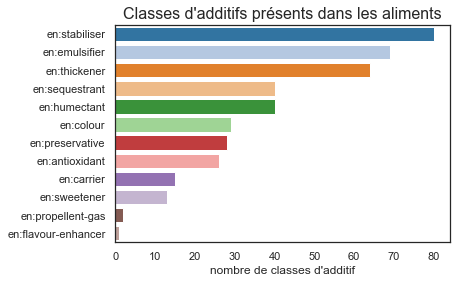

In [157]:
additive_classes = (explode_series(additives_detail['additives_classes'])
                    .value_counts(ascending=False)
                    .to_frame('effectif'))

ax = sns.barplot(y=additive_classes.index, x=additive_classes['effectif'])
ax.set_xlabel("nombre de classes d'additif")
plt.title("Classes d'additifs présents dans les aliments", size=16)
to_png()


## 5.6 Additifs nocifs pour la santé

- <https://github.com/openfoodfacts/openfoodfacts-server/issues/1374>
- <https://www.efsa.europa.eu/en/topics/topic/food-additives>


In [158]:
additives_detail['efsa_evaluation_overexposure_risk'].value_counts()


en:high        24
en:no          10
en:moderate     7
Name: efsa_evaluation_overexposure_risk, dtype: int64

In [159]:
def get_unsafe_additives(detail: pd.DataFrame, tags=('high', 'moderate')):
    if type(tags) is str:
        tags = [tags]
    tags = '|'.join(tags)
    filtre = detail['efsa_evaluation_overexposure_risk'].fillna(
        '').str.contains(tags, regex=True)
    return detail[filtre]


print(f"high : {len(get_unsafe_additives(additives_detail, tags='high'))}")
print(f"moderate : {len(get_unsafe_additives(additives_detail, tags='moderate'))}")

unsafe_additives_df = get_unsafe_additives(additives_detail)
print(f"total nombre d'additifs nocifs: {len(unsafe_additives_df)}")

additives_detail.pipe(get_unsafe_additives, 'high')
additives_detail.pipe(get_unsafe_additives, 'moderate')

print(unsafe_additives_df['name'].to_list())


high : 24
moderate : 7
total nombre d'additifs nocifs: 31
['E131 - Patent blue v', 'E407 - Carrageenan', 'E133 - Brilliant blue FCF', 'E339 - Sodium phosphates', 'E509 - Calcium chloride', 'E200 - Sorbic acid', 'E481 - Sodium stearoyl-2-lactylate', 'E223 - Sodium metabisulphite', 'E150c - Ammonia caramel', 'E251 - Sodium nitrate', 'E220 - Sulphur dioxide', 'E202 - Potassium sorbate', 'E407a - Processed eucheuma seaweed', 'E451 - Triphosphates', 'E252 - Potassium nitrate', 'E341 - Calcium phosphates', 'E221 - Sodium sulphite', 'E211 - Sodium benzoate', 'E433 - Polyoxyethylene sorbitan monooleate', 'E435 - Polyoxyethylene sorbitan monostearate', 'E338 - Phosphoric acid', 'E473 - Sucrose esters of fatty acids', 'E340 - Potassium phosphates', 'E224 - Potassium metabisulphite', 'E452 - Polyphosphates', 'E250 - Sodium nitrite', 'E491 - Sorbitan monostearate', 'E222 - Sodium bisulphite', 'E621 - Monosodium glutamate', 'E960 - Steviol glycosides', 'E450 - Diphosphates']


In [160]:
def get_safe_additives(df:pd.DataFrame):
    tags = 'high|moderate'
    filtre = df['efsa_evaluation_overexposure_risk'].fillna(
        '').str.contains(tags, regex=True)
    return df[~filtre]


safe_additives_df = additives_detail.pipe(get_safe_additives)
print(len(safe_additives_df))
safe_additives_df[['id', 'name']]



190


,id,name
0,en:e100,E100 - Curcumin
1,en:e472c,E472c - Citric acid esters of mono- and diglycerides of fatty acids
2,en:e304,E304 - Fatty acid esters of ascorbic acid
3,en:e324,E324 - Ethoxyquin
4,en:e282,E282 - calcium propionate
...,...,...
216,en:e500,E500 - Sodium carbonates
217,en:e320,E320 - Butylated hydroxyanisole (bha)
218,en:e326,E326 - potassium lactate
219,en:e460,E460 - Cellulose


### 5.7.1 Huile de palme: Additifs qui peuvent accélérer le metastasis de cancer

"Dietary palmitic acid promotes a prometastatic memory via Schwann cells"

"we show that **dietary palmitic acid (PA)**, but not oleic acid or linoleic acid, **promotes metastasis** in oral carcinomas and melanoma"

Article :

- <https://www.nature.com/articles/s41586-021-04075-0>
- <https://doi.org/10.1038/s41586-021-04075-0>


In [161]:
def tag_colonnes(df:pd.DataFrame):
    return df.columns[df.columns.str.contains(',').any()]


liste_colonnes = tag_colonnes(cleaned_data)


In [162]:
def get_additives_may_be_palm_oil(df:pd.DataFrame, country=None):
    filtre = np.full(len(df), True) if country is None else df['countries_en'].fillna(
        '').str.contains(country)
    return (explode_series(
        df[filtre]['ingredients_that_may_be_from_palm_oil_tags'].dropna())
            .value_counts())


def get_additives_palm_oil(df:pd.DataFrame):
    return (explode_series(
        df['ingredients_from_palm_oil_tags'].dropna())
            .value_counts())


# additives_palm_oil=cleaned_data.pipe(get_additives_palm_oil)
additives_may_be_palm_oil = cleaned_data.pipe(get_additives_may_be_palm_oil)

print(additives_may_be_palm_oil)
additives_may_be_palm_oil_france = cleaned_data.pipe(
    get_additives_may_be_palm_oil, 'France')
# print (additives_palm_oil)
print(additives_may_be_palm_oil_france)


e471-mono-et-diglycerides-d-acides-gras-alimentaires                      62
e160a-beta-carotene                                                       43
huile-vegetale                                                            37
e433-monooleate-de-polyoxyethylene-de-sorbitane                           14
e472e-ester-monoacethyltartrique-de-mono-et-diglycerides-d-acides-gras     6
e481-stearoyl-2-lactylate-de-sodium                                        3
e472b-ester-diacetyl-lactique-de-mono-et-diglycerides-d-acides-gras        2
Name: ingredients_that_may_be_from_palm_oil_tags, dtype: int64
e471-mono-et-diglycerides-d-acides-gras-alimentaires                      53
huile-vegetale                                                            34
e160a-beta-carotene                                                       17
e481-stearoyl-2-lactylate-de-sodium                                        3
e472e-ester-monoacethyltartrique-de-mono-et-diglycerides-d-acides-gras     3
e472b-ester-d

In [163]:
def filter_by_unsafe_additives(df:pd.DataFrame, unsafe=None):
    if unsafe is None:
        unsafe = additives_detail.pipe(get_unsafe_additives)['id'].to_list()
    additives = '|'.join(unsafe)
    print(additives)
    filtre = df['additives_tags'].fillna(
        '').str.contains(additives, regex=True)
    return df[filtre]


unsafe_products = cleaned_data.pipe(filter_by_unsafe_additives)
unsafe_products.shape


en:e131|en:e407|en:e133|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e341|en:e221|en:e211|en:e433|en:e435|en:e338|en:e473|en:e340|en:e224|en:e452|en:e250|en:e491|en:e222|en:e621|en:e960|en:e450


(694, 34)

In [164]:
def get_safe_products(df:pd.DataFrame, unsafe=None):
    if unsafe is None:
        unsafe = additives_detail.pipe(get_unsafe_additives)['id'].to_list()
    additives = '|'.join(unsafe)
    print(additives)
    filtre = df['additives_tags'].fillna('').str.contains(additives, regex=True)
    return df[~filtre]


safe_products = cleaned_data.pipe(get_safe_products)
safe_products.shape

en:e131|en:e407|en:e133|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e341|en:e221|en:e211|en:e433|en:e435|en:e338|en:e473|en:e340|en:e224|en:e452|en:e250|en:e491|en:e222|en:e621|en:e960|en:e450


(1626, 34)

---
# 6. ADDISCORE - création et analyse

## 6.1 Création de l'addiscore
Il y a 2 composants de l'addiscore:
- addiscore_score  : compter le nombre d'additifs de risque bas, modéré ou haut
- addiscore_risque : basé sur la présence d'additifs de risque bas, modéré ou haut


### 6.1.1 Identifier les additifs à risque élevés, modérés et bas de sur-exposure
- `risk_haut_n`: compte d'additifs à risque élevés de sur-exposure
- `risk_mod_n` : compte d'additifs à risque modérés de sur-exposure
- `risk_bas_n` : compte d'additifs à risque bas de sur-exposure

#### Additifs à risque bas de sur-exposure

In [165]:
selected_cols = ['id', 'name', 'additives_classes',
                 'efsa_evaluation_date', 'efsa_evaluation_exposure_95th_greater_than_adi']
low_risk_additives = additives_detail.pipe(get_safe_additives)
low_risk_additives[selected_cols].head()


,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
0,en:e100,E100 - Curcumin,en:colour,2010-09-06,NaN
1,en:e472c,E472c - Citric acid esters of mono- and diglycerides of fatty acids,"en:antioxidant,en:emulsifier,en:sequestrant,en:stabiliser",NaN,NaN
2,en:e304,E304 - Fatty acid esters of ascorbic acid,en:antioxidant,2015-11-18,NaN
3,en:e324,E324 - Ethoxyquin,NaN,NaN,NaN
4,en:e282,E282 - calcium propionate,en:preservative,2014-07-22,NaN


#### Additifs de risque modéré de sur-exposure

In [166]:
mod_risk_additives = additives_detail.pipe(get_unsafe_additives, 'moderate')
mod_risk_additives[selected_cols].head()


,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
10,en:e131,E131 - Patent blue v,NaN,2013/03/01,"en:children, en:toddlers"
27,en:e133,E133 - Brilliant blue FCF,en:colour,2010/11/22,"en:children, en:toddlers"
50,en:e509,E509 - Calcium chloride,"en:stabiliser,en:thickener",2019/07/06,"en:adolescents, en:children, en:toddlers"
60,en:e150c,E150c - Ammonia caramel,en:colour,2012-12-03,"en:adults, en:toddlers"
107,en:e433,E433 - Polyoxyethylene sorbitan monooleate,"en:emulsifier,en:stabiliser",2015-07-17,"en:adults, en:elderly, en:children, en:toddlers"


#### Additifs de haut risque de sur-exposure

In [167]:
high_risk_additives = additives_detail.pipe(get_unsafe_additives, 'high')
high_risk_additives[selected_cols].tail()



,id,name,additives_classes,efsa_evaluation_date,efsa_evaluation_exposure_95th_greater_than_adi
164,en:e250,E250 - Sodium nitrite,en:preservative,2017/06/15,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
178,en:e491,E491 - Sorbitan monostearate,en:emulsifier,2017-05-05,"en:adults, elderly, adolescent, children, en:toddlers, infants"
187,en:e222,E222 - Sodium bisulphite,"en:antioxidant,en:preservative",2016-04-14,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
195,en:e621,E621 - Monosodium glutamate,en:flavour-enhancer,2017/07/12,"en:adults, en:elderly, en:adolescents, en:children, en:toddlers, en:infants"
209,en:e450,E450 - Diphosphates,"en:emulsifier,en:humectant,en:sequestrant,en:stabiliser,en:thickener",2019/06/12,"en:adolescents, en:children, en:toddlers, en:infants"


### 6.1.2 Comptage d'additifs de risque bas, modéré, haut

In [168]:
def count_additives(df:pd.DataFrame, additives_list):
    add_df = explode_frame(df[['additives_tags']].dropna())
    add_df = add_df[add_df['additives_tags'].isin(
        additives_list)].groupby(level=0).sum()
    return add_df


count_low_risk: pd.DataFrame = (cleaned_data
                                .pipe(filter_by_country, 'France')
                                .pipe(filter_by_additives_tags, mod_risk_additives['id'])
                                .value_counts()
                                )

count_low_risk.head()


additives_tags
en:e150c          10
en:e133            5
en:e131            3
en:e960            3
en:e435            2
dtype: int64

In [169]:
count_mod_risk: pd.DataFrame = (cleaned_data
                                .pipe(filter_by_country, 'France')
                                .pipe(filter_by_additives_tags, mod_risk_additives['id'])
                                # .value_counts()
                                )

count_mod_risk.head()


,additives_tags
45,en:e131
228,en:e509
258,en:e150c
1606,en:e960
1913,en:e435


In [170]:
mod_risk_additive_count: pd.DataFrame = (cleaned_data
                                         .pipe(filter_by_country, 'France')
                                         .pipe(filter_by_additives_tags, mod_risk_additives['id'])
                                         # count nombre de tags
                                         .groupby(level=0).count()
                                         )
print(mod_risk_additive_count.shape)
mod_risk_additive_count[mod_risk_additive_count['additives_tags'] > 1].head()


(24, 1)


,additives_tags
5698,2


In [171]:
count_high_risk: pd.DataFrame = (cleaned_data
                                 .pipe(filter_by_country, 'France')
                                 .pipe(filter_by_additives_tags, high_risk_additives['id'])
                                 # .value_counts()
                                 )

count_high_risk.head()


,additives_tags
65,en:e450
189,en:e200
228,en:e222
228,en:e224
228,en:e250


### 6.1.3 Créer des colonnes pour indiquer le score d'additifs

- `risk_mod_n` : compte d'additifs de risque modéres
- `risk_high_n`: compte d'additifs de risque éleves de sur exposure
- `risk_palm_n`: compte d'additifs qui vient d'huile de palme
- `addiscore`: ['OK',]


In [172]:
def mark_unsafe_products(df: pd.DataFrame):
    """explode 'additives_tags' column, filter by unsafe, create column"""
    df = df.copy()
    df['risk_mod_n'] = 0
    risk_mod_n = (df.pipe(filter_by_additives_tags, mod_risk_additives['id'], min_count=1)
                  .groupby(level=0).count()
                  .rename(columns={'additives_tags': 'risk_mod_n'}))[['risk_mod_n']]
    df.update(risk_mod_n)
    risk_mod_n = None
    del risk_mod_n
    df['risk_high_n'] = 0
    risk_high_n = (df.pipe(filter_by_additives_tags, high_risk_additives['id'], min_count=1)
                   .groupby(level=0).count()
                   .rename(columns={'additives_tags': 'risk_high_n'}))[['risk_high_n']]
    df.update(risk_high_n)
    df['risk_high_n'] = df['risk_high_n'].astype(float)
    df['risk_low_n'] = df['additives_n'] - df['risk_high_n'] - df['risk_mod_n']
    filtre = df['additives_n'].isna()
    df['risk_high_n'] = df['risk_high_n'].astype(float)
    df['risk_mod_n'] = df['risk_mod_n'].astype(float)
    df['risk_low_n'] = df['risk_low_n'].astype(float)
    df.loc[filtre, 'risk_mod_n'] = np.nan
    df.loc[filtre, 'risk_high_n'] = np.nan
    return df


(cleaned_data
 .pipe(mark_unsafe_products)
 ).head()



,code,creator,created_datetime,last_modified_datetime,product_name,brands_tags,categories_en,labels_en,countries_en,ingredients_text,additives_n,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states_en,ecoscore_score_fr,ecoscore_grade_fr,main_category_en,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,risk_mod_n,risk_high_n,risk_low_n
5,717854470124,usda-ndb-import,2017-03-09 13:58:58,2020-04-22 18:53:32,Bacon mac 'n' cheese,"chili-s,bellisio-foods-inc",Frozen foods,NaN,United States,"Cooked macaroni product (water, semolina enriched with iron, niacin, thiamine mononitrate, ribof...",8,"en:e160b,en:e160e,en:e250,en:e270,en:e316,en:e339ii,en:e401,en:e415","E160b - Annatto,E160e - Beta-apo-8′-carotenal (c30),E250 - Sodium nitrite,E270 - Lactic acid,E31...",0,NaN,0,NaN,4.0,c,4,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",NaN,NaN,Frozen foods,707.0,7.75,3.17,18.31,1.41,1.1,6.34,0.36,0.0,1.0,7.0
6,857308005752,org-database-usda,2020-04-23 20:19:18,2020-04-23 20:19:18,White and red quinoa with marinated artichokes salad,NaN,Salted-snacks,NaN,United States,"White quinoa, artichoke hearts, red quinoa, vinegar, olive oil, spices, salt, lactic acid.",1,en:e270,E270 - Lactic acid,0,NaN,0,NaN,2.0,b,3,NaN,NaN,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",NaN,NaN,Salted-snacks,444.0,4.71,0.59,14.12,2.35,2.4,2.35,0.43,0.0,0.0,1.0
17,41497013388,usda-ndb-import,2017-03-09 11:45:09,2019-07-10 04:05:14,Rich Creamy Vanilla Greek Nonfat Frozen Yogurt,weis-quality,"Dairies,Fermented foods,Fermented milk products,Yogurts,Greek-style yogurts,Vanilla yogurt",NaN,United States,"Nonfat milk, greek yogurt (cultured nonfat milk), sugar, corn syrup, milk protein concentrate, m...",4,"en:e407,en:e412,en:e466,en:e471","E407 - Carrageenan,E412 - Guar gum,E466 - Sodium carboxy methyl cellulose,E471 - Mono- and digly...",0,NaN,0,NaN,2.0,b,4,Milk and dairy products,Milk and yogurt,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",NaN,NaN,Vanilla yogurt,665.0,0.00,0.00,30.43,26.09,0.0,7.25,0.09,0.0,1.0,3.0
22,4030387044331,kiliweb,2019-03-12 20:31:12,2019-09-23 11:50:41,Bitterschokolade karamell,sarotti,"Snacks,Sweet snacks,Cocoa and its products,Chocolates,Dark chocolates,Caramel chocolates,Dark ch...",Made in Germany,Germany,"Kakaomasse, Zucker, Karamellcrisp (Zucker, Glukosesirup, Butter - reinfett (MILCH), natürliches ...",1,en:e322,E322 - Lecithins,0,NaN,0,NaN,22.0,e,4,Sugary snacks,Chocolate products,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",4.0,e,Dark chocolate with caramel,2284.0,39.00,25.00,35.00,31.00,NaN,7.50,0.04,0.0,0.0,1.0
28,688267006074,usda-ndb-import,2017-03-10 09:46:17,2020-04-23 08:47:53,Strawberries,ahold,"Plant-based foods and beverages,Plant-based foods,Fruits and vegetables based foods,Fruits based...",NaN,United States,Strawberries.,0,NaN,NaN,0,NaN,0,NaN,-6.0,a,1,Fruits and vegetables,Fruits,"To be completed,Nutrition facts completed,Ingredients completed,Expiration date to be completed,...",NaN,NaN,Fruits based foods,151.0,0.00,0.00,9.29,6.43,2.1,0.71,0.00,0.0,0.0,0.0


### 6.1.4 Calcule de la colonne 'addiscore_score'

In [173]:
def calc_addiscore(df:pd.DataFrame):
    if len(cols_in_df(df, ['risk_low_n', 'risk_mod_n', 'risk_high_n'])) < 3:
        df = mark_unsafe_products(df)
    else:
        df = df.copy()
    df['addiscore'] = df['risk_low_n'].fillna(
        0) + 2 * df['risk_mod_n'].fillna(0) + 5 * df['risk_high_n'].fillna(0)
    filtre = df['additives_n'].isna()
    df.loc[filtre, 'addiscore'] = np.nan
    df['addiscore'] = df['addiscore'].astype(float)
    return df


cleaned_data.pipe(calc_addiscore)[
    ['additives_n', 'risk_low_n', 'risk_mod_n', 'risk_high_n', 'addiscore']].dropna().head()


,additives_n,risk_low_n,risk_mod_n,risk_high_n,addiscore
5,8,7.0,0.0,1.0,12.0
6,1,1.0,0.0,0.0,1.0
17,4,3.0,0.0,1.0,8.0
22,1,1.0,0.0,0.0,1.0
28,0,0.0,0.0,0.0,0.0


### 6.1.5 Calcule de la colonne 'addiscore_risk'

In [174]:
def calc_addiscore_risk(df:pd.DataFrame)-> pd.DataFrame:
    """
    Calcul de la catégorie d'addiscore risk pour chaque produit, 
    basé sur la PRESENCE d'additifs de risque haut, modéré ou bas
    """
    if len(cols_in_df(df, ['risk_low_n', 'risk_mod_n', 'risk_high_n'])) < 3:
        df = mark_unsafe_products(df)
    else:
        df = df.copy()
    unknown = df['additives_n'].isna()
    no_risk = df['additives_n'] == 0
    low_risk = (df['risk_low_n'] > 0) & (
            df['risk_mod_n'] == 0) & (df['risk_high_n'] == 0)
    mod_risk = (df['risk_mod_n'] > 0) & (df['risk_high_n'] == 0)
    high_risk = df['risk_high_n'] > 0
    df.loc[unknown, 'addiscore_risk'] = pd.NA
    df.loc[no_risk, 'addiscore_risk'] = 'A_none'
    df.loc[low_risk, 'addiscore_risk'] = 'B_low'
    df.loc[mod_risk, 'addiscore_risk'] = 'C_mod'
    df.loc[high_risk, 'addiscore_risk'] = 'D_high'
    return df


cleaned_data = cleaned_data.pipe(calc_addiscore)
cleaned_data = cleaned_data.pipe(calc_addiscore_risk)

cleaned_data[['additives_n', 'risk_low_n', 'risk_mod_n',
              'risk_high_n', 'addiscore', 'addiscore_risk', ]].dropna().head()


,additives_n,risk_low_n,risk_mod_n,risk_high_n,addiscore,addiscore_risk
5,8,7.0,0.0,1.0,12.0,D_high
6,1,1.0,0.0,0.0,1.0,B_low
17,4,3.0,0.0,1.0,8.0,D_high
22,1,1.0,0.0,0.0,1.0,B_low
28,0,0.0,0.0,0.0,0.0,A_none


### 6.1.6 Check toutes les nouvelles colonnes d'addiscore sont remplis


In [175]:
# sns.scatterplot(data=cleaned_data,x='nutriscore_score', y='addiscore', hue='nova_group', s=2)
print(cleaned_data.shape)
print(cleaned_data.dropna(subset=['additives_n']).shape)
print(cleaned_data.dropna(subset=[
    'additives_n', 'risk_low_n', 'risk_mod_n', 'risk_high_n', 'addiscore']).shape)


(2320, 39)
(2320, 39)
(2320, 39)


### 6.1.7 Statistiques (moyennes) des nouvelles colonnes d'addiscore
➡️ Le produits de risque modérés de sur exposure contient en moyenne plus d'additifs que les produits avec additifs de haut risque d'exposure

In [176]:

cleaned_data.groupby('addiscore_risk').agg('mean').style.background_gradient()


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,ecoscore_score_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,risk_mod_n,risk_high_n,risk_low_n,addiscore
addiscore_risk,,,,,,,,,,,,,,,,,
A_none,0.00,0.01,0.01,6.02,48.92,1163.92,14.89,4.83,26.36,8.55,3.47,9.24,0.44,0.00,0.00,0.00,0.00
B_low,2.08,0.03,0.08,10.65,44.42,1193.07,13.39,5.66,35.17,19.08,2.65,6.57,0.36,0.00,0.00,2.08,2.08
C_mod,5.60,0.03,0.10,13.77,34.47,1324.73,8.11,4.14,56.98,36.89,1.36,4.22,0.49,1.04,0.00,4.56,6.64
D_high,5.06,0.03,0.15,11.64,39.93,1091.00,13.34,5.11,27.29,12.62,1.65,8.10,0.60,0.18,1.51,3.37,11.28


#### 6.1.7.1 Pourcentage des produits dans chaque addiscore groupe de risque


In [177]:
(cleaned_data.dropna(subset=['additives_n'])[
     'addiscore_risk'].value_counts(normalize=True) * 100).sort_index()


A_none    36.64
B_low     33.71
C_mod      3.32
D_high    26.34
Name: addiscore_risk, dtype: float64

#### 6.1.7.2 Fréquence du nombre d'additifs de haut risque

Au moins 26% des produits contient des additifs de haut risque 
- (car 74% des produits contient 0 additifs de haute risque)


In [178]:
cleaned_data.dropna(subset=['additives_n'])[
    'risk_high_n'].value_counts(normalize=True) * 100


0.0    73.66
1.0    17.84
2.0     5.56
3.0     1.68
4.0     0.69
5.0     0.39
6.0     0.13
7.0     0.04
Name: risk_high_n, dtype: float64

## 6.2 Nombre d'additifs par addiscore (risque groups)
### 6.2.1 Nombre d'additifs par addiscore risk (box plot) 

"additives_n_vs_addiscore_risk_(boxplot).png"


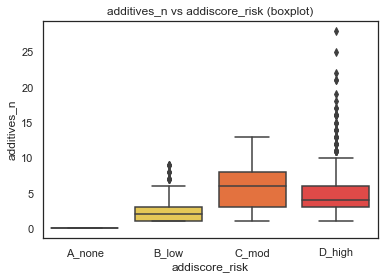

In [179]:
sns.boxplot(data=cleaned_data, x='addiscore_risk', y='additives_n', 
palette=addiscore_palette, order=addiscore_order)
plt.title('additives_n vs addiscore_risk (boxplot)')
to_png()

"addiscore_vs_addiscore_risk_(boxplot).png"


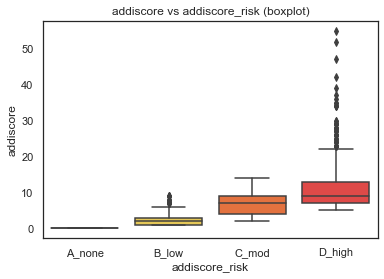

In [180]:
sns.boxplot(data=cleaned_data, x='addiscore_risk', y='addiscore', 
palette=addiscore_palette, order=addiscore_order)
plt.title('addiscore vs addiscore_risk (boxplot)')
to_png()

## 6.3 Nutriscore par addiscore_risk
### 6.3.1 Nutriscore pare addiscore risk (box-plots) 

- Box-plot groupé par catégorie (avec tests statistiques)


"nutriscore_vs_addiscore_risk_boxplot.png"


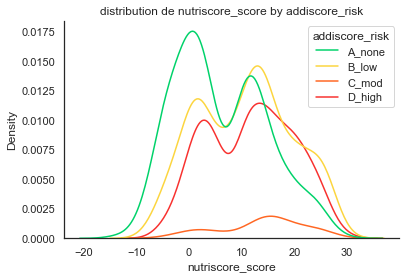

In [181]:
def plot_kde(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    palette = get_palette(groups_var)
    order = list(palette.keys())
    order.sort()
    g = sns.kdeplot(data=df, x=y_var, hue=groups_var,
                    palette=palette, hue_order=order)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()


cleaned_data.pipe(plot_kde, groups_var='addiscore_risk',
                  y_var='nutriscore_score')
to_png('nutriscore_vs_addiscore_risk_boxplot')


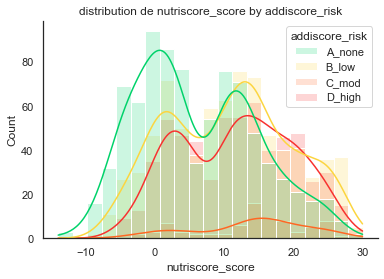

In [182]:
def plot_hist(df:pd.DataFrame, groups_var, y_var):
    df = df[[groups_var, y_var]].dropna()
    palette = get_palette(groups_var)
    order = None
    if palette:
        order = list(palette.keys())
        order.sort()
    categories = df[groups_var].value_counts(ascending=False)
    categories = categories[categories.values > 20].index
    if len(categories) > 12:
        categories = categories[:12]
    _, ax1 = plt.subplots()
    # for categ in categories:
    #     data=df[df[groups_var]==categ]
    #     if len(data) > 20:
    g = sns.histplot(data=df, x=y_var, hue=groups_var,
                     ax=ax1,
                     hue_order=order,
                     palette=palette,
                     alpha=0.2,
                     # binwidth=2,
                     # binrange=(-20,30),
                     kde=True)
    g.set_title(f'distribution de {y_var} by {groups_var}')
    sns.despine()


cleaned_data.pipe(plot_hist, groups_var='addiscore_risk',
                  y_var='nutriscore_score')


Kolmogorov-Smirnov [A_none] : stat=0.610, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.779, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.886, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.859, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=2320), [850, 782, 77, 611]
Levene homoscédasticité : stat=3.442, p=0.016*
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=195.300, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_addiscore_risk_boxplot.png"


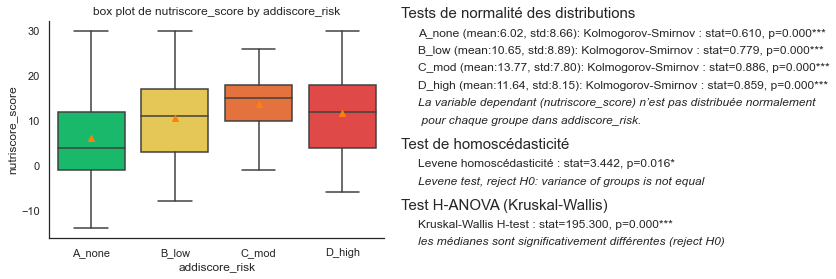

In [183]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='nutriscore_score', showfliers=False)
to_png('nutriscore_vs_addiscore_risk_boxplot')


Kolmogorov-Smirnov [A_none] : stat=0.610, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.779, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.886, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.859, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=2320), [850, 782, 77, 611]
Levene homoscédasticité : stat=3.442, p=0.016*
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=195.300, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_addiscore_risk_boxplot_with_fliers.png"


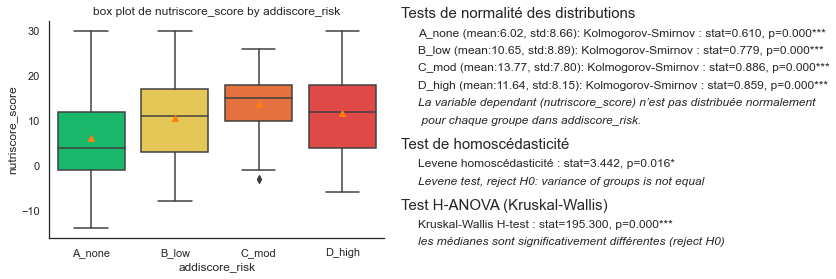

In [184]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='nutriscore_score', showfliers=True)
to_png('nutriscore_vs_addiscore_risk_boxplot_with fliers')

Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.541, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.644, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=2320), [351, 313, 496, 699, 461]
Levene homoscédasticité : stat=22.900, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=206.177, p=0.000***
les médianes sont significativement différentes (reject H0)
"addiscore_risk_vs_nutriscore_boxplot.png"


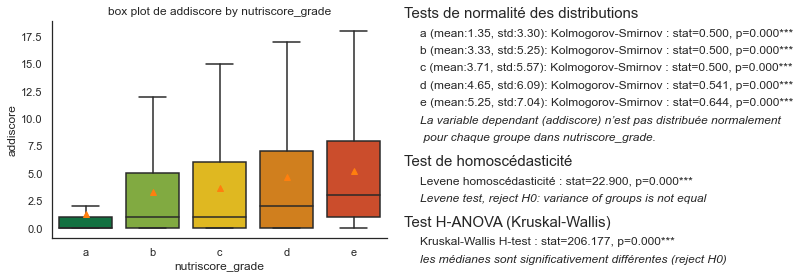

In [185]:
cleaned_data.pipe(plot_box_groupby, y_var='addiscore',
                  groups_var='nutriscore_grade', showstats=True, showfliers=False)
to_png('addiscore_risk_vs_nutriscore_boxplot')


Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.541, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.644, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=2320), [351, 313, 496, 699, 461]
Levene homoscédasticité : stat=22.900, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=206.177, p=0.000***
les médianes sont significativement différentes (reject H0)
"addiscore_risk_vs_nutriscore_boxplot_with_fliers.png"


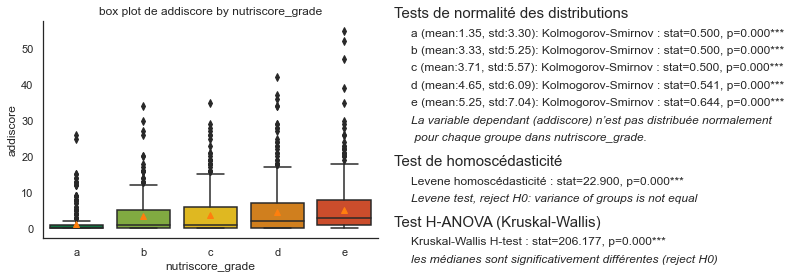

In [186]:
cleaned_data.pipe(plot_box_groupby, y_var='addiscore',
                  groups_var='nutriscore_grade', showstats=True, showfliers=True)
to_png('addiscore_risk_vs_nutriscore_boxplot_with_fliers')

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.841, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [C_mod] : stat=0.841, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.887, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=2320), [850, 782, 77, 611]
Levene homoscédasticité : stat=301.220, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=1900.078, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_additives_risk_boxplot.png"


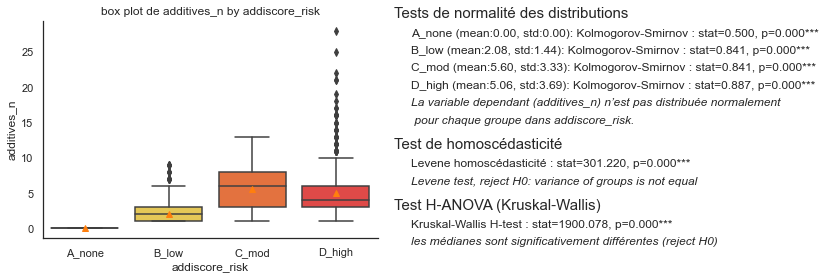

In [187]:
cleaned_data.pipe(plot_box_groupby, groups_var='addiscore_risk',
                  y_var='additives_n', showfliers=True)
to_png('nutriscore_vs_additives_risk_boxplot')


Kolmogorov-Smirnov [a] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [b] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [c] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [d] : stat=0.539, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [e] : stat=0.644, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=2320), [351, 313, 496, 699, 461]
Levene homoscédasticité : stat=29.415, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=219.257, p=0.000***
les médianes sont significativement différentes (reject H0)
"nutriscore_vs_additives_n_boxplot_nofliers.png"


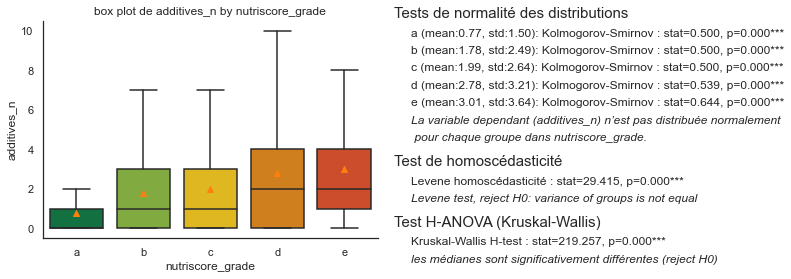

In [188]:
cleaned_data.pipe(plot_box_groupby, groups_var='nutriscore_grade',
                  y_var='additives_n', showfliers=False)
to_png('nutriscore_vs_additives_n_boxplot_nofliers')

### 6.3.2 Test ANOVA 1-way avec tests de normalité et homoscédasticité


Kolmogorov-Smirnov [A_none] : stat=0.608, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.775, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.876, p=0.034* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.877, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=815), [303, 287, 16, 209]
Levene homoscédasticité : stat=1.708, p=0.164
Levene test, accept H0: groups have similar variance
"anova_nutriscore_score_by_addiscore_risk_box_plot.png"


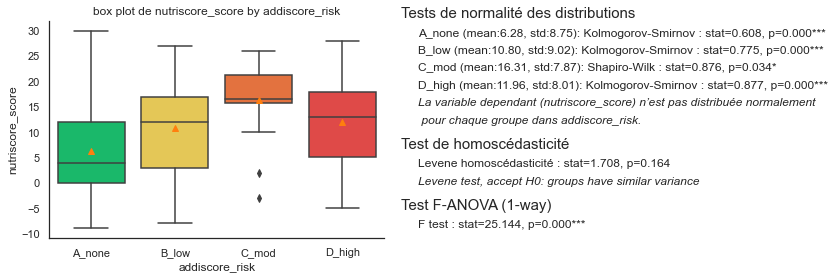

"anova_nutriscore_score_by_addiscore_risk_hist_plot.png"


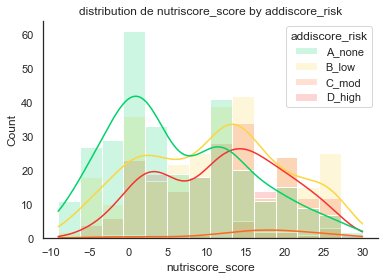

               nutriscore_score                   
                          count   mean   std  skew
addiscore_risk                                    
A_none                      303   6.28  8.75  0.51
B_low                       287  10.80  9.02 -0.03
C_mod                        16  16.31  7.87 -1.23
D_high                      209  11.96  8.01 -0.10

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.608, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.775, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.876, p=0.034* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.877, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (nutriscore_score) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=1.708, p=0.164
Levene test, accept H0: groups have similar variance

Non par

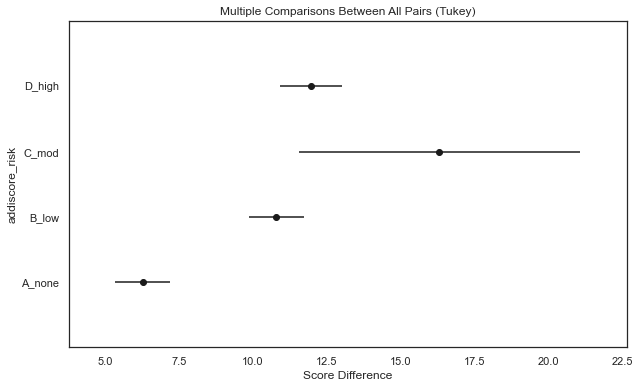

In [189]:

def test_anova(df:pd.DataFrame, y_var, groups_var):
    """test means of outcome variable (y_var), grouped by independent categorical variable (groups_var)"""
    data = df[[groups_var, y_var]].dropna()
    # affiche un plot des groupes
    plot_box_groupby(data, y_var, groups_var)
    to_png(f'anova_{y_var}_by_{groups_var}_box_plot')
    plt.show()

    # affiche une distribution des groupes
    plot_hist(data, groups_var, y_var)
    to_png(f'anova_{y_var}_by_{groups_var}_hist_plot')
    plt.show()

    # affiche une table descriptive :
    stats_df = (df[[groups_var, y_var]]
                .groupby(groups_var).agg(['count', 'mean', 'std', 'skew']))
    print(stats_df)

    groups = []
    categories = data[groups_var].unique()
    categories.sort()
    for categ in categories:
        groups.append(data[data[groups_var] == categ][y_var].rename(categ))

    print('\nTests de normalité des distributions')
    normality = True
    for grp in groups:
        p, ch, choix = test_normality(grp)
        if p < 0.05:
            normality = False
    print(f"La variable dependant ({y_var}) {('est' if normality else 'nʼest pas')} "
          + f"distribuée normalement pour chaque groupe dans {groups_var}.")

    print('\nTest de homoscédasticité')
    if normality:
        stat, p, ch, choix = test_bartlett(groups)
    else:
        stat, p, ch, choix = test_levene(groups)
    alpha = 0.05
    homoscedascity = p > alpha

    if normality and homoscedascity:
        print('\nF statistic')
        # stats f_oneway functions takes the groups as input and returns ANOVA F and p value
        fvalue, p = f_oneway(*groups)
        print(f'F value = {fvalue:.4f}, p value ={p:.4f}')
        alpha = 0.05
        if p > alpha:
            print('Same distributions (fail to reject H0)')
        else:
            print('Different distributions (reject H0)')
            print('Detail ANOVA tables')
            anova_df = anova_table_r(data, groups_var, y_var)

    else:
        print('\nNon parametric ANOVA using Kruskal-Wallis H-test')
        # H-statistic (Kruskal Wallis Non-parametric ANOVA)
        p, ch, choix = test_kruskal(groups)

    if p < alpha:
        print('Il y a évidence que les distributions ne sont tous les mêmes')
        plot_pairwise_tukey(data, groups_var, y_var)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(test_anova, groups_var='addiscore_risk', y_var='nutriscore_score')
 )


['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g']
Kolmogorov-Smirnov [A_none] : stat=0.983, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.996, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.872, p=0.029* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.990, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=811), [299, 287, 16, 209]
Levene homoscédasticité : stat=9.649, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=10.269, p=0.016*
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.983, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.996, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.872, p=0.029* : reject H0: probabl

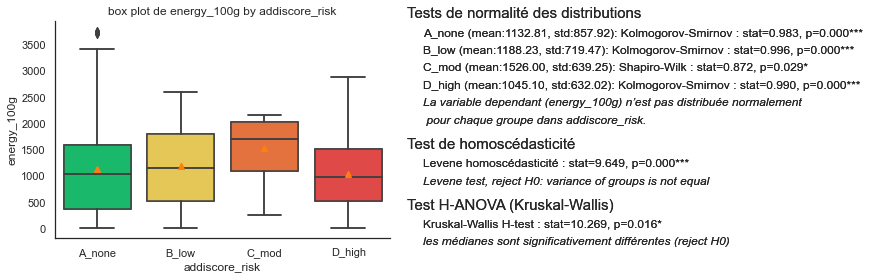

"anova_energy_100g_by_addiscore_risk_hist_plot.png"


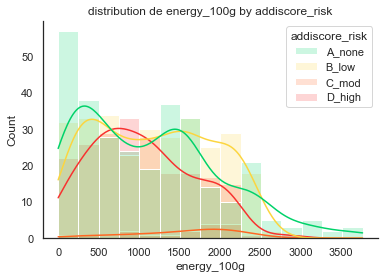

               energy_100g                       
                     count     mean     std  skew
addiscore_risk                                   
A_none                 299  1132.81  857.92  0.68
B_low                  287  1188.23  719.47  0.09
C_mod                   16  1526.00  639.25 -0.88
D_high                 209  1045.10  632.02  0.40

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.983, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.996, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.872, p=0.029* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.990, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (energy_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=9.649, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametri

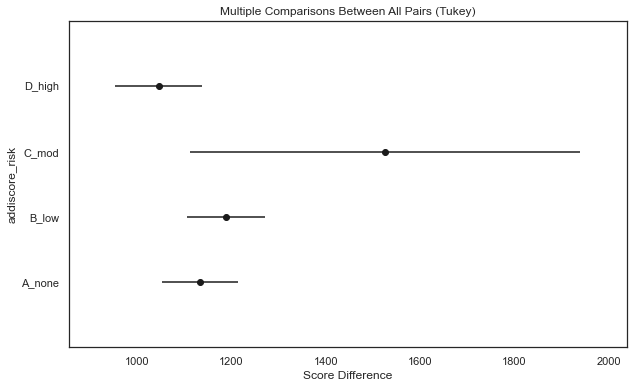

Kolmogorov-Smirnov [A_none] : stat=0.637, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.686, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.879, p=0.038* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.836, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=811), [299, 287, 16, 209]
Levene homoscédasticité : stat=5.879, p=0.001***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=5.276, p=0.153
les médianes ne sont pas significativement différentes, (fail to reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.637, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.686, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.879, p=0.038* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.836, p=0.000*** : reject H0: probablement pas Gaussian
test_hom

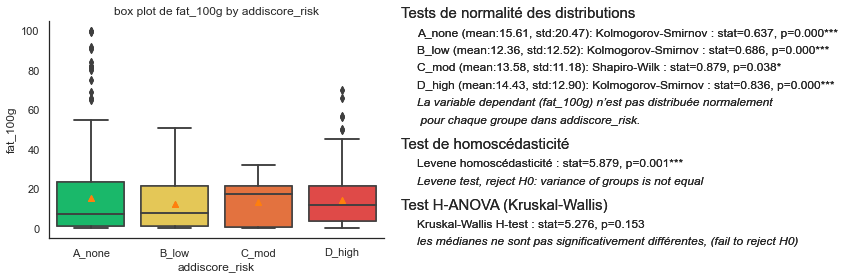

"anova_fat_100g_by_addiscore_risk_hist_plot.png"


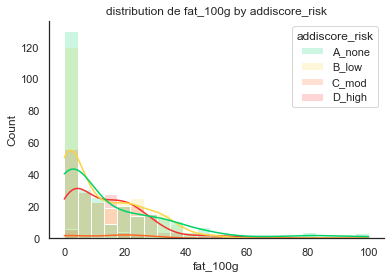

               fat_100g                    
                  count   mean    std  skew
addiscore_risk                             
A_none              299  15.61  20.47  1.97
B_low               287  12.36  12.52  0.85
C_mod                16  13.58  11.18 -0.06
D_high              209  14.43  12.90  1.38

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.637, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.686, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.879, p=0.038* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.836, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (fat_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=5.879, p=0.001***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wallis H-test
Kruskal-W

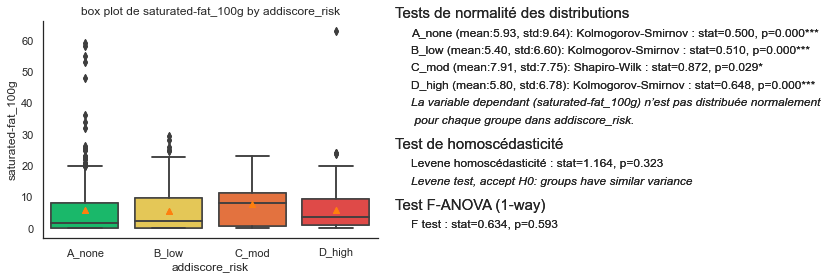

"anova_saturated-fat_100g_by_addiscore_risk_hist_plot.png"


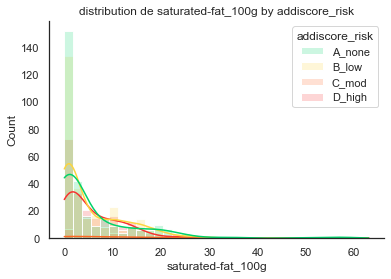

               saturated-fat_100g                  
                            count  mean   std  skew
addiscore_risk                                     
A_none                        299  5.93  9.64  2.81
B_low                         287  5.40  6.60  1.31
C_mod                          16  7.91  7.75  0.62
D_high                        209  5.80  6.78  3.43

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.510, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.872, p=0.029* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.648, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (saturated-fat_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=1.164, p=0.323
Levene test, accept H0: groups have similar variance

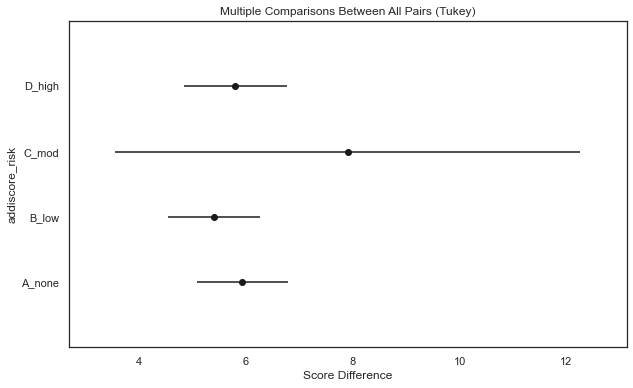

Kolmogorov-Smirnov [A_none] : stat=0.742, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.915, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.886, p=0.048* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.762, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=811), [299, 287, 16, 209]
Levene homoscédasticité : stat=7.928, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=80.586, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.742, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.915, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.886, p=0.048* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.762, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity 

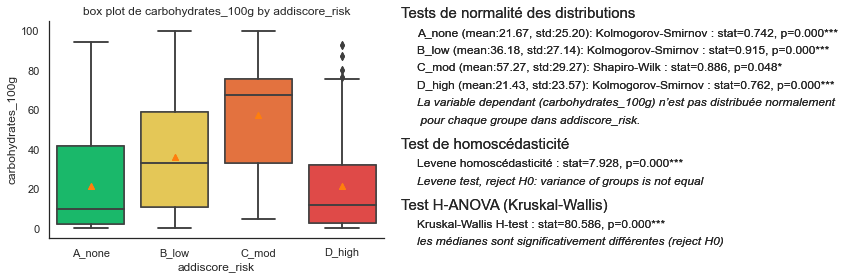

"anova_carbohydrates_100g_by_addiscore_risk_hist_plot.png"


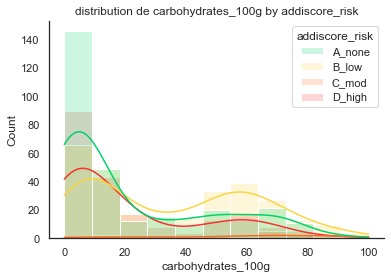

               carbohydrates_100g                    
                            count   mean    std  skew
addiscore_risk                                       
A_none                        299  21.67  25.20  1.06
B_low                         287  36.18  27.14  0.26
C_mod                          16  57.27  29.27 -0.67
D_high                        209  21.43  23.57  1.11

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.742, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.915, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.886, p=0.048* : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.762, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (carbohydrates_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=7.928, p=0.000***
Levene test, reject H0: variance of

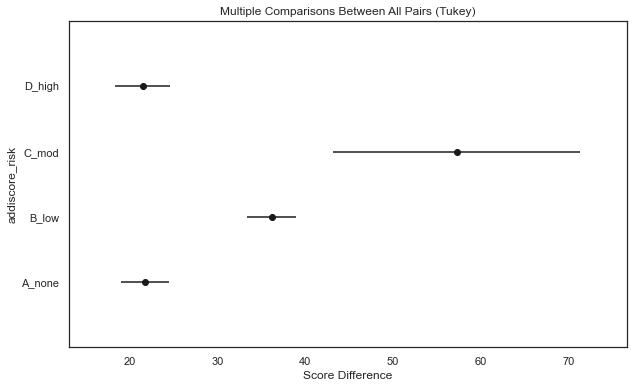

Kolmogorov-Smirnov [A_none] : stat=0.534, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.790, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.930, p=0.246 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.586, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=811), [299, 287, 16, 209]
Levene homoscédasticité : stat=32.362, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=106.574, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.534, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.790, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.930, p=0.246 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.586, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=811

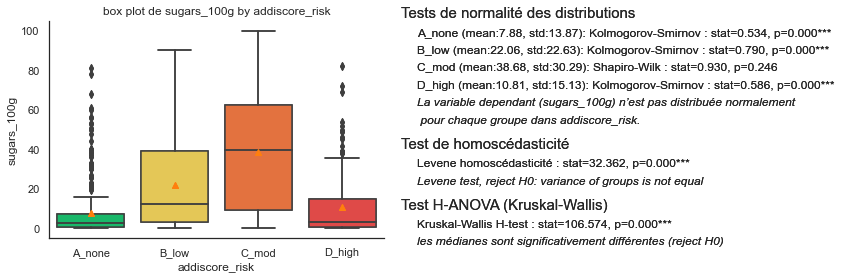

"anova_sugars_100g_by_addiscore_risk_hist_plot.png"


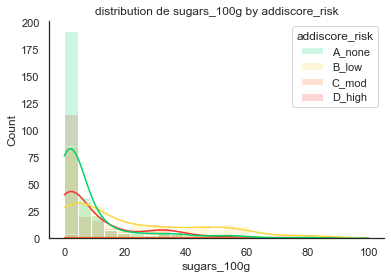

               sugars_100g                    
                     count   mean    std  skew
addiscore_risk                                
A_none                 299   7.88  13.87  2.80
B_low                  287  22.06  22.63  0.98
C_mod                   16  38.68  30.29  0.21
D_high                 209  10.81  15.13  1.94

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.534, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.790, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.930, p=0.246 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.586, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (sugars_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=32.362, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wal

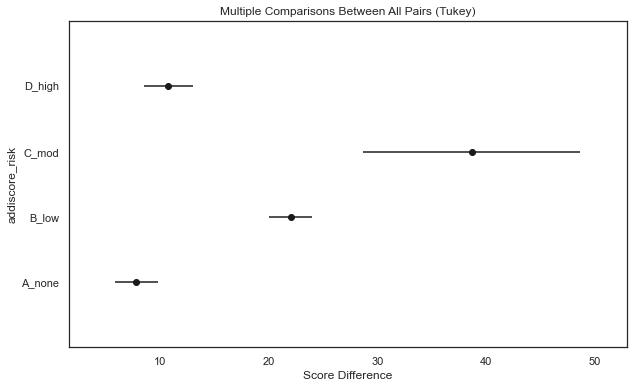

Kolmogorov-Smirnov [A_none] : stat=0.552, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.612, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.862, p=0.126 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=451), [170, 161, 8, 112]
Levene homoscédasticité : stat=7.161, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=21.140, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.552, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.612, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.862, p=0.126 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=451), 

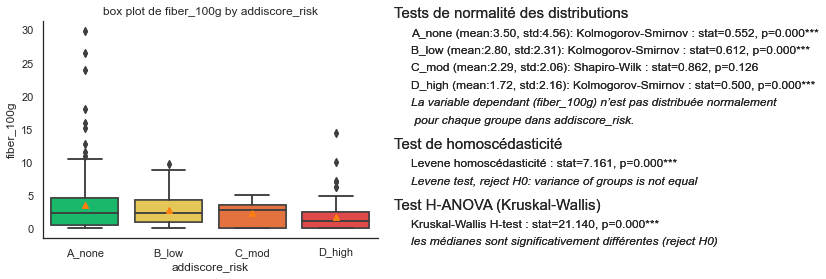

"anova_fiber_100g_by_addiscore_risk_hist_plot.png"


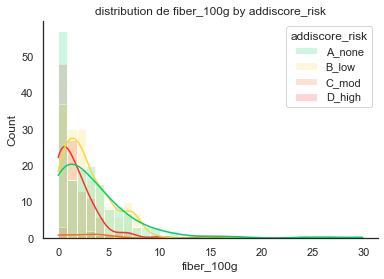

               fiber_100g                  
                    count  mean   std  skew
addiscore_risk                             
A_none                170  3.50  4.56  2.98
B_low                 161  2.80  2.31  0.84
C_mod                   8  2.29  2.06 -0.08
D_high                112  1.72  2.16  2.76

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.552, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.612, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.862, p=0.126 : accept H0: probablement Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (fiber_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=7.161, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wallis H-test
Kruskal-Wall

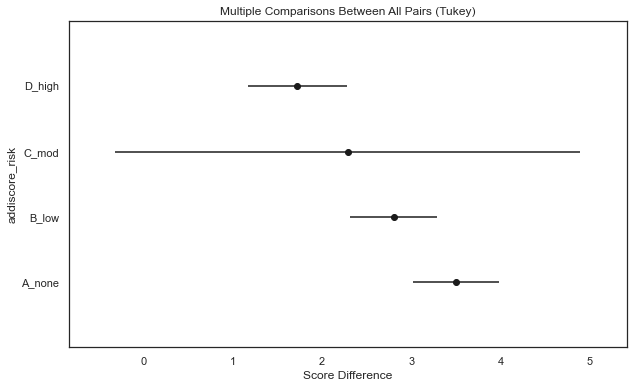

Kolmogorov-Smirnov [A_none] : stat=0.715, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.678, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.707, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.838, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=811), [299, 287, 16, 209]
Levene homoscédasticité : stat=10.659, p=0.000***
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=31.156, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.715, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.678, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.707, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.838, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedas

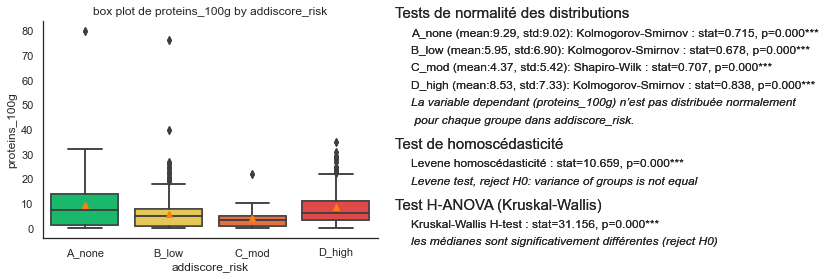

"anova_proteins_100g_by_addiscore_risk_hist_plot.png"


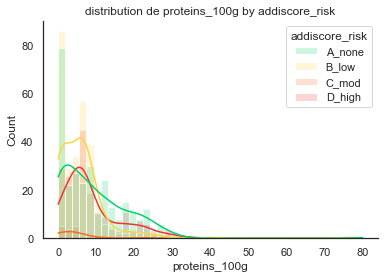

               proteins_100g                  
                       count  mean   std  skew
addiscore_risk                                
A_none                   299  9.29  9.02  2.11
B_low                    287  5.95  6.90  4.68
C_mod                     16  4.37  5.42  2.55
D_high                   209  8.53  7.33  1.28

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.715, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.678, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.707, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.838, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (proteins_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=10.659, p=0.000***
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kr

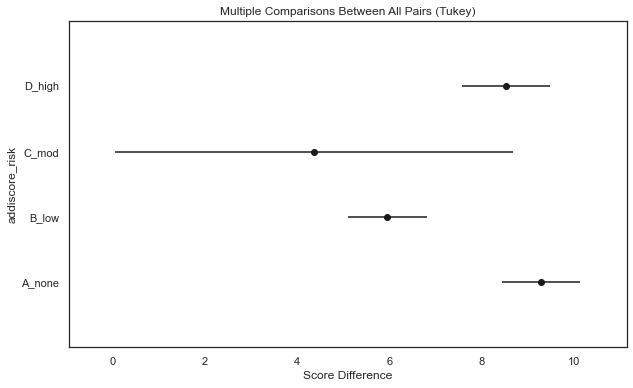

Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.804, p=0.003** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity : (n=814), [302, 287, 16, 209]
Levene homoscédasticité : stat=2.982, p=0.031*
Levene test, reject H0: variance of groups is not equal
Kruskal-Wallis H-test : stat=55.384, p=0.000***
les médianes sont significativement différentes (reject H0)
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.804, p=0.003** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
test_homoscedascity 

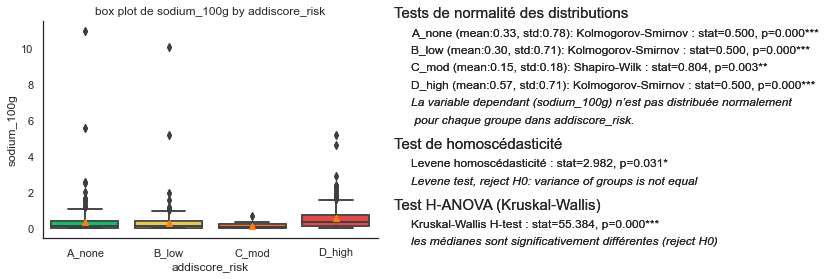

"anova_sodium_100g_by_addiscore_risk_hist_plot.png"


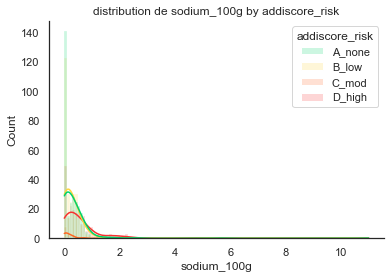

               sodium_100g                   
                     count  mean   std   skew
addiscore_risk                               
A_none                 302  0.33  0.78   9.84
B_low                  287  0.30  0.71  10.58
C_mod                   16  0.15  0.18   1.78
D_high                 209  0.57  0.71   3.05

Tests de normalité des distributions
Kolmogorov-Smirnov [A_none] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [B_low] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
Shapiro-Wilk [C_mod] : stat=0.804, p=0.003** : reject H0: probablement pas Gaussian
Kolmogorov-Smirnov [D_high] : stat=0.500, p=0.000*** : reject H0: probablement pas Gaussian
La variable dependant (sodium_100g) nʼest pas distribuée normalement pour chaque groupe dans addiscore_risk.

Test de homoscédasticité
Levene homoscédasticité : stat=2.982, p=0.031*
Levene test, reject H0: variance of groups is not equal

Non parametric ANOVA using Kruskal-Wallis 

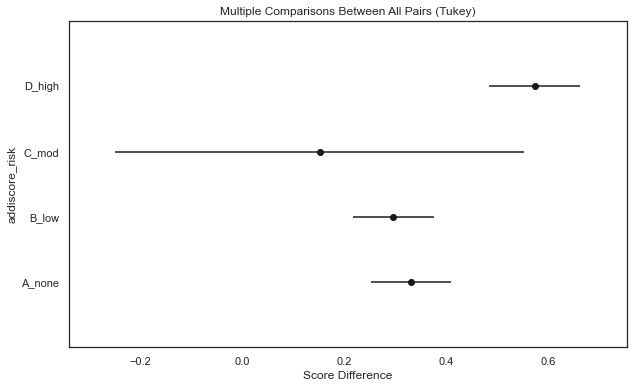

In [190]:
def stats_vars_nutritionnelles(df:pd.DataFrame):
    yvars = cols_in_df(cleaned_data, ['energy_100g', 'fat_100g',
                                      'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                                      'proteins_100g', 'sodium_100g',
                                      'fruits-vegetables-nuts-estimate-from-ingredients_100g'])
    print(yvars)
    for yvar in yvars:
        plot_box_groupby(df, groups_var='addiscore_risk', y_var=yvar, showstats=True)
        test_anova(df, groups_var='addiscore_risk', y_var=yvar)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(stats_vars_nutritionnelles)
 )

## 6.4 NOVA groupes par addiscore risk

### 6.4.1 Moyennes par NOVA groupe (descriptive)


In [191]:
cleaned_data.groupby('nova_group').agg('mean')


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutriscore_score,ecoscore_score_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,risk_mod_n,risk_high_n,risk_low_n,addiscore
nova_group,,,,,,,,,,,,,,,,,
1,0.1,0.0,0.0,-0.46,54.59,936.26,8.19,2.32,29.65,6.36,4.50,7.58,0.14,0.00,0.02,0.08,0.16
2,0.0,0.0,0.0,11.92,36.07,2958.72,71.38,22.67,14.68,9.04,3.06,6.04,0.16,0.00,0.00,0.00,0.00
3,0.45,0.01,0.01,7.76,49.20,1096.03,14.01,4.66,24.43,8.08,3.21,9.39,0.60,0.00,0.09,0.36,0.82
4,3.35,0.03,0.11,11.59,41.32,1192.79,13.59,5.55,33.57,18.01,2.08,7.32,0.46,0.13,0.60,2.62,5.86


### Fréquence des groupees de ADDISCORE risk par NOVA groupe


In [192]:
def crosstab_normalize(df:pd.DataFrame, index_col='pnns_groups_2', groups_col='nutriscore_score', normalize='index',
                       sortbygroup=None):
    ct = (pd.crosstab(
        df[index_col], df[groups_col],
        normalize=normalize, margins=True) * 100
          )
    if not sortbygroup is None:
        ct = ct.sort_values(by=sortbygroup, ascending=False)
    return ct


# pd.crosstab(cleaned_data['nova_group'],cleaned_data['addiscore_risk'],normalize=True, margins=True)*100


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(crosstab_normalize, index_col='nova_group', groups_col='addiscore_risk', normalize=True)
 )


addiscore_risk,A_none,B_low,C_mod,D_high,All
nova_group,,,,,
1,10.55,0.61,0.00,0.25,11.41
2,1.23,0.00,0.00,0.00,1.23
3,17.67,4.91,0.00,2.21,24.79
4,7.73,29.69,1.96,23.19,62.58
All,37.18,35.21,1.96,25.64,100.00


## 6.5 PNNS groups par addiscore_risk

### 6.5.1 Quel sont les groupes PNNS avec les plus grandes proportions d'additifs de risques élevés ?

#### 6.5.1.1 Fréquence des groupes de ADDISCORE risk par PNNS groupe 1


In [193]:
# (pd.crosstab(cleaned_data['pnns_groups_1'],cleaned_data['addiscore_risk'],normalize='index', margins=True)*100).style.background_gradient()

ct_pnns1_addiscore = (cleaned_data
                      .pipe(filter_by_country, 'France')
                      .pipe(crosstab_normalize, index_col='pnns_groups_1', groups_col='addiscore_risk',
                            sortbygroup='D_high')
                      )
ct_pnns1_addiscore.style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
pnns_groups_1,,,,
Fish Meat Eggs,35.16,12.09,0.00,52.75
Composite foods,27.96,27.96,0.00,44.09
Beverages,43.42,27.63,2.63,26.32
All,37.14,34.91,1.97,25.98
Milk and dairy products,46.05,26.32,2.63,25.00
Fat and sauces,41.30,34.78,0.00,23.91
Sugary snacks,17.19,58.85,5.21,18.75
Salty snacks,50.91,30.91,0.00,18.18
Fruits and vegetables,50.00,37.04,0.00,12.96


### 6.5.2 Groupes PNNS 2 avec les plus grandes proportions d'additifs de risques élevés ?


In [194]:
ct_pnns2_addiscore = (cleaned_data
                      .pipe(filter_by_country, 'France')
                      .pipe(crosstab_normalize, index_col='pnns_groups_2', groups_col='addiscore_risk',
                            sortbygroup='D_high')
                      )
ct_pnns2_addiscore.style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
pnns_groups_2,,,,
Artificially sweetened beverages,0.00,12.50,0.00,87.50
Processed meat,6.82,13.64,0.00,79.55
Dried fruits,37.50,0.00,0.00,62.50
Pizza pies and quiches,16.67,33.33,0.00,50.00
Sandwiches,0.00,50.00,0.00,50.00
Potatoes,25.00,25.00,0.00,50.00
Ice cream,11.11,33.33,11.11,44.44
One-dish meals,30.38,26.58,0.00,43.04
Meat,52.63,10.53,0.00,36.84


### Bar plot - valeurs d'une colonne dans une table sommaire

- pas count
- pas groupby

- possibilité de limité la nombre de valeurs
- possibilité de trier par valeur
- possibilité de normalizer (effectif ⇨ fréquence)


<AxesSubplot:xlabel='pnns_groups_1'>

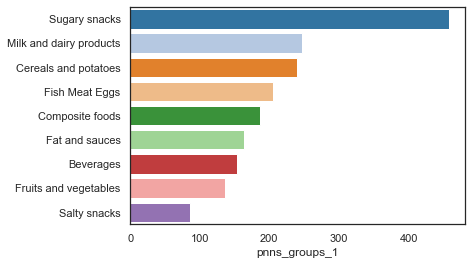

In [195]:
data = cleaned_data['pnns_groups_1'].value_counts().to_frame('pnns_groups_1')
sns.barplot(y=data.index, x=data['pnns_groups_1'])


"Top_10_catégories_avec_additifs_de_risque_élevés(France)_barplot.png"


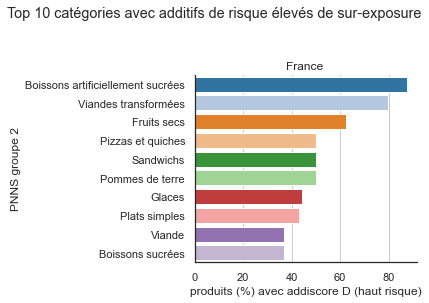

In [196]:
def plot_bar(df:pd.DataFrame, col, nb=20, others=False, normalize=False, sort_values=False, palette=None,
             xlabel=None, ylabel=None, titre='', soustitre='', traductions=False):
    other_count = 0
    data = df[[col]]
    # print(data.columns.to_list())

    if nb < len(data):
        data = data.head(nb)
    if others:
        filter_other = data[col] == 'other'
        # other_count = data[filter_other][col].values.sum()
        data = data[~filter_other]
    if sort_values:
        data = data.sort_values(by=col)
    if normalize:
        ax = sns.barplot(y=data.index, x=data[col] * 100, palette=palette)
        ax.set_xlabel('frequence (%)')
    else:
        ax = sns.barplot(y=data.index, x=data[col], palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others and (other_count > 0):
        if normalize:
            other_count = f'{other_count * 100:.2f} %'
        autres = f' [Autres valeurs = {other_count}]'
    if xlabel:
        ax.set_xlabel(xlabel)
    if ylabel:
        ax.set_ylabel(ylabel)
    if traductions:
        labels = traduire_categories([item.get_text()
                                      for item in ax.get_yticklabels()])
        ax.set_yticklabels(labels=labels)
    plt.gca().xaxis.grid()
    sns.despine()
    plt.suptitle(titre, y=1.05)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()


ct_pnns2_addiscore.pipe(plot_bar, col='D_high', nb=10,
                        traductions=True,
                        xlabel='produits (%) avec addiscore D (haut risque)',
                        ylabel='PNNS groupe 2',
                        titre='Top 10 catégories avec additifs de risque élevés de sur-exposure',
                        soustitre='France'
                        )
to_png('Top 10 catégories avec additifs de risque élevés(France)_barplot')


In [197]:
groupes_a_risque_eleves = ct_pnns2_addiscore.head(10).index
print(groupes_a_risque_eleves)


Index(['Artificially sweetened beverages', 'Processed meat', 'Dried fruits',
       'Pizza pies and quiches', 'Sandwiches', 'Potatoes', 'Ice cream',
       'One-dish meals', 'Meat', 'Sweetened beverages'],
      dtype='object', name='pnns_groups_2')


### Quel sont les distributions de nutriscore pour ces groupes ?


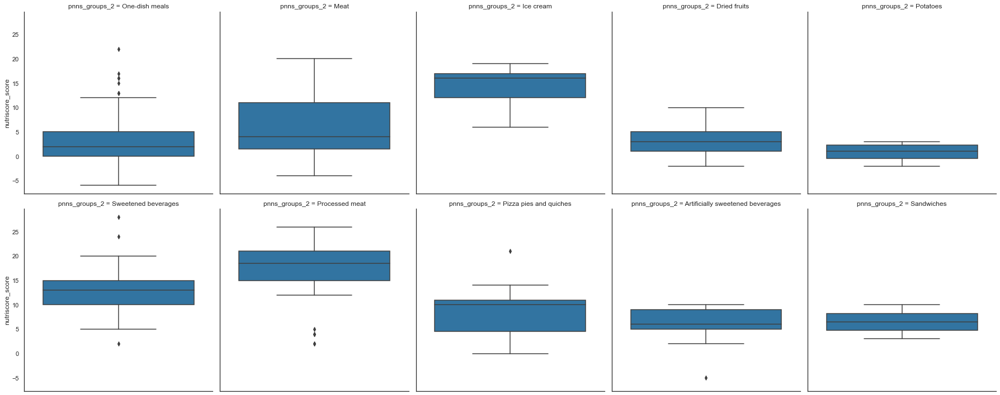

In [198]:
def plot_dist_nutriscore_by_categ(df:pd.DataFrame, categ_col, yvar='nutriscore_score'):
    df = df[[categ_col, yvar]].dropna()
    sns.catplot(data=df, kind='box', col=categ_col, y=yvar, col_wrap=5)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_dist_nutriscore_by_categ, categ_col='pnns_groups_2')
 )


### 6.5.3 Fréquence des additives haut risque

"presence_additifs_nocifs_France_bar.png"


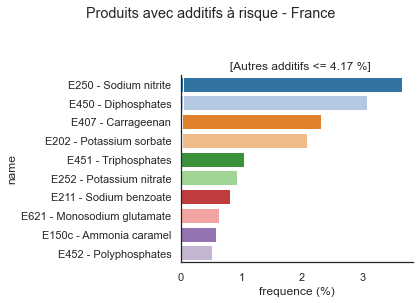

In [199]:
def freq_unsafe_additives(df:pd.DataFrame, filtre=None, normalize=False): 
    """
    Fréquence des additifs nocifs par tags 
    On n'utilise pas colonne additives_en, car certain additifs n'apparait pas
    E450i (Disodium diphosphate) fait partie de E450 - Diphosphates qui sont haut risque
    """
    if filtre is None:
        filtre=unsafe_additives_df['id'].tolist()
    freq = explode_series(df['additives_tags']).value_counts(ascending=False, normalize=normalize)
    freq = freq[freq.index.isin(filtre)]
    freq = freq.to_frame(name='freq').rename_axis('id')
    freq = freq.join(additives_detail[['id','name']].set_index('id'), how='inner').set_index('name')
    return freq['freq']


def plot_unsafe_additives(df:pd.DataFrame, normalize=True, titre='', soustitre='', ylabel=None, nb=19, palette=None): 
    freq_unsafe = freq_unsafe_additives(df, normalize=normalize)
    others_sum = 0
    if len(freq_unsafe) > nb:
        others = freq_unsafe[nb:]
        # print(others)
        others_sum = others.values.sum()
        freq_unsafe = freq_unsafe[:nb]
        # freq_unsafe['autres']=others_sum

    if normalize:
        ax = sns.barplot(y=freq_unsafe.index,
                         x=freq_unsafe.values * 100, palette=palette)
        ax.set_xlabel('frequence (%)')
    else:
        ax = sns.barplot(y=freq_unsafe.index,
                         x=freq_unsafe.values, palette=palette)
        ax.set_xlabel("nombre d'occurrences")

    autres = ''
    if others_sum > 0:
        if normalize:
            others_sum = f'{others_sum * 100:.2f} %'
        autres = f' [Autres additifs <= {others_sum}]'
    if ylabel:
        ax.set_ylabel(ylabel)
    sns.despine()
    plt.suptitle(titre, y=1.05)
    plt.title(f'{soustitre} {autres}')
    plt.tight_layout()
    sns.barplot(y=freq_unsafe.index, x=freq_unsafe.values)


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_unsafe_additives, nb=10, titre='Produits avec additifs à risque - France')
 )
to_png('presence_additifs_nocifs_France_bar')


"presence_additifs_nocifs_USA_bar.png"


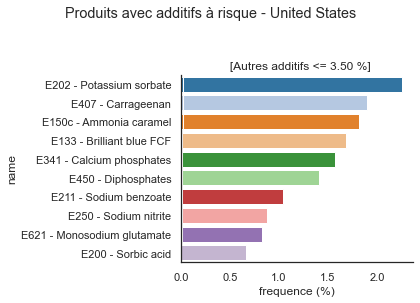

In [200]:
(cleaned_data
 .pipe(filter_by_country, 'United States')
 .pipe(plot_unsafe_additives, nb=10, titre='Produits avec additifs à risque - United States')
 )
to_png('presence_additifs_nocifs_USA_bar')


"presence_additifs_nocifs_France_NOVA_3_bar.png"


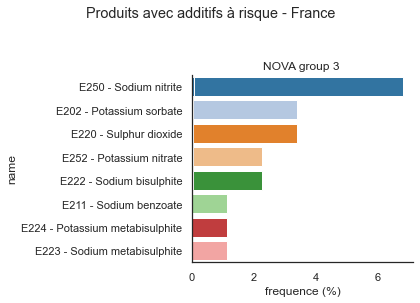

In [201]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'nova_group', '3')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='NOVA group 3')
 )
to_png('presence_additifs_nocifs_France_NOVA_3_bar')


"presence_additifs_nocifs_France_snacks_bar.png"


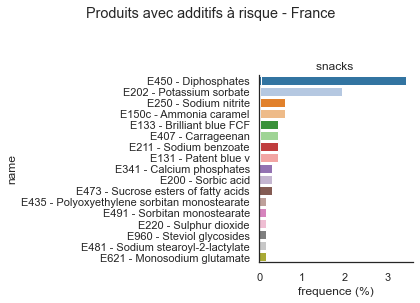

In [202]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_1', 'snacks')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='snacks')
 )
to_png('presence_additifs_nocifs_France_snacks_bar')


"presence_additifs_nocifs_France_snacks_bar.png"


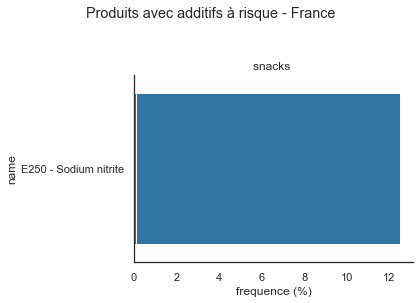

In [203]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'sandwiches')
 .pipe(plot_unsafe_additives,
       titre='Produits avec additifs à risque - France',
       soustitre='snacks')
 )
to_png('presence_additifs_nocifs_France_snacks_bar')


In [204]:
cleaned_data['pnns_groups_2'].unique()


array([nan, 'Milk and yogurt', 'Chocolate products', 'Fruits', 'Sweets',
       'Offals', 'Processed meat', 'Fish and seafood', 'One-dish meals',
       'Meat', 'Cheese', 'Waters and flavored waters', 'Appetizers',
       'Unsweetened beverages', 'Biscuits and cakes', 'Fruit juices',
       'Vegetables', 'Ice cream', 'Potatoes', 'Dried fruits',
       'Dressings and sauces', 'Cereals', 'Breakfast cereals',
       'Sweetened beverages', 'Fats', 'Pizza pies and quiches',
       'Plant-based milk substitutes', 'Legumes', 'Bread',
       'Dairy desserts', 'Sandwiches', 'Pastries',
       'Artificially sweetened beverages', 'Salty and fatty products',
       'Nuts', 'Soups', 'Teas and herbal teas and coffees', 'Eggs'],
      dtype=object)

"presence_additifs_nocifs_France_processed_meat_bar.png"


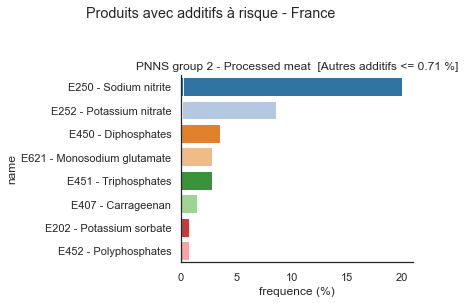

In [205]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'Processed meat')
 .pipe(plot_unsafe_additives, nb=8,
       titre='Produits avec additifs à risque - France',
       soustitre='PNNS group 2 - Processed meat')
 )
to_png('presence_additifs_nocifs_France_processed_meat_bar')


"presence_additifs_nocifs_France_sandwiches_bar.png"


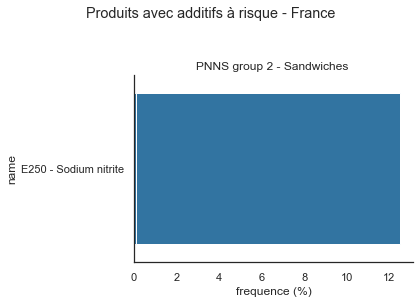

In [206]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_tag, 'pnns_groups_2', 'Sandwiches')
 .pipe(plot_unsafe_additives, nb=12,
       titre='Produits avec additifs à risque - France',
       soustitre='PNNS group 2 - Sandwiches')
 )
to_png('presence_additifs_nocifs_France_sandwiches_bar')


In [207]:
# TODO:
# - cols mod risk (count), haut risk (count), addiscore (grade)
# - get dummies
# - heatmap pnns_groups_1 pnns_groups_2 count for each column


###  Trouve des 'bons' et 'mauvais' produits dans des groupes PNNS 2 de risque élevés


"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


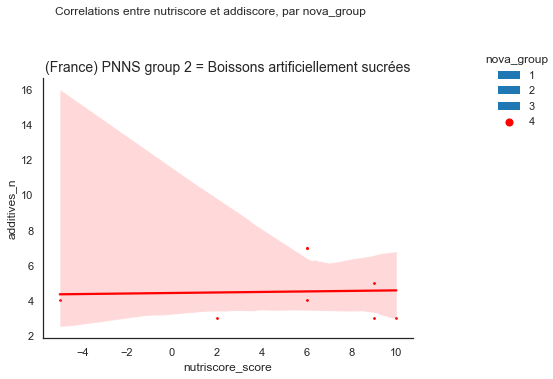

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


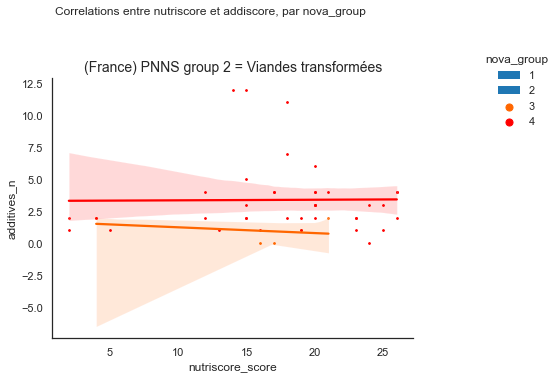

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


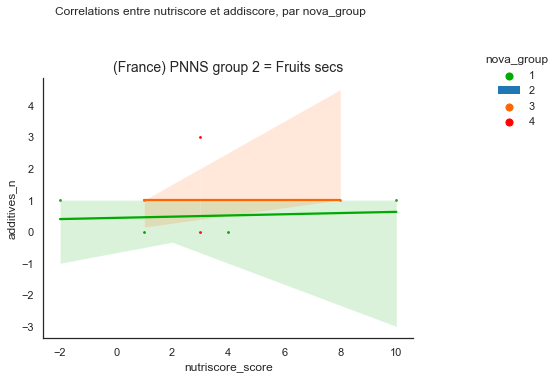

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


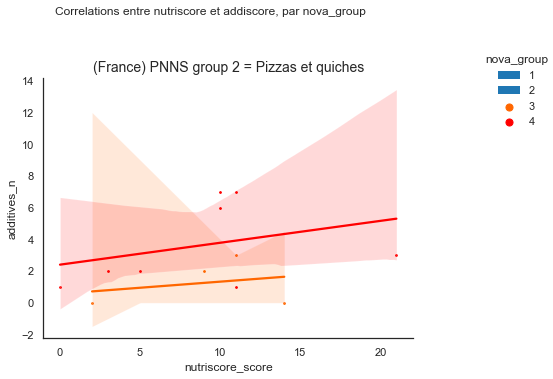

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


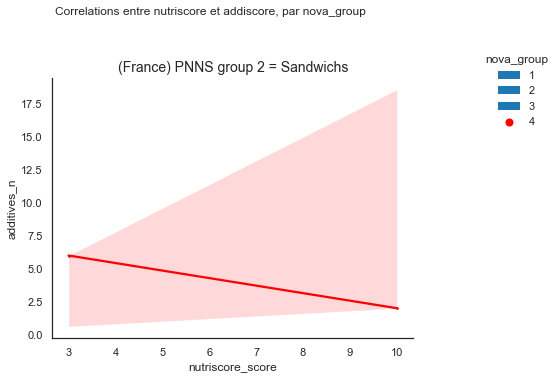

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


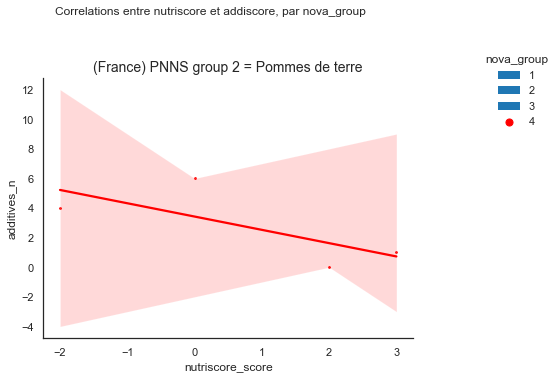

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


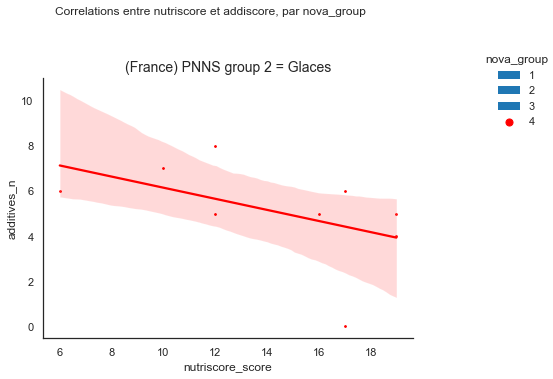

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


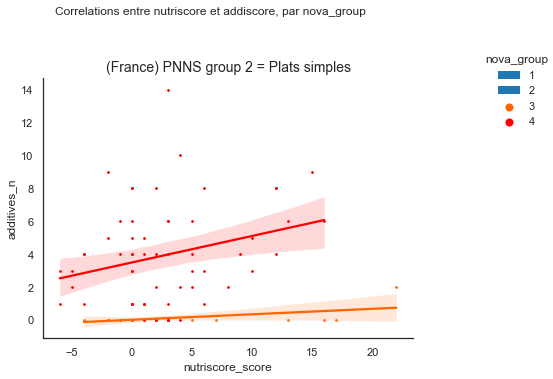

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


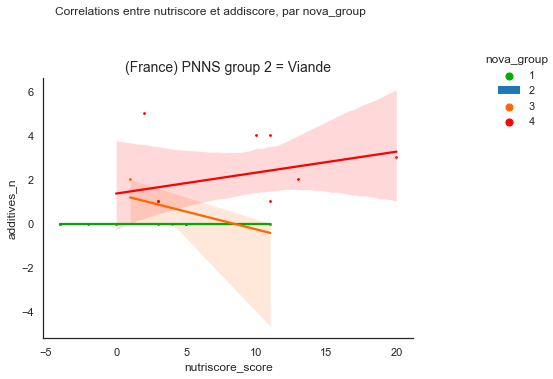

"regression_additives_n_vs_nutriscore_score_hue_nova_group_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nova_group_lmplot.png"


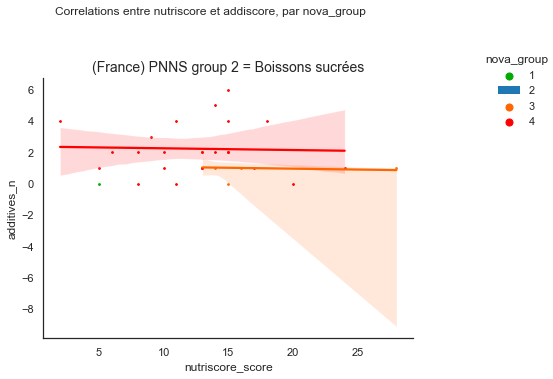

In [208]:
def get_produits_by_pnns_group_2(df:pd.DataFrame, pnns_2_group='Processed meat', nova_group=None):
    return (df
            .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=[pnns_2_group])
            # .pipe(filter_by_nova_group,nova_group)
            )


def plot_produits_par_pnns_group(df:pd.DataFrame, categs=groupes_a_risque_eleves):
    for categ in categs:
        (df.pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
         .pipe(plot_reg, hue='nova_group')
         )
        plt.suptitle('Correlations entre nutriscore et addiscore, par nova_group', size=12, y=1.05)
        plt.title(f'(France) PNNS group 2 = {traduire_categories([categ])[0]}', size=14)
        plt.tight_layout()
        to_png(f'regression_nutriscore_vs_addiscore_hue_nova_group_lmplot')
        plt.show()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_produits_par_pnns_group)
 )

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


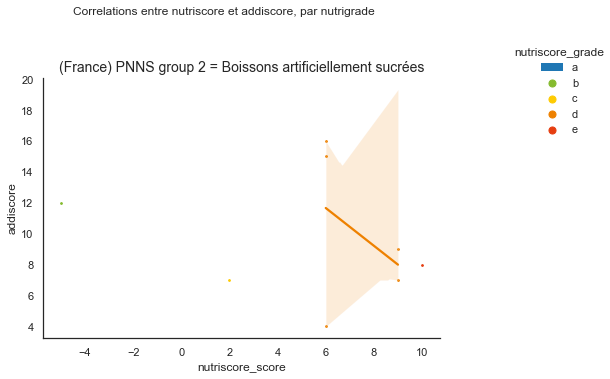

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


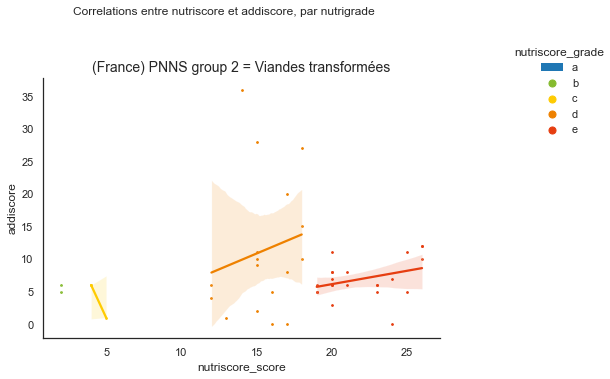

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


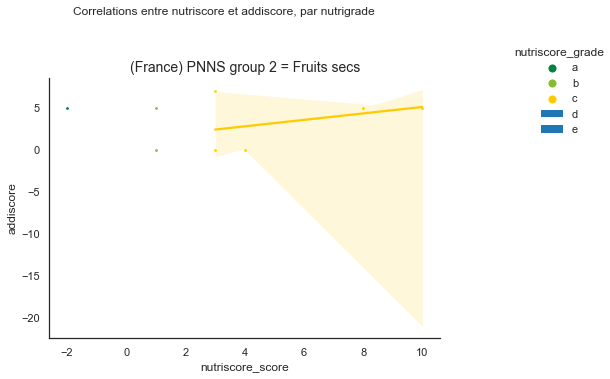

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


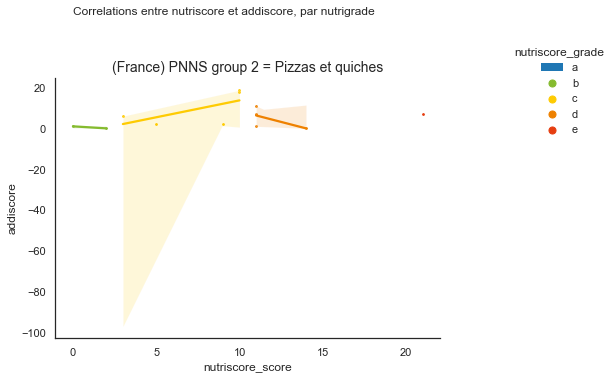

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


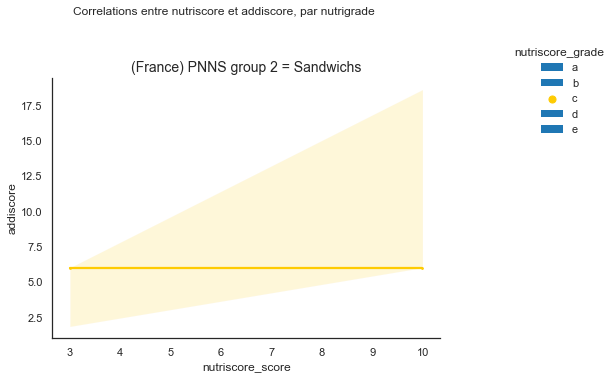

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


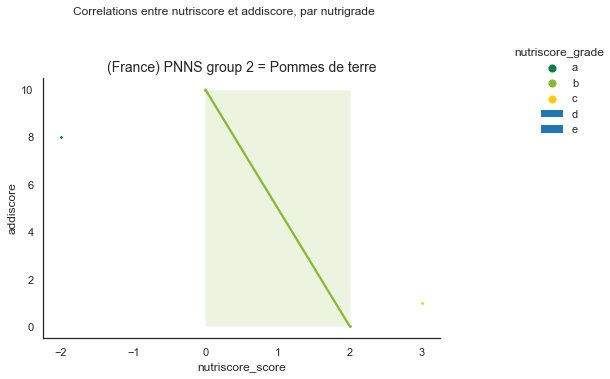

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


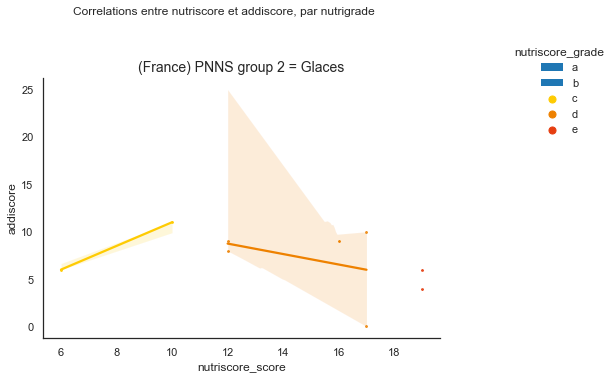

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


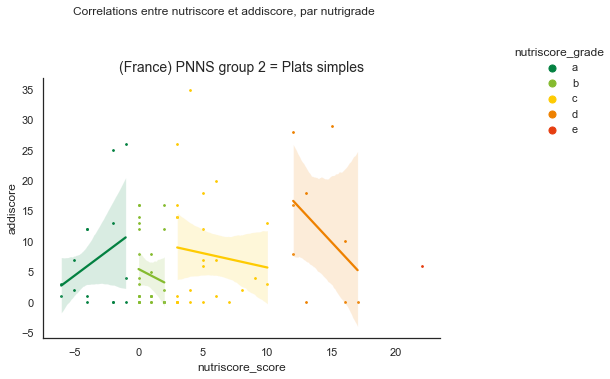

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


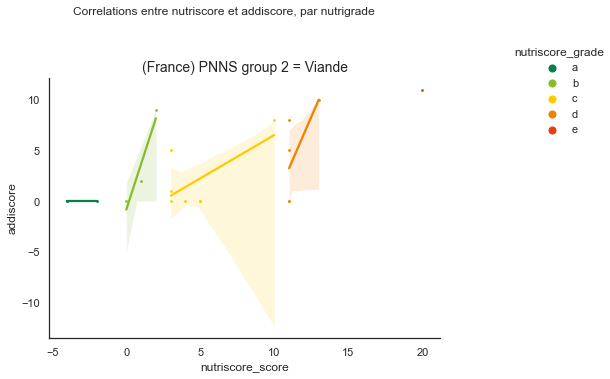

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


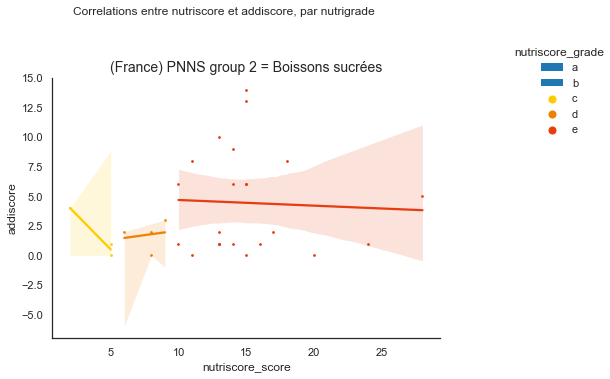

In [209]:
def plot_produits_par_pnns_group2(df:pd.DataFrame, categs=groupes_a_risque_eleves):
    for categ in categs:
        (df
         .pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
         .pipe(plot_reg, y_var='addiscore', hue='nutriscore_grade')
         )
        plt.suptitle('Correlations entre nutriscore et addiscore, par nutrigrade', size=12, y=1.05)
        plt.title(f'(France) PNNS group 2 = {traduire_categories([categ])[0]}', size=14)
        plt.tight_layout()
        to_png(f'regression_nutriscore_vs_addiscore_hue_nutrigrade_lmplot')
        plt.show()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_produits_par_pnns_group2)
 )

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


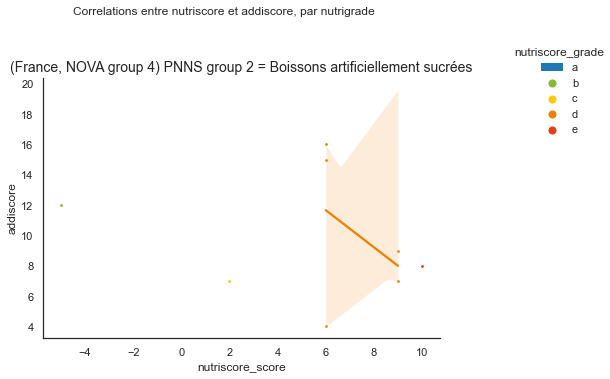

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


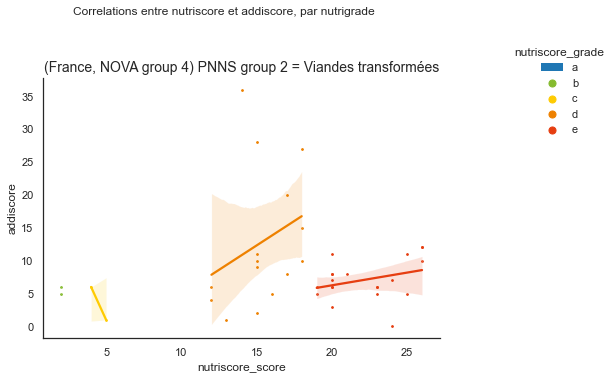

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


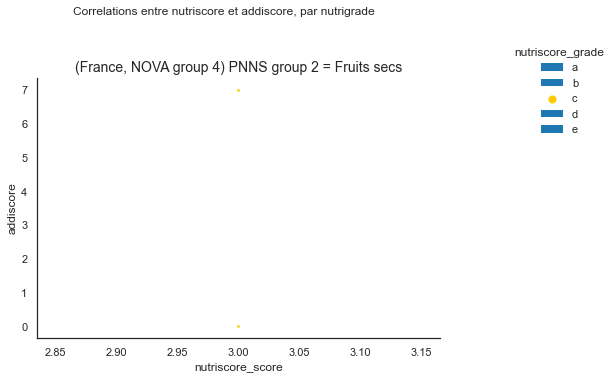

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


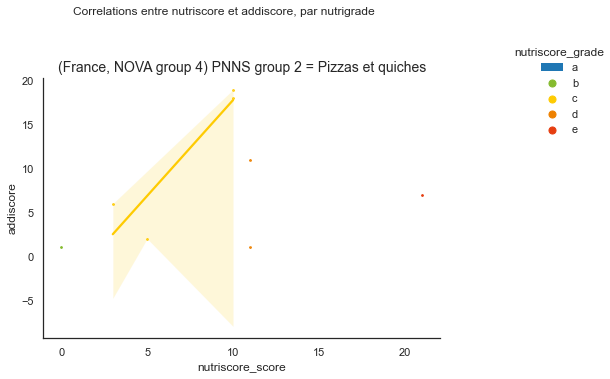

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


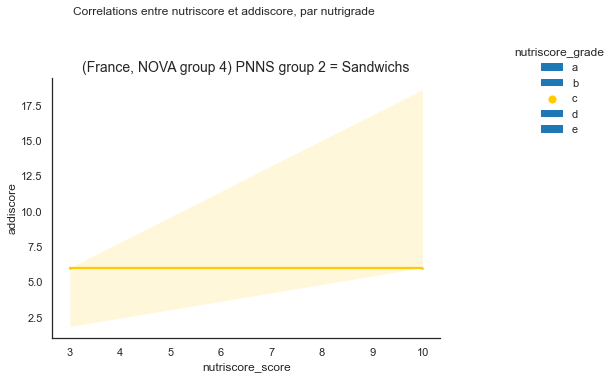

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


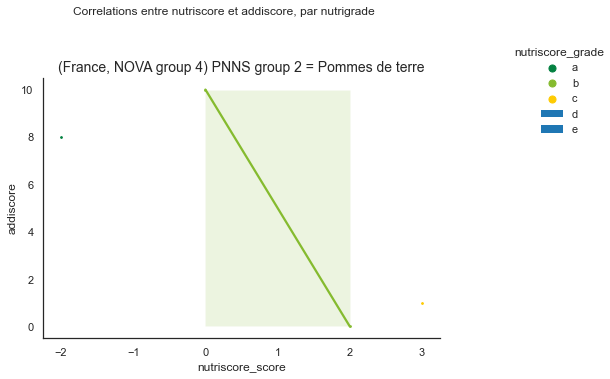

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


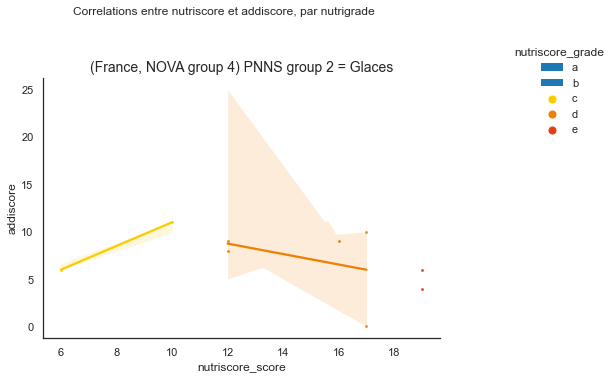

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


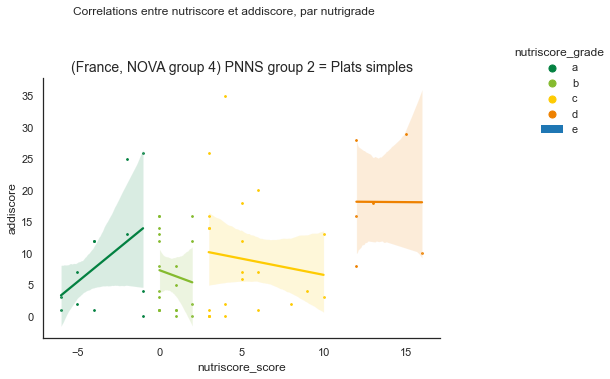

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


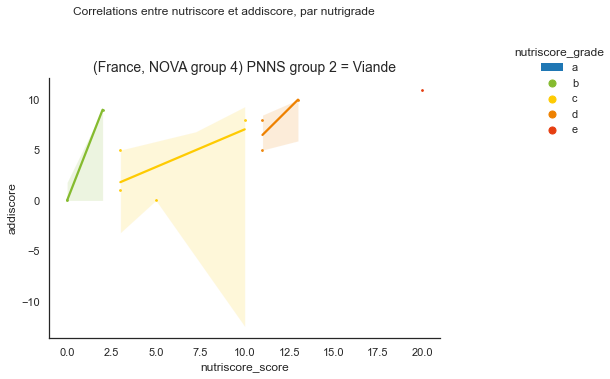

"regression_addiscore_vs_nutriscore_score_hue_nutriscore_grade_lmplot.png"
"regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot.png"


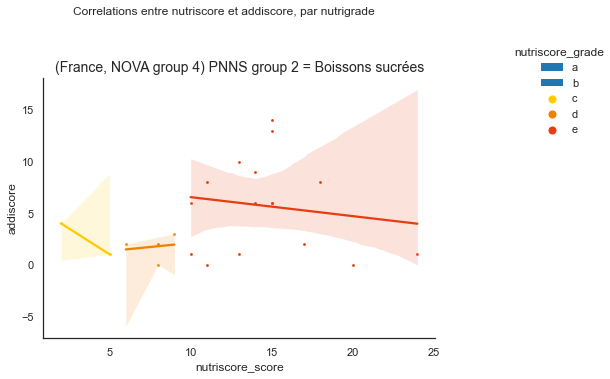

In [210]:
def plot_produits_par_pnns_group3(df:pd.DataFrame, categs=groupes_a_risque_eleves):
    for categ in categs:
        (df
         .pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
         .pipe(filter_by_nova_group, 4)
         .pipe(plot_reg, y_var='addiscore', hue='nutriscore_grade')
         )
        plt.suptitle('Correlations entre nutriscore et addiscore, par nutrigrade', size=12, y=1.05)
        plt.title(f'(France, NOVA group 4) PNNS group 2 = {traduire_categories([categ])[0]}', size=14)
        plt.tight_layout()
        to_png(f'regression_nova4_nutriscore_vs_addiscore_hue_nutrigrade_lmplot')
        plt.show()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_produits_par_pnns_group3)
 )

In [211]:
def top_produits_by_addiscore_rank(df:pd.DataFrame, pnns_2_group='Processed meat', nb=10):
    data = (df
            .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=[pnns_2_group])
            .pipe(filter_by_nova_group, 4)
            .dropna(subset=['addiscore'])
            .sort_values(by='addiscore')
            )
    nb = min(nb, len(data))
    return data.head(nb)


produits = (cleaned_data
            .pipe(filter_by_country, 'France')
            .pipe(top_produits_by_addiscore_rank, nb=1000000)
            .pipe(filter_by_tag, 'addiscore_risk', 'A_none')
            .sort_values(by='nutriscore_score')
            )
produits[['product_name', 'brands_tags', 'nutriscore_grade', 'addiscore', 'addiscore_risk']].head(5)

,product_name,brands_tags,nutriscore_grade,addiscore,addiscore_risk
586,Salami,destani,e,0.0,A_none


### Produit quadrants pour les produits avec risques élevés

- TODO

Get produits pour chaque catégorie :
- high_nutriscore, high_addiscore
- high_nutriscore, low_addiscore
- low_nutriscore, high_addiscore
- low_nutriscore, low_addiscore

### Fréquence des groupes de ADDISCORE risque par NUTRISCORE grade


In [212]:
(pd.crosstab(cleaned_data['nutriscore_grade'], cleaned_data['addiscore_risk'],
             normalize='index', margins=True) * 100).style.background_gradient()


addiscore_risk,A_none,B_low,C_mod,D_high
nutriscore_grade,,,,
a,65.24,24.22,1.14,9.40
b,40.26,32.27,2.56,24.92
c,38.91,32.66,1.61,26.81
d,30.19,35.19,5.29,29.33
e,19.74,40.78,4.34,35.14
All,36.64,33.71,3.32,26.34


In [213]:
def addiscore_by_category(df:pd.DataFrame, col):
    ret = df[[col, 'addiscore']].copy()
    print(ret.columns)
    ret.loc[:, col] = ret.loc[:, col].str.split(',')
    ret = ret.explode(col)
    # piv = ret.pivot_table(columns=[col],values=['unsafe'], aggfunc=['count','mean'])
    piv = ret.groupby(col).agg(['mean', 'count']).droplevel(0, axis=1)
    piv['mean'] = piv['mean']
    return piv


(cleaned_data
 .pipe(addiscore_by_category, 'nova_group'))


Index(['nova_group', 'addiscore'], dtype='object')


,mean,count
nova_group,,
1,0.16,249
2,0.00,25
3,0.82,596
4,5.86,1450


In [214]:
def plot_hbar_mean_count(df:pd.DataFrame, categ='nova_group', nb=10):
    palette = get_palette(categ)
    print(f'{categ} : {palette}')
    print(df)
    ax = sns.barplot(data=df, y=df.index,
                     x=df['mean'], palette=get_palette(categ))


Index(['nova_group', 'addiscore'], dtype='object')
nova_group : {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
            mean  count
nova_group             
1           0.16     93
2           0.00     10
3           0.80    202
4           5.21    510


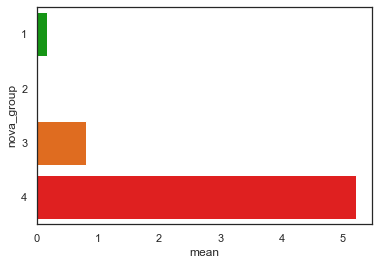

In [215]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nova_group')
 .pipe(plot_hbar_mean_count, categ='nova_group')
 )


Index(['nutriscore_grade', 'addiscore'], dtype='object')
nutriscore_grade : {'a': '#038141', 'b': '#85bb2f', 'c': '#fecb02', 'd': '#ee8100', 'e': '#e63e11'}
                  mean  count
nutriscore_grade             
a                 1.42    113
b                 2.82    109
c                 3.45    176
d                 4.45    238
e                 3.90    179


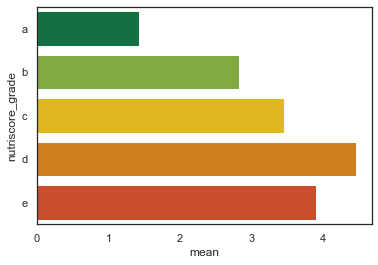

In [216]:
add_data = (cleaned_data
            .pipe(filter_by_country, 'France'))

(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nutriscore_grade')
 .pipe(plot_hbar_mean_count, categ='nutriscore_grade')
 )


In [217]:
unsafe_pnns1 = addiscore_by_category(
    add_data, 'pnns_groups_1').sort_values(by='mean', ascending=False)
unsafe_pnns1


Index(['pnns_groups_1', 'addiscore'], dtype='object')


,mean,count
pnns_groups_1,,
Composite foods,6.91,93
Fish Meat Eggs,5.48,91
Sugary snacks,3.51,192
Milk and dairy products,3.03,76
Beverages,3.00,76
Fat and sauces,2.24,46
Salty snacks,2.00,55
Cereals and potatoes,1.41,79
Fruits and vegetables,1.19,54


In [218]:
addiscore_by_category(add_data, 'pnns_groups_2').sort_values(
    by='mean', ascending=False)


Index(['pnns_groups_2', 'addiscore'], dtype='object')


,mean,count
pnns_groups_2,,
Artificially sweetened beverages,9.75,8
Processed meat,8.39,44
One-dish meals,7.05,79
Ice cream,7.00,9
Pizza pies and quiches,6.17,12
...,...,...
Soups,0.25,4
Fruit juices,0.00,11
Fats,0.00,10


In [219]:
addiscore_by_category(add_data, 'countries_en').sort_values(
    by='count', ascending=False).head(10)


Index(['countries_en', 'addiscore'], dtype='object')


,mean,count
countries_en,,
France,3.48,815
Belgium,3.32,34
Switzerland,1.37,30
Germany,2.55,29
United States,3.86,21
Spain,3.43,21
United Kingdom,6.25,8
Austria,1.83,6
Italy,5.67,6


In [220]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


pnns_groups_1                                  
                         count unique                   top freq
nutriscore_grade                                                
a                          319      9  Cereals and potatoes  104
b                          257      9       Composite foods   52
c                          371      9       Composite foods   62
d                          525      9         Sugary snacks  169
e                          403      8         Sugary snacks  237

In [221]:
cleaned_data.groupby('nova_group').describe().T


nova_group              1     2       3        4
additives_n count  249.00  25.0  596.00  1450.00
            mean     0.10   0.0    0.45     3.35
            std      0.31   0.0    0.84     3.26
            min      0.00   0.0    0.00     0.00
            25%      0.00   0.0    0.00     1.00
...                   ...   ...     ...      ...
addiscore   min      0.00   0.0    0.00     0.00
            25%      0.00   0.0    0.00     1.00
            50%      0.00   0.0    0.00     4.00
            75%      0.00   0.0    1.00     8.00
            max      5.00   0.0   16.00    55.00

[136 rows x 4 columns]

In [222]:
pd.set_option('display.max_rows', 10)


## 6.6 Analyse temporelle d'addiscore risk

### 6.6.1 Est-ce que le pourcentage de produits de haut risque a baissé pendant le temps ?


#### 6.6.1.1 Fréquence de groupes d'addiscore risque par an (Etats Unis)


"Distribution_addiscore_par_année_(united_states).png"


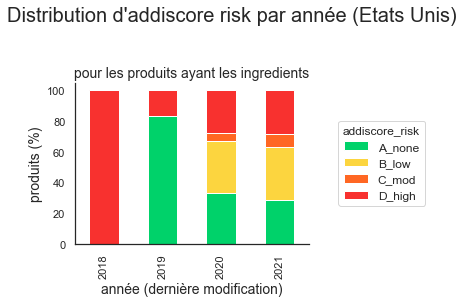

In [223]:
(cleaned_data
 .pipe(filter_by_country, 'united states')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (Etats Unis)",
       soustitre='pour les produits ayant les ingredients')
 )
to_png('Distribution_addiscore_par_année_(united states)')


#### 6.6.1.2 Fréquence de groupes d'addiscore risque par an (France)


"Distribution_addiscore_par_année_(France).png"


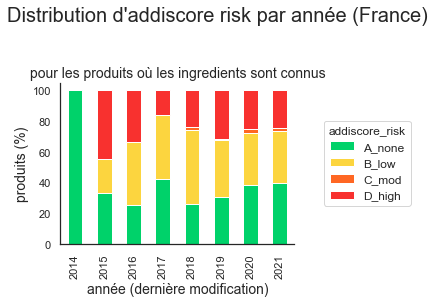

In [224]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits où les ingredients sont connus')
 )
to_png('Distribution_addiscore_par_année_(France)')


#### 6.6.1.3 Fréquence des groupes addiscore pour le nova_score categories 3 et 4


"Distribution_addiscore_NOVA_4_par_année_(France).png"


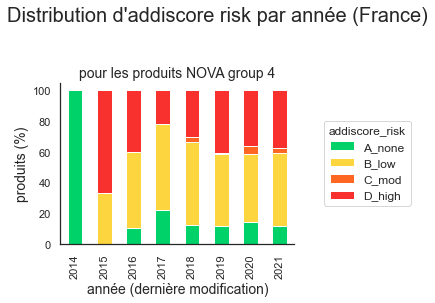

In [225]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(filter_by_tag, 'nova_group', '4')
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits NOVA group 4')
 )
to_png('Distribution_addiscore_NOVA_4_par_année_(France)')


"Distribution_addiscore_NOVA_3_par_année_(France).png"


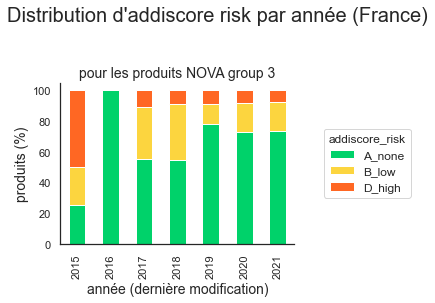

In [226]:

(cleaned_data
 .pipe(filter_by_country, 'france')
 .pipe(filter_by_year_last_modified, 2014, 2021)
 .pipe(filter_by_tag, 'nova_group', '3')
 .pipe(plot_groupvar_by_year,
       groupby_var='addiscore_risk',
       legend='addiscore_risk',
       palette=addiscore_palette,
       titre="Distribution d'addiscore risk par année (France)",
       soustitre='pour les produits NOVA group 3')
 )
to_png('Distribution_addiscore_NOVA_3_par_année_(France)')


#### 6.6.1.4 ➡️ Les pourcentages d'addiscore reste assez stable entre les années

- pour tester, il faut faire un test **chi-square** sur la table des frequences
  (qualitative-qualitative) - pas encore fait


### 6.6.2 Est-ce que le moyenne nombre d'additifs a changé au cours des années, pour chaque groupe  ?


"additifs_par_produit_-_Nutriscore_(France).png"


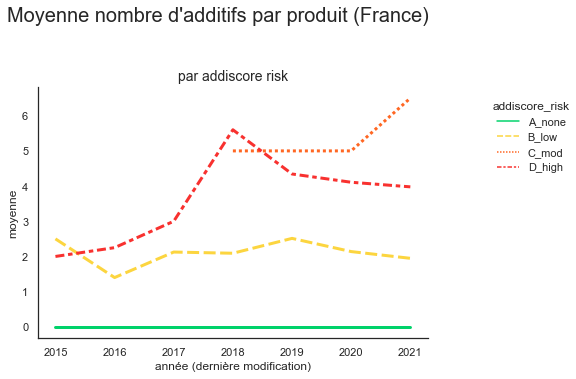

In [227]:
def plot_column_mean_by_addiscore_risk(df:pd.DataFrame, col='additives_n', titre='', soustitre=''):
    data = col_group_by_year(df, groupby_var='addiscore_risk',
                             date_col='last_modified_datetime', col=col, aggfunc='mean')
    relplot = True
    if relplot:
        g = sns.relplot(data=data, kind="line",
                        palette=addiscore_palette, linewidth=3)
        leg = g._legend
        leg.set_title('addiscore_risk')
        # coordinates of lower left of bounding box
        leg.set_bbox_to_anchor([1.3, 0.8])
        leg._loc = 1  # upper right
    else:
        # matplotlib
        ax = data.plot(kind='line', color=addiscore_palette.values())
        plt.legend(title=f'addiscore risk',
                   bbox_to_anchor=(1.5, 0.5), loc="upper right", fontsize=12,
                   bbox_transform=plt.gcf().transFigure)
    ax = plt.gca()
    ax.set_xlabel('année (dernière modification)')
    ax.set_ylabel('moyenne')
    sns.despine()
    plt.suptitle(titre, size=20, y=1.05)
    plt.title(soustitre, size=14)
    plt.tight_layout()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_year_created, 2015, 2021)
 .pipe(plot_column_mean_by_addiscore_risk,
       col='additives_n',
       titre="Moyenne nombre d'additifs par produit (France)",
       soustitre='par addiscore risk'
       )
 )
to_png("additifs par produit - Nutriscore (France)")


### Addiscore par NOVA group (mean, count)


In [228]:
def addiscore_by_category(df:pd.DataFrame, col):
    ret = df[[col, 'addiscore']].copy()
    print(ret.columns)
    ret.loc[:, col] = ret.loc[:, col].str.split(',')
    ret = ret.explode(col)
    piv = ret.groupby(col).agg(['mean', 'count']).droplevel(0, axis=1)
    piv['mean'] = piv['mean']
    return piv


(cleaned_data
 .pipe(addiscore_by_category, 'nova_group'))


Index(['nova_group', 'addiscore'], dtype='object')


,mean,count
nova_group,,
1,0.16,249
2,0.00,25
3,0.82,596
4,5.86,1450


In [229]:
def plot_hbar_mean_count(df:pd.DataFrame, categ='nova_group', nb=10):
    palette = get_palette(categ)
    print(f'{categ} : {palette}')
    print(df)
    ax = sns.barplot(data=df, y=df.index,
                     x=df['mean'], palette=get_palette(categ))


Index(['nova_group', 'addiscore'], dtype='object')
nova_group : {'1': '#00aa00', '2': '#ffcc00', '3': '#ff6600', '4': '#ff0000'}
            mean  count
nova_group             
1           0.16     93
2           0.00     10
3           0.80    202
4           5.21    510


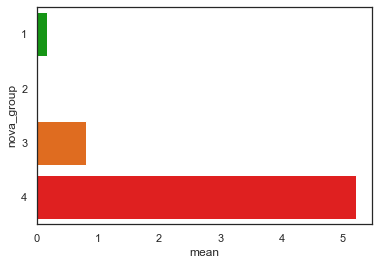

In [230]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nova_group')
 .pipe(plot_hbar_mean_count, categ='nova_group')
 )


Index(['nutriscore_grade', 'addiscore'], dtype='object')
nutriscore_grade : {'a': '#038141', 'b': '#85bb2f', 'c': '#fecb02', 'd': '#ee8100', 'e': '#e63e11'}
                  mean  count
nutriscore_grade             
a                 1.42    113
b                 2.82    109
c                 3.45    176
d                 4.45    238
e                 3.90    179


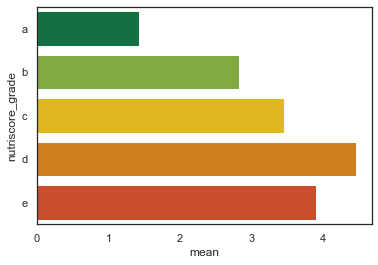

In [231]:
add_data = (cleaned_data
            .pipe(filter_by_country, 'France'))

(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(addiscore_by_category, 'nutriscore_grade')
 .pipe(plot_hbar_mean_count, categ='nutriscore_grade')
 )


### Addiscore par PNNS groups 1 (mean, count)
- on voit ci-dessous les groups plus à risque sont les 'composite foods', 'fish meat eggs' et 'sugary snacks'

In [232]:
unsafe_pnns1 = addiscore_by_category(
    add_data, 'pnns_groups_1').sort_values(by='mean', ascending=False)
unsafe_pnns1.style.background_gradient()


Index(['pnns_groups_1', 'addiscore'], dtype='object')


,mean,count
pnns_groups_1,,
Composite foods,6.91,93
Fish Meat Eggs,5.48,91
Sugary snacks,3.51,192
Milk and dairy products,3.03,76
Beverages,3.00,76
Fat and sauces,2.24,46
Salty snacks,2.00,55
Cereals and potatoes,1.41,79
Fruits and vegetables,1.19,54


### Addiscore par PNNS groups 2 (mean, count)
Les groups d'alimentation plus à risque (voi ci-dessous) sont:
- Sandwiches
- viandes préparés
- pizzas et quiches
- desserts lactées

In [233]:
addiscore_by_category(add_data, 'pnns_groups_2').sort_values(
    by='mean', ascending=False).style.background_gradient()


Index(['pnns_groups_2', 'addiscore'], dtype='object')


,mean,count
pnns_groups_2,,
Artificially sweetened beverages,9.75,8
Processed meat,8.39,44
One-dish meals,7.05,79
Ice cream,7.00,9
Pizza pies and quiches,6.17,12
Sandwiches,6.00,2
Potatoes,4.75,4
Biscuits and cakes,4.60,90
Pastries,4.44,9


In [234]:
addiscore_by_category(add_data, 'countries_en').sort_values(
    by='count', ascending=False).head(10).style.background_gradient()


Index(['countries_en', 'addiscore'], dtype='object')


,mean,count
countries_en,,
France,3.48,815
Belgium,3.32,34
Switzerland,1.37,30
Germany,2.55,29
United States,3.86,21
Spain,3.43,21
United Kingdom,6.25,8
Austria,1.83,6
Italy,5.67,6


In [235]:
cleaned_data[['pnns_groups_1', 'nutriscore_grade']].groupby(
    'nutriscore_grade').describe(percentiles=None)


pnns_groups_1                                  
                         count unique                   top freq
nutriscore_grade                                                
a                          319      9  Cereals and potatoes  104
b                          257      9       Composite foods   52
c                          371      9       Composite foods   62
d                          525      9         Sugary snacks  169
e                          403      8         Sugary snacks  237

In [236]:
pd.crosstab(cleaned_data['nova_group'],cleaned_data['addiscore_risk']).style.background_gradient(axis=1)


addiscore_risk,A_none,B_low,C_mod,D_high
nova_group,,,,
1,226,19,0,4
2,25,0,0,0
3,415,132,0,49
4,184,631,77,558


In [237]:
cleaned_data.groupby('pnns_groups_1').describe().T


pnns_groups_1      Beverages  Cereals and potatoes  Composite foods  \
additives_n count     154.00                240.00           186.00   
            mean        1.75                  1.43             3.17   
            std         2.01                  2.24             3.76   
            min         0.00                  0.00             0.00   
            25%         0.00                  0.00             0.00   
...                      ...                   ...              ...   
addiscore   min         0.00                  0.00             0.00   
            25%         0.00                  0.00             0.00   
            50%         1.00                  0.00             2.00   
            75%         6.00                  2.00            11.75   
            max        18.00                 21.00            42.00   

pnns_groups_1      Fat and sauces  Fish Meat Eggs  Fruits and vegetables  \
additives_n count          163.00          205.00                 136.00   
            mean             1.36            2.02                   0.82   
            std              2.02            2.33                   1.76   
            min              0.00            0.00                   0.00   
            25%              0.00            0.00                   0.00   
...                           ...             ...                    ...   
addiscore   min              0.00            0.00                   0.00   
            25%              0.00            0.00                   0.00   
            50%              1.00            5.00                   0.00   
            75%              2.00            8.00                   1.00   
            max             26.00           36.00                  20.00   

pnns_groups_1      Milk and dairy products  Salty snacks  Sugary snacks  
additives_n count                   247.00         86.00         458.00  
            mean                      1.71          1.17           3.41  
            std                       2.04          1.69           3.97  
            min                       0.00          0.00           0.00  
            25%                       0.00          0.00           1.00  
...                                    ...           ...            ...  
addiscore   min                       0.00          0.00           0.00  
            25%                       0.00          0.00           1.00  
            50%                       1.00          0.00           2.00  
            75%                       4.50          2.00           7.00  
            max                      23.00         18.00          55.00  

[136 rows x 9 columns]

### Top additifs répresentés dans les produits

In [238]:
mod_risk_tags = mod_risk_additives['id'].to_list()
high_risk_tags = high_risk_additives['id'].to_list()


def additive_tags_to_labels(ax):
    w = ax.get_yticklabels()
    # mod_risk=get_additive_labels(mod_risk_tags)
    for item in list(w):
        item_tag = item.get_text()
        if item_tag in mod_risk_tags:
            item.set_color("#ff6723")  # orange
        elif item_tag in high_risk_tags:
            item.set_color("#f8312f")  # red
    labels = get_additive_labels([item.get_text()
                                  for item in ax.get_yticklabels()])
    ax.set_yticklabels(labels=labels)


#### Top additifs dans les produits (France)

"Top_additifs_red_répresentés_dans_les_produits_avec_ingredients.png"


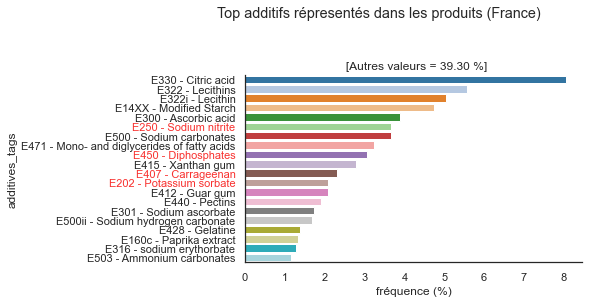

In [239]:


(cleaned_data
 .dropna(subset=['additives_n'])
 .pipe(filter_by_country, 'France')
 .pipe(plot_bar_top_n, col='additives_tags', nb=20,
       titre='Top additifs répresentés dans les produits (France)',
       ylabel='', normalize=True)
 )
additive_tags_to_labels(ax=plt.gca())

to_png('Top additifs red répresentés dans les produits avec ingredients')


### 1.2.2 Histogram plots - distribution de nutriscores par nova groupe


"distribution_nutriscore_par_nova_group_displot.png"


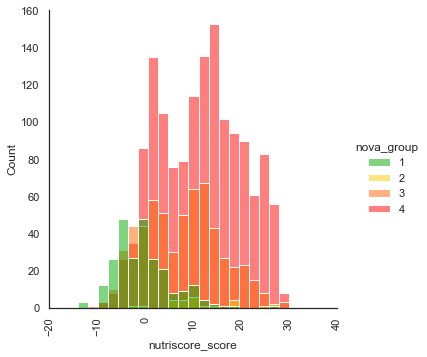

In [240]:
# g=sns.displot(cleaned_data,x='nutriscore_score',hue='nova_group',
# hue_order=nova_order,palette=nova_palette, kind='kde')
g = sns.displot(cleaned_data, x='nutriscore_score', hue='nova_group',
                hue_order=nova_order, palette=nova_palette)
g.set_xticklabels(rotation='vertical')
to_png('distribution_nutriscore_par_nova_group_displot')


"distribution_nutriscore_par_nova_group_et_pnns_facetgrid_displot.png"


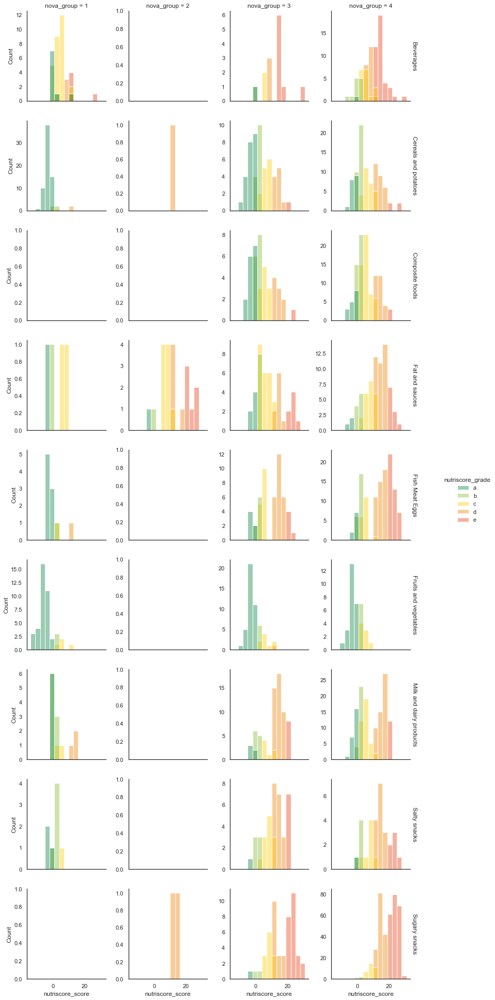

In [241]:
def unique_ordered(series: pd.Series) -> list:
    ret = list(series.dropna().unique().astype(str))
    if len(ret) > 100:
        return []
    ret.sort()
    return ret


# g = sns.FacetGrid(cleaned_data, col="nova_group", hue='nova_group', col_wrap=2, sharex=True,sharey=False)
# g.map(sns.displot, "nutriscore_score")


def plot_dist_facet(df:pd.DataFrame, x='nutriscore_score', col='nova_group', row="pnns_groups_1", hue='nutriscore_grade'):
    if df[x].dtype == 'object':
        df = df.sort_values(by=[x])
    col_order = None if col is None else unique_ordered(df[col])
    row_order = None if row is None else unique_ordered(df[row])
    hue_order = None if hue is None else unique_ordered(df[hue])
    g = sns.displot(df, x=x,
                    col=col, col_order=col_order,
                    row=row, row_order=row_order,
                    hue=hue, hue_order=hue_order,
                    palette=get_palette(hue),
                    binwidth=3, height=3, alpha=0.4, facet_kws=dict(margin_titles=True, sharey=False),
                    )
    # g.set_titles(col_template="{col_name}", row_template="{row_name}")
    g.set_titles(row_template="{row_name}")


cleaned_data.pipe(plot_dist_facet)
to_png('distribution_nutriscore_par_nova_group_et_pnns_facetgrid_displot')


"distribution_nutriscore_par_nova_group_facetgrid_displot.png"


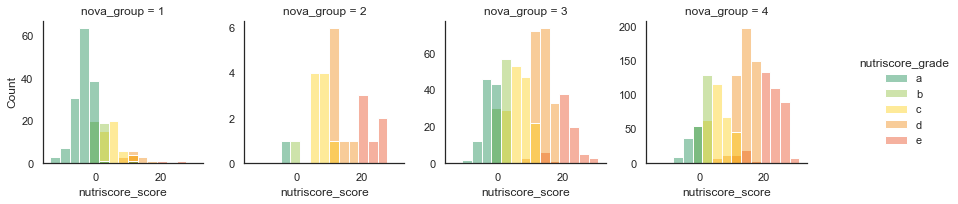

In [242]:

cleaned_data.pipe(plot_dist_facet, x='nutriscore_score',
                  col='nova_group', row=None)
to_png('distribution_nutriscore_par_nova_group_facetgrid_displot')


"distribution_nutriscore_par_addiscore_risk_facetgrid_displot.png"


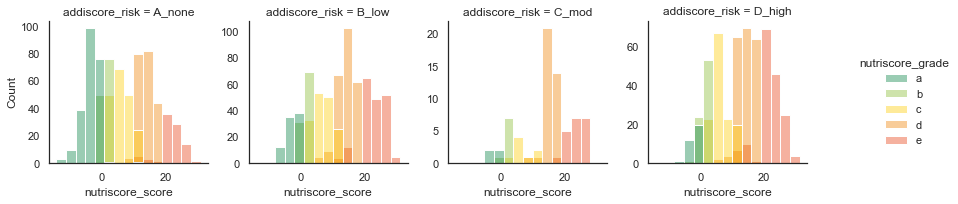

In [243]:
cleaned_data.pipe(plot_dist_facet, x='nutriscore_score',
                  col='addiscore_risk', row=None)
to_png('distribution_nutriscore_par_addiscore_risk_facetgrid_displot')


"distribution_nutriscore_par_nova_group_pnns_facetgrid_histplot.png"


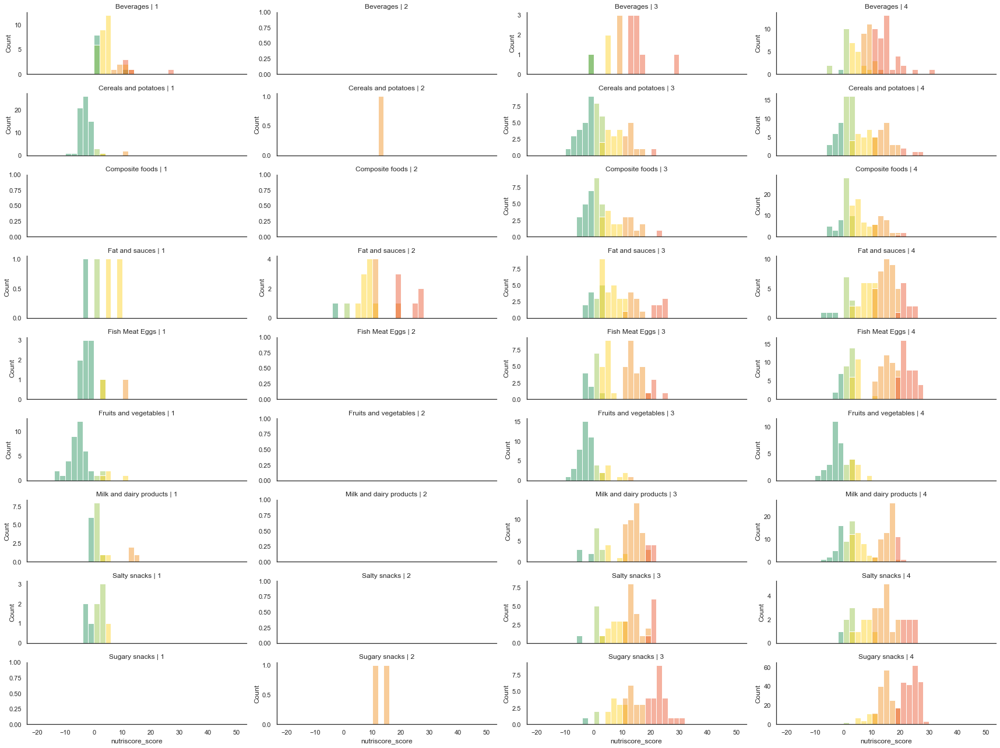

In [244]:
#
def plot_dist_facets(df:pd.DataFrame, x='nutriscore_score', col='nova_group', row="pnns_groups_1", hue='nutriscore_grade'):
    if df[x].dtype == 'object':
        df = df.sort_values(by=[x])
    col_order = None if col is None else unique_ordered(df[col])
    row_order = None if row is None else unique_ordered(df[row])
    hue_order = None if hue is None else unique_ordered(df[hue])
    g = sns.FacetGrid(df,
                      col=col, col_order=col_order,
                      row=row, row_order=row_order,
                      hue=hue, hue_order=hue_order,
                      palette=get_palette(hue),
                      aspect=3,
                      height=2,
                      sharex=True,
                      sharey=False,
                      )
    g.map_dataframe(sns.histplot, x="nutriscore_score",
                    alpha=0.4, binwidth=2, binrange=(-20, 50))
    g.set_titles(col_template="{col_name}", row_template="{row_name}")
    g.tight_layout()


cleaned_data.pipe(plot_dist_facets)
to_png('distribution_nutriscore_par_nova_group_pnns_facetgrid_histplot')


### Repartitions par tag

- plot les {top_n} tags, reparties entre un score


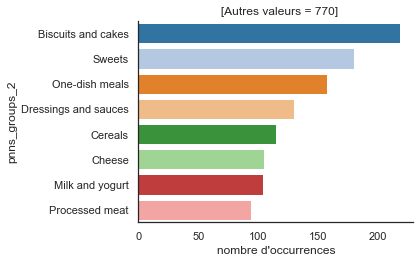

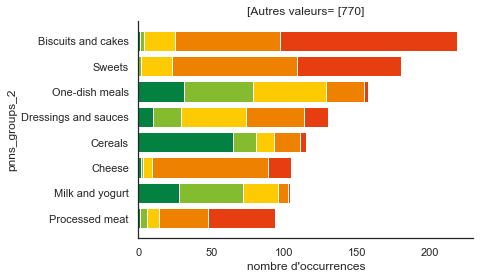

In [245]:
def plot_barh_stacked(df:pd.DataFrame, y_var, groupby_var, sort_counts=True, nb=8):
    ct = pd.crosstab(df[y_var], df[groupby_var])
    groups = list(ct.columns)
    other_count = 0
    for i in range(1, len(groups)):
        ct.iloc[:, i] = ct.iloc[:, i] + ct.iloc[:, i - 1]
    if sort_counts:
        # Assign sum of all rows of DataFrame as a new Row
        ct = ct.sort_values(by=ct.columns[-1], axis=0, ascending=False)
        nb = min(len(ct), nb)
        other_count = ct.iloc[nb:, -1].sum()
        ct = ct.head(nb)
        # plt.barh starts from bottom
        ct = ct.sort_values(by=ct.columns[-1], axis=0, ascending=True)

    # prepare to plot

    palette = get_palette(groupby_var)
    if palette is None:
        colors = plt.cm.get_cmap('spectral',len(groups))
    else:
        colors = list(palette.values())
    plt.figure()
    for i in range(len(groups) - 1, -1, -1):
        plt.barh(ct.index, ct[groups[i]], color=colors[i])
    ax = plt.gca()
    ax.set_title(f'[Autres valeurs= [{other_count}]')
    ax.set_xlabel("nombre d'occurrences")
    ax.set_ylabel(y_var)
    sns.despine()


(cleaned_data
 .dropna(subset=['pnns_groups_2', 'nutriscore_grade'])
 .pipe(plot_bar_top_n, 'pnns_groups_2', nb=8)
 )

plt.show()
cleaned_data.pipe(plot_barh_stacked, 'pnns_groups_2', 'nutriscore_grade', nb=8)


nutriscore_grade                              a  b  c  d  e  sum
additives_en                                                    
E330 - Citric acid                            5  3  6  4  5   23
E300 - Ascorbic acid                          7  3  2  1  2   15
E14XX - Modified Starch                       4  5  4  1  0   14
E322 - Lecithins                              0  0  0  1  4    5
E471 - Mono- and diglycerides of fatty acids  0  0  2  2  1    5


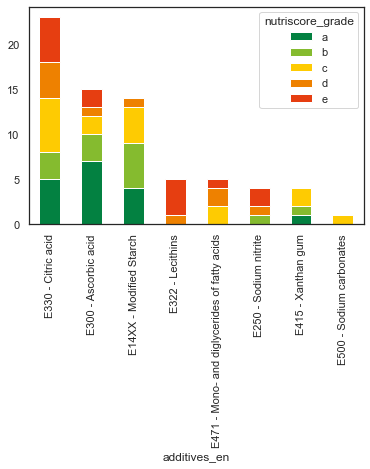

In [246]:
def plot_repartition_by_tag(df:pd.DataFrame, tag_column, nb=10, other_tags=False, sort_tags=False, score_column='nutriscore_grade',
                            palette=nutriscore_palette):
    top_n = filtre_par_top_freq(df, tag_column, nb=nb)
    top_tags = top_n.value_counts().index
    if sort_tags:
        top_tags = top_tags.sort_values()
    grades = df[score_column].dropna().unique().tolist()
    grades.sort()
    filtre = top_n.notnull() & df[score_column].notnull()
    if not other_tags:
        # 'exclut les autres tags'
        filtre &= top_n != 'other'
        filtre &= top_n != 'unknown'
    data = df[filtre]
    # .groupby([tag_column,score_column]).agg(['count'])
    ct = pd.crosstab(data[tag_column], data[score_column])
    sort_tags = True
    if sort_tags:
        # Assign sum of all rows of DataFrame as a new Row
        ct.loc[:, 'sum'] = ct.sum(axis=1)
        ct = ct.sort_values(by='sum', axis=0, ascending=False)
        print(ct.head())
        ct = ct.drop('sum', axis=1)

    groups = ct.index.unique()
    palette = get_palette(score_column)
    if palette:
        colors = palette.values()
    else:
        colors = plt.cm.get_cmap('spectral',len(groups))
    ct.plot(kind='bar', stacked=True, color=colors)


def plot_nutrigrade_by_tag(df:pd.DataFrame, tag_column, nb=10, other_tags=False, sort_tags=False):
    plot_repartition_by_tag(df, tag_column, nb, other_tags,
                            sort_tags=sort_tags, score_column='nutriscore_grade')


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_nutrigrade_by_tag, 'additives_en')
 )


en:e131|en:e407|en:e133|en:e339|en:e509|en:e200|en:e481|en:e223|en:e150c|en:e251|en:e220|en:e202|en:e407a|en:e451|en:e252|en:e341|en:e221|en:e211|en:e433|en:e435|en:e338|en:e473|en:e340|en:e224|en:e452|en:e250|en:e491|en:e222|en:e621|en:e960|en:e450
nutriscore_grade          a   b   c   d  e  sum
additives_en                                   
E330 - Citric acid       24  16  22  11  8   81
E440 - Pectins            1   3  10  12  0   26
E300 - Ascorbic acid      9   3   3   2  2   19
E415 - Xanthan gum        1   5   4   7  2   19
E14XX - Modified Starch   4   7   5   1  0   17


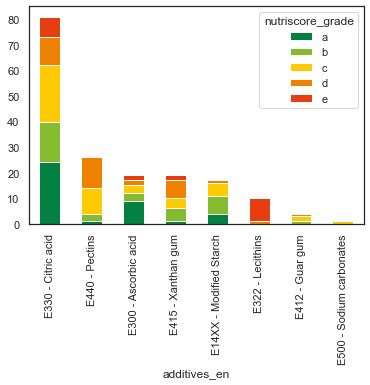

In [247]:
(cleaned_data
 .pipe(get_safe_products)
 .pipe(plot_repartition_by_tag,'additives_en')
 )

nutriscore_grade          b  c  d  e  sum
additives_en                             
E202 - Potassium sorbate  4  4  1  0    9
E250 - Sodium nitrite     1  0  4  3    8
E407 - Carrageenan        2  3  1  0    6
E450 - Diphosphates       0  0  0  1    1


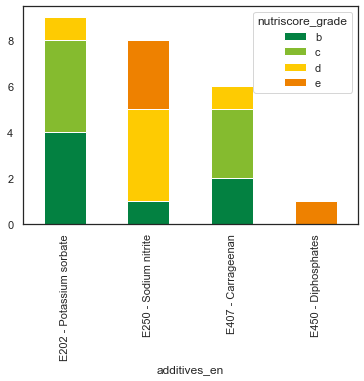

In [248]:
unsafe_products.pipe(plot_nutrigrade_by_tag, 'additives_en')


### 1.2.3 Nutriscore dans chaque catégorie PNNS_groups_1 et PNNS_groups_2 (box plots)


"distribution_nutriscore_par_pnns_groups_1_boxplot.png"


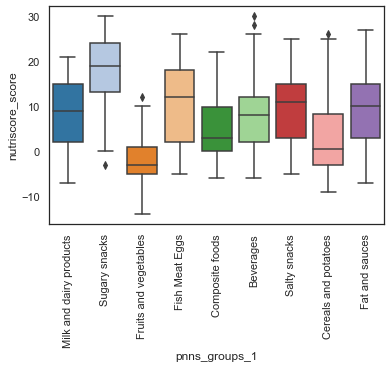

In [249]:

g = sns.boxplot(data=cleaned_data, x='pnns_groups_1', y='nutriscore_score')
labels = g.get_xticklabels()
g.set_xticklabels(labels, rotation='vertical')
to_png('distribution_nutriscore_par_pnns_groups_1_boxplot')


"distribution_nutriscore_par_pnns_groups_2_boxplot.png"


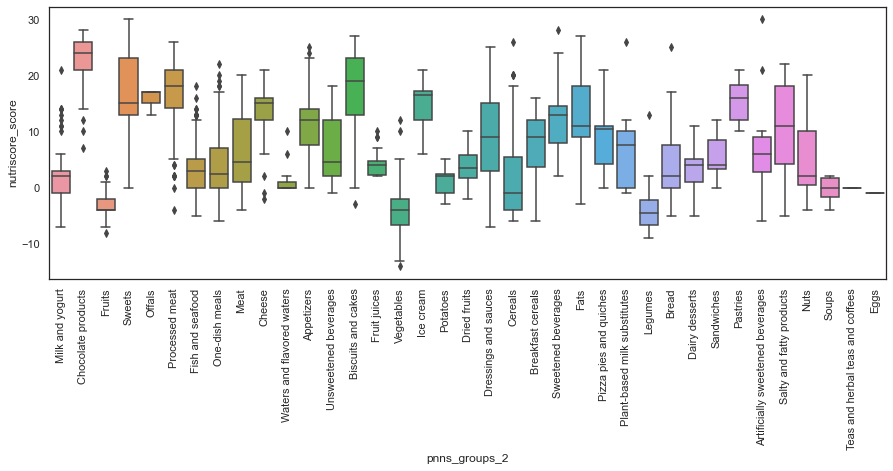

In [250]:
plt.figure(figsize=(15, 5))
g = sns.boxplot(data=cleaned_data, x='pnns_groups_2', y='nutriscore_score')
labels = g.get_xticklabels()
g.set_xticklabels(labels, rotation='vertical')
to_png('distribution_nutriscore_par_pnns_groups_2_boxplot')


###  nutriscore by PNNS group (histograms)


C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


"distribution_nutriscore_par_pnns_groups_1_kdeplot.png"


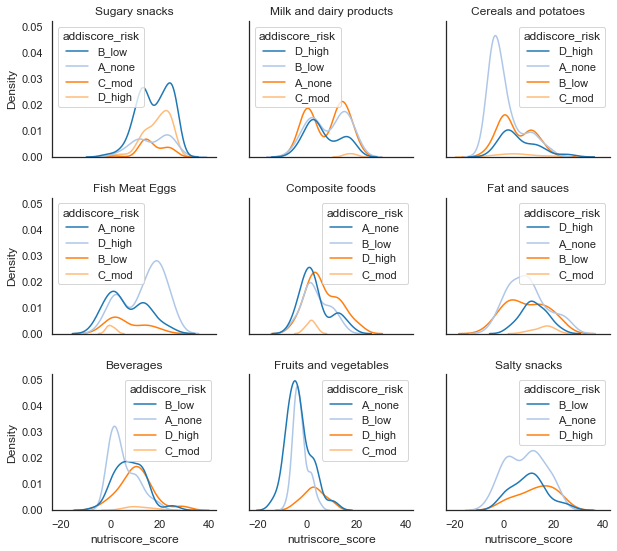

In [251]:
def plot_dist_nutriscore_by_pnns_group(df:pd.DataFrame, num_col='nutriscore_score', categ_col='pnns_groups_1', hue=None):
    df1 = df[[num_col, categ_col]].dropna()
    categories = df1[categ_col].value_counts(ascending=False)
    categories = categories[categories.values > 20].index
    if len(categories) > 12:
        categories = categories[:12]
    n_rows = len(categories) // 3
    if len(categories) % 3 > 0:
        n_rows += 1
    _, axs = plt.subplots(nrows=n_rows, ncols=3, figsize=(
        10, n_rows * 3), sharex='all', sharey='all')

    if hue is None:
        df = df[[num_col, categ_col]].dropna()
    else:
        df = df[[num_col, categ_col, hue]].dropna()
    cpt = 0
    for categ in categories:
        cpt += 1
        ax1 = plt.subplot(n_rows, 3, cpt)
        data = df[df[categ_col] == categ]
        g = sns.kdeplot(data=data, x=num_col, ax=ax1, hue=hue)
        g.set_title(categ)
        sns.despine()

    plt.subplots_adjust(hspace=0.3)
    to_png(f'distribution_nutriscore_par_{categ_col}_kdeplot')


cleaned_data.pipe(plot_dist_nutriscore_by_pnns_group,
                  hue='addiscore_risk', categ_col='pnns_groups_1')


C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


"distribution_nutriscore_par_pnns_groups_2_kdeplot.png"


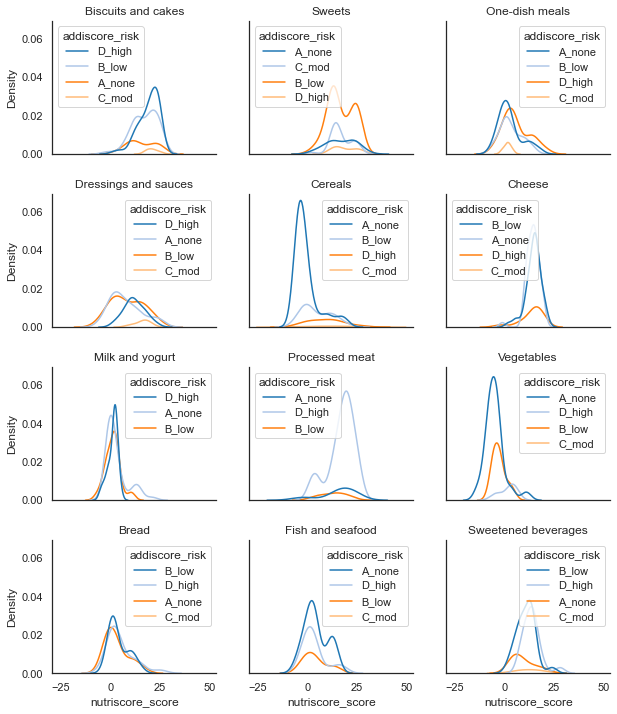

In [252]:
cleaned_data.pipe(plot_dist_nutriscore_by_pnns_group,
                  hue='addiscore_risk', categ_col='pnns_groups_2')


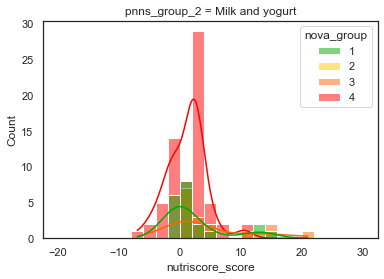

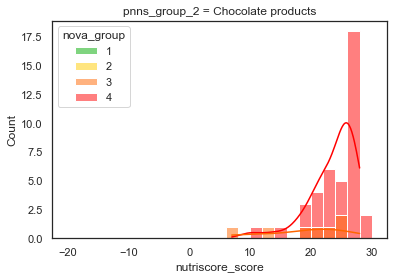

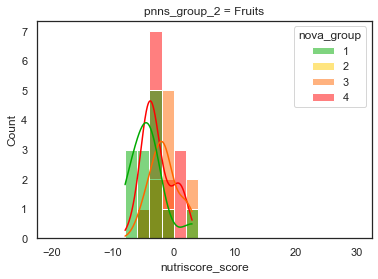

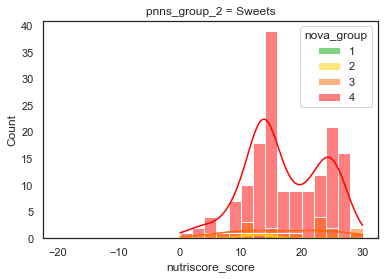

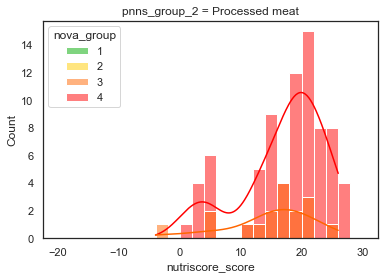

...

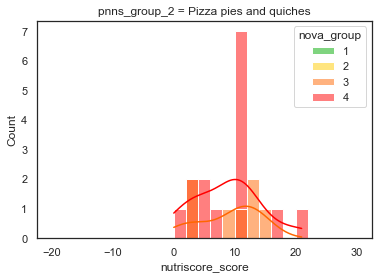

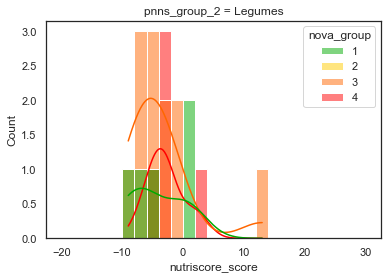

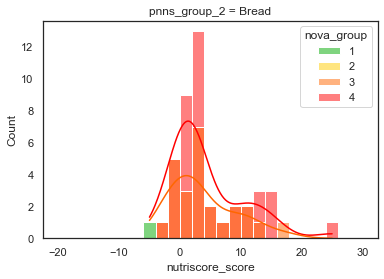

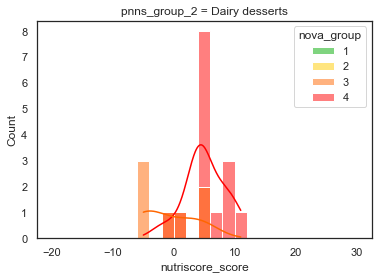

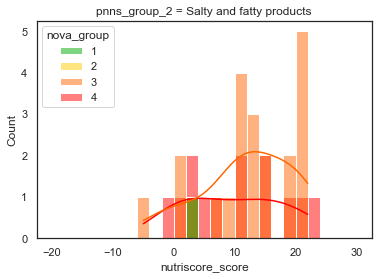

In [253]:
pnns_groups_1 = cleaned_data['pnns_groups_1'].dropna().unique()
pnns_groups_2 = cleaned_data['pnns_groups_2'].dropna().unique()


def plot_pnns_group_2_distributions(df:pd.DataFrame, hue='nova_group'):
    df = df.dropna(subset=['pnns_groups_1', 'pnns_groups_2',
                           'nutriscore_score', 'nova_group'])
    for grp in pnns_groups_2:
        data = df[df['pnns_groups_2'] == grp]
        if len(data) > 20:
            g = sns.histplot(data=data, x='nutriscore_score', hue='nova_group',
                             hue_order=nova_order,
                             palette=nova_palette,
                             binwidth=2,
                             binrange=(-20, 30),
                             kde=True)
            plt.title(f'pnns_group_2 = {grp}')
            plt.show()


cleaned_data.pipe(plot_pnns_group_2_distributions)


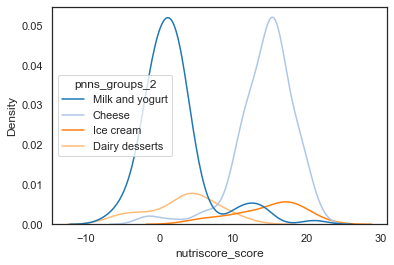

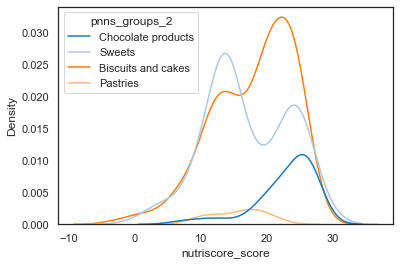

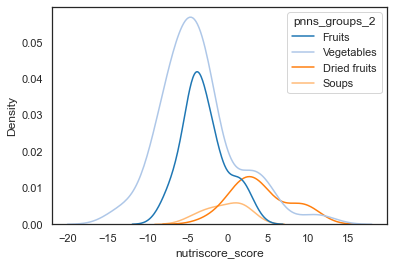

C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


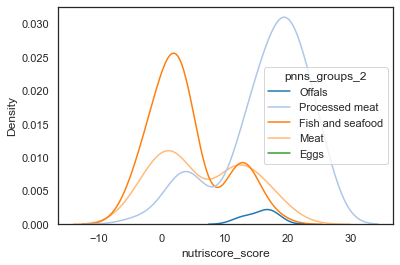

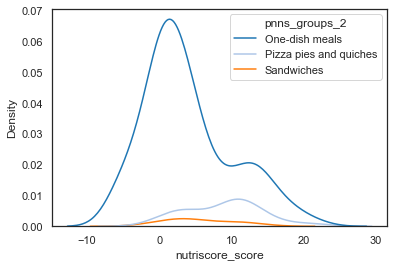

C:\Users\mc\anaconda3\envs\OC_2\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


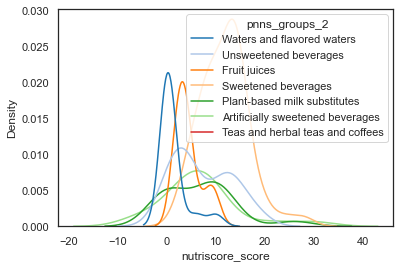

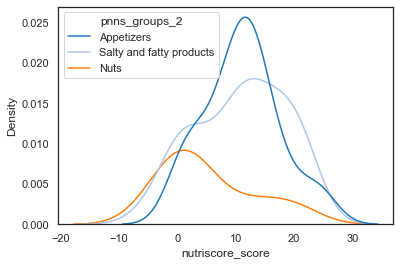

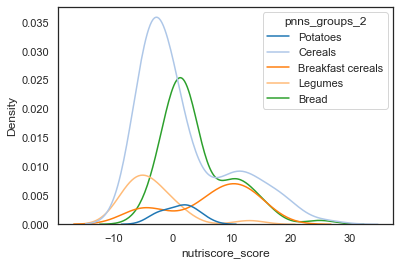

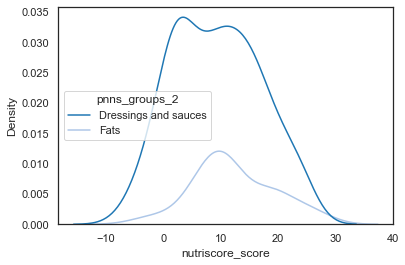

In [254]:
def plot_pnns_group_2_distributions(df:pd.DataFrame):
    for grp in pnns_groups_1:
        data = df[df['pnns_groups_1'] == grp]
        g = sns.kdeplot(data=data, x='nutriscore_score', hue='pnns_groups_2')
        plt.show()


cleaned_data.pipe(plot_pnns_group_2_distributions)


### 1.2.4 Box plots - variation de nutriscore par addiscore_risk dans chaque catégorie PNNS_group_2


"distribution_nutriscore_par_pnns_groups_1_hue_addiscore_boxplot.png"


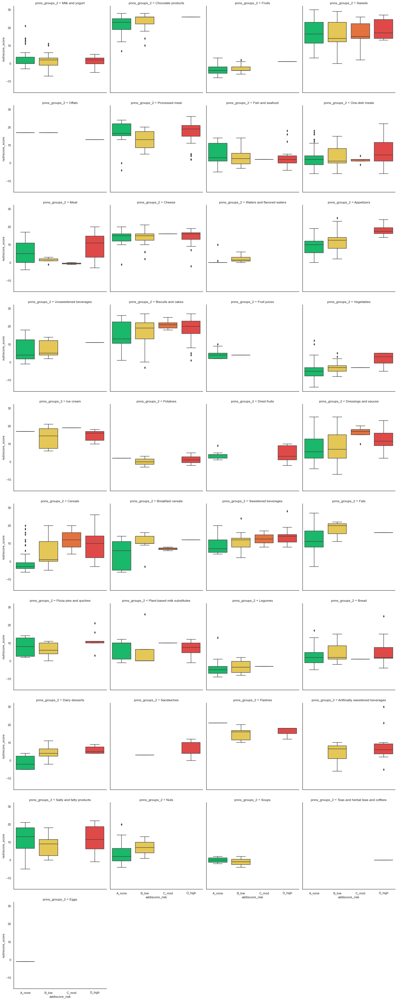

In [255]:
sns.catplot(
    data=cleaned_data, x='addiscore_risk', y='nutriscore_score',
    col='pnns_groups_2', palette=addiscore_palette, order=addiscore_order, kind='box', col_wrap=4, )
# sns.boxplot(data=cleaned_data, x='pnns_groups_1', y='nutriscore_score',hue='nutriscore_grade', palette=nutriscore_palette)
labels = g.get_xticklabels()
g.set_xticklabels(labels, rotation='vertical')
to_png('distribution_nutriscore_par_pnns_groups_1_hue_addiscore_boxplot')


### 2.2.4 Regression plot: nutriscore y saturated fats

Est-ce que la catégorie d'addiscore risk est corrélé avec la quantité de gras ?

"regression_saturated-fat_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"regression_sat_fat_vs_nutriscore_hue_addiscore_risk_lmplot.png"


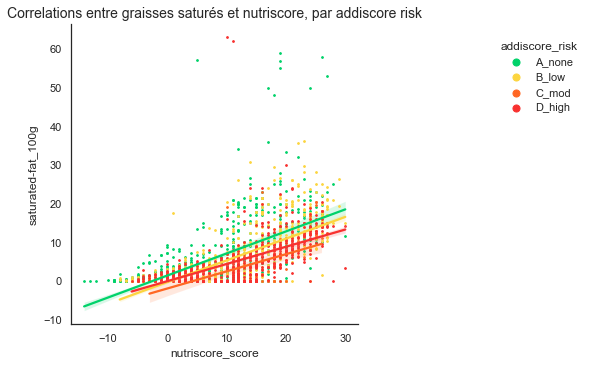

In [256]:

(cleaned_data[['nutriscore_score', 'saturated-fat_100g', 'addiscore_risk']]
 .dropna()
 .pipe(plot_reg, y_var='saturated-fat_100g', hue='addiscore_risk')
 )
plt.title('Correlations entre graisses saturés et nutriscore, par addiscore risk', size=14)
to_png(f'regression_sat_fat_vs_nutriscore_hue_addiscore_risk_lmplot')



"regression_fat_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_fat_100g_et_nutriscore,_par_addiscore_risk.png"


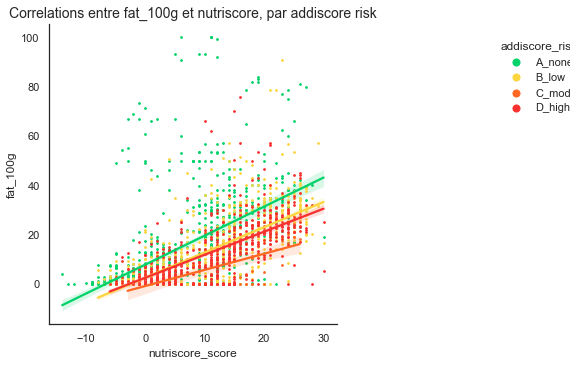

"regression_saturated-fat_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_saturated-fat_100g_et_nutriscore,_par_addiscore_risk.png"


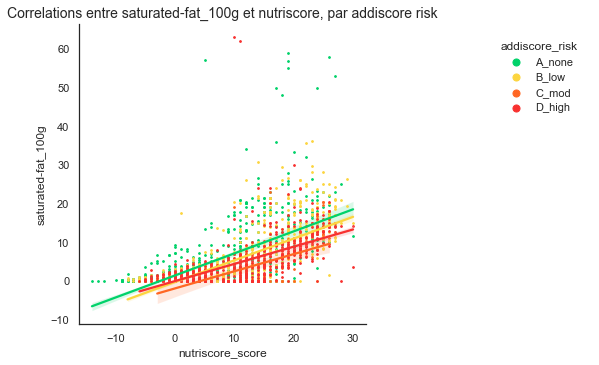

"regression_carbohydrates_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_carbohydrates_100g_et_nutriscore,_par_addiscore_risk.png"


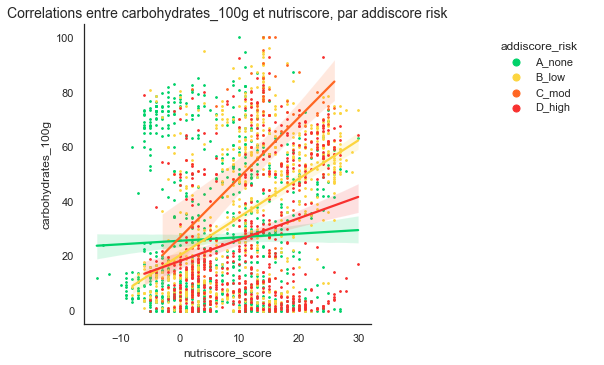

"regression_sugars_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_sugars_100g_et_nutriscore,_par_addiscore_risk.png"


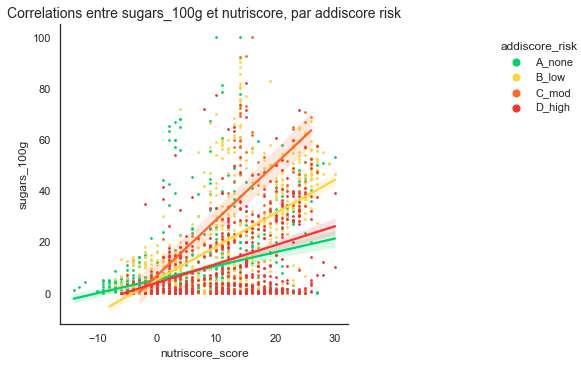

"regression_fiber_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_fiber_100g_et_nutriscore,_par_addiscore_risk.png"


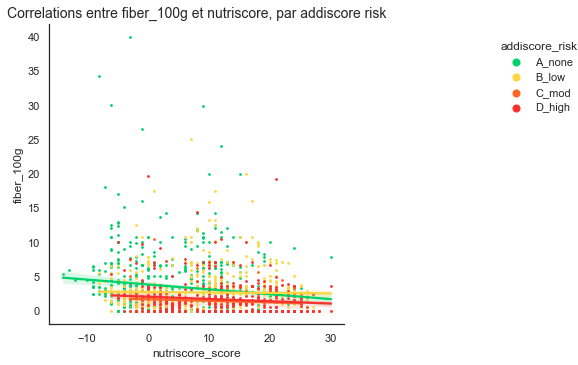

"regression_proteins_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_proteins_100g_et_nutriscore,_par_addiscore_risk.png"


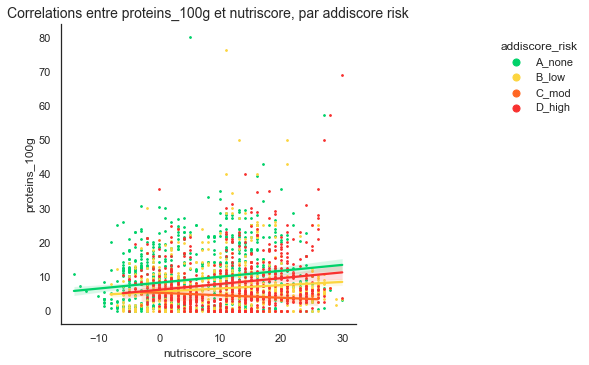

"regression_sodium_100g_vs_nutriscore_score_hue_addiscore_risk_lmplot.png"
"Correlations_entre_sodium_100g_et_nutriscore,_par_addiscore_risk.png"


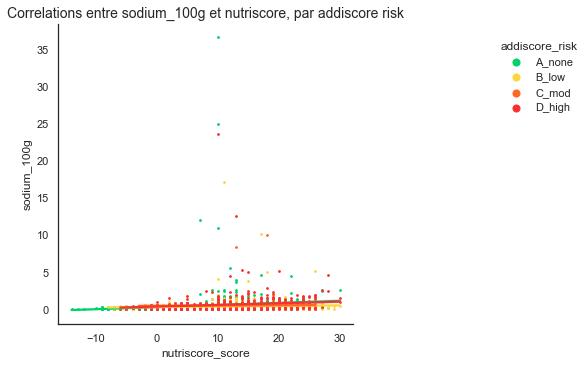

In [257]:
for col in colonnes_100g:
    (cleaned_data[['nutriscore_score', col, 'addiscore_risk']]
     .dropna()
     .pipe(plot_reg, y_var=col, hue='addiscore_risk')
     )
    plt.title(f'Correlations entre {col} et nutriscore, par addiscore risk', size=14)
    to_png()
    plt.show()

In [258]:
def plot_correlations_nutriscore(df:pd.DataFrame):
    for col in colonnes_100g:
        (df
         .pipe(filter_by_nova_group, 4)[['nutriscore_score', col, 'addiscore_risk']]
         .dropna()
         .pipe(plot_reg, y_var=col, hue='addiscore_risk')
         )
        plt.title(f'Correlations (NOVA 4) entre {col} et nutriscore, par addiscore risk', size=14)
        to_png()
        plt.show()

# cleaned_data.pipe(plot_correlations_nutriscore)

In [259]:
def plot_pnns_group_nutr(df:pd.DataFrame):
    categs = groupes_a_risque_eleves
    for categ in categs:
        data = (df
                .pipe(get_produits_by_pnns_group_2, pnns_2_group=categ)
                .pipe(filter_by_nova_group, 4)
                )
        for col in colonnes_100g:
            (data
             .pipe(filter_by_nova_group, 4)[['nutriscore_score', col, 'addiscore_risk']]
             .dropna()
             .pipe(plot_reg, y_var=col, hue='addiscore_risk')
             )
            ax = plt.gca()
            ymin, ymax = ax.get_ylim()
            ax.set_ylim((0, ymax))
            plt.suptitle(f'Correlations (pnns2 = {categ}) entre {col} et nutriscore', size=14, y=1.05)
            plt.title(f'(groupe NOVA 4) by addiscore_risk', size=12)
            plt.tight_layout()
            to_png()
            plt.show()

# cleaned_data.pipe(plot_pnns_group_nutr)

"regression_saturated-fat_100g_vs_addiscore_hue_addiscore_risk_lmplot.png"
"regression_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot.png"


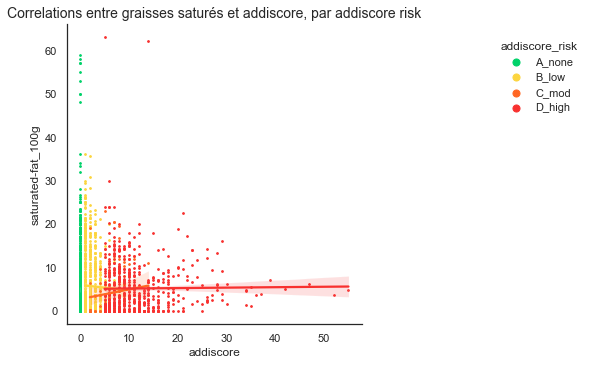

In [260]:
(cleaned_data[['addiscore', 'saturated-fat_100g', 'addiscore_risk']].dropna()
 .pipe(plot_reg, x_var='addiscore', y_var='saturated-fat_100g', hue='addiscore_risk'))
plt.title('Correlations entre graisses saturés et addiscore, par addiscore risk', size=14)
to_png(f'regression_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot')


"scatter_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot.png"


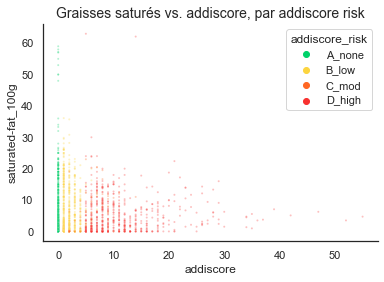

In [261]:
ax = sns.scatterplot(data=cleaned_data.sort_values(by='addiscore_risk', ascending=True), x='addiscore',
                     y='saturated-fat_100g', hue='addiscore_risk',
                     palette=addiscore_palette, s=4, alpha=0.3)
sns.despine()
plt.title('Graisses saturés vs. addiscore, par addiscore risk', size=14)
to_png(f'scatter_sat_fat_vs_addiscore_hue_addiscore_risk_lmplot')


### 2.2.6 Heatmap : nb produits par catégorie et additif nocif


## Crosstab heatmap (2 vars catégoriques)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


"crosstab_heatmap_pnns_groups_1_grouped_by_pnns_groups_2.png"


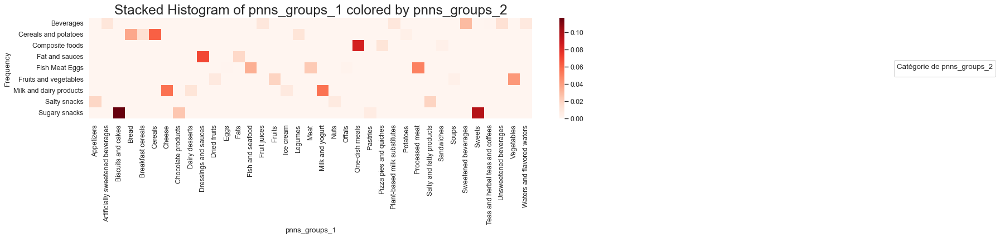

In [262]:
def plot_crosstab_heatmap(df:pd.DataFrame, x_var, groupby_var):
    ct = pd.crosstab(index=df[x_var], columns=df[groupby_var], normalize='all')

    # prepare to plot
    groups = ct.columns.tolist()
    # colors = [plt.cm.Spectral(i / float(len(groups) - 1))
    #         for i in range(len(groups))]
    _, ax = plt.subplots(figsize=(16, 3), dpi=80)

    # Draw
    sns.heatmap(ct, ax=ax, cmap='Reds')
    # ct.plot(kind='bar', stacked=True, color=colors, ax=ax)
    # sns.barplot(data=ct,x=ct.index,y=ct.columns, stacked=True, color=colors, ax=ax,orient='v')
    # plt.hist(kind='bar',data =ct, values=ct.columns,stacked=True, colors=colors, ax=ax)
    # Decoration
    plt.legend(title=f'Catégorie de {groupby_var}',
               # labels={group: col for group, col in zip(groups, colors)},
               bbox_to_anchor=(1.4, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.title(
        f"Stacked Histogram of {x_var} colored by {groupby_var}", fontsize=22)
    plt.xlabel(x_var)
    plt.ylabel("Frequency")
    # plt.ylim(0, 40)
    to_png(f'crosstab_heatmap_{x_var}_grouped_by_{groupby_var}')


plot_crosstab_heatmap(cleaned_data, 'pnns_groups_1', 'pnns_groups_2')


## Stacked bar chart (2 vars catégoriques)


In [263]:
def plot_stacked_histogram(df:pd.DataFrame, x_var, groupby_var, normalize=False, sortbygroup=None):
    if normalize:
        ct = pd.crosstab(
            index=df[x_var], columns=df[groupby_var], normalize='index') * 100
    else:
        ct = pd.crosstab(index=df[x_var], columns=df[groupby_var])

    # prepare to plot
    groups = ct.columns.tolist()
    palette = get_palette_df(df,groupby_var)
    colors = palette.values() if palette else None

    _, ax = plt.subplots(figsize=(16, 9), dpi=80)

    if sortbygroup:
        ct = ct.sort_values(by=sortbygroup, ascending=False)

    # Draw
    ct.plot(kind='bar', stacked=True, color=colors, ax=ax)

    # Decoration
    plt.legend(title=f'Catégorie de {groupby_var}',
               labels={group: col for group, col in zip(groups, colors)},
               bbox_to_anchor=(1.4, 0.5), loc="center right", fontsize=12,
               bbox_transform=plt.gcf().transFigure)
    plt.title(
        f"Stacked Histogram of {x_var} colored by {groupby_var}", fontsize=22)
    plt.xlabel(x_var)
    plt.ylabel("Frequency")
    to_png(f'stacked_histogram_{x_var}_grouped_by_{groupby_var}')



### Distribution d'addiscore risk pour chaque PNNS_groups_2 (Stacked histogram)

"stacked_histogram_pnns_groups_2_grouped_by_addiscore_risk.png"


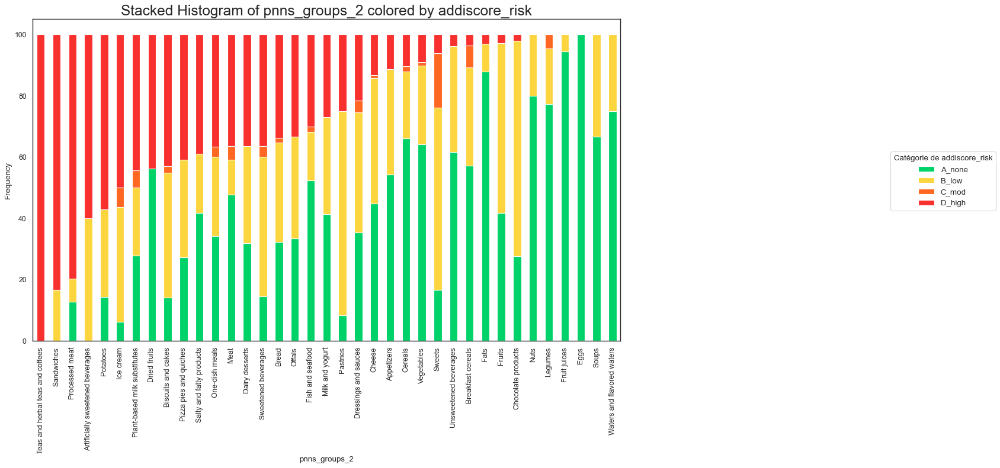

In [264]:
# cleaned_data['pnns_groups_2'],cleaned_data['addiscore_risk'],
plot_stacked_histogram(cleaned_data, 'pnns_groups_2',
                       'addiscore_risk', normalize=True, sortbygroup='D_high')


## Colonnes très corrélées entre eux

| colonne1             | colonne2             | test de corrélation (dependence) |
|----------------------|----------------------|----------------------------------|
| numérique            | numérique            | pearson correlation              |
| catégorique(ordinal) | numérique            | spearman's rank correlation      |
| catégorique(nominal) | catégorique(nominal) | chi-square                       |

- Chi-Square Goodness of Fit Test — test if one variable is likely to come from a given distribution.

https://towardsdatascience.com/statistics-in-python-using-chi-square-for-feature-selection-d44f467ca745

- Chi-Square Test of Independence — test if two variables might be correlated or not.
  - H0 : les 2 variables sont indépendants
  - H1 : les 2 variables sont dépendants un sur l'autre


## 6.7 Correlations entre addiscore et autres colonnes
- servings_100g,nova_group,nutriscore,additifs_n, ingredients_n

Est-ce que l'addiscore est correlé avec d'autres variables


"Correlations_entre_les_variables_numériques.png"


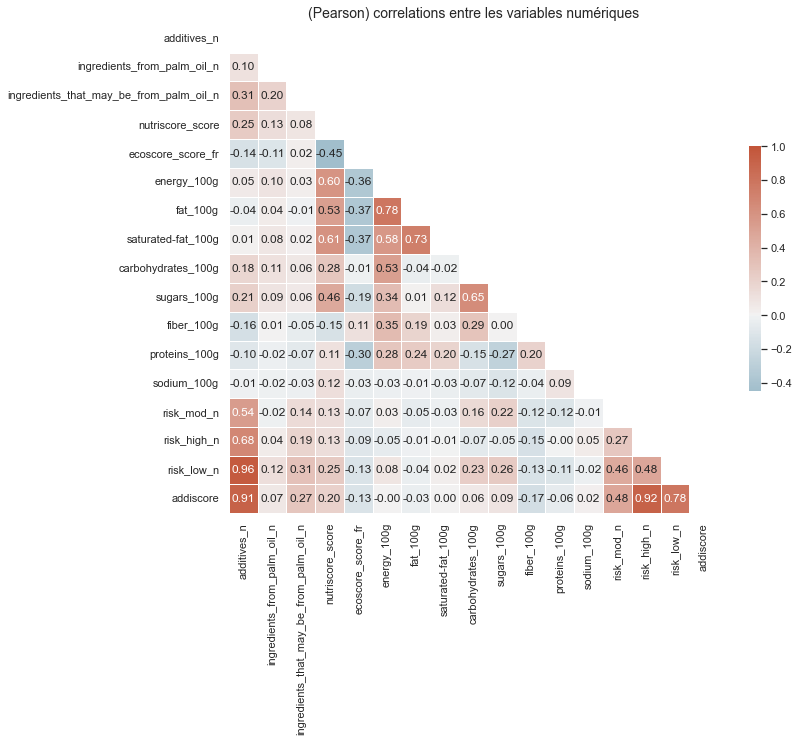

In [265]:
def plot_heatmap(df:pd.DataFrame):
    corr_tab = cleaned_data.select_dtypes('number').corr()
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_tab, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr_tab, annot=True, fmt='.2f', mask=mask, cmap=cmap, vmax=1, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(plot_heatmap)
 )
plt.title('(Pearson) correlations entre les variables numériques', size=14)
to_png('Correlations_entre_les variables_numériques')


"scatter_saturated_fat_nutriscore_hue_addiscore.png"


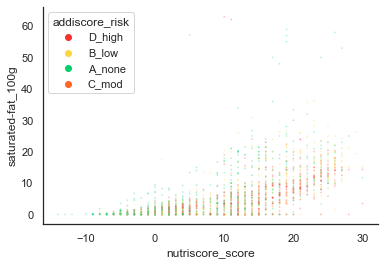

In [266]:
sns.scatterplot(data=cleaned_data, x='nutriscore_score', y='saturated-fat_100g',
                hue='addiscore_risk', palette=addiscore_palette, s=3, alpha=0.3)
sns.despine()
to_png('scatter_saturated_fat_nutriscore_hue_addiscore')

# 7. Analyse en Composants Principales (ACP)

- <https://www.datasklr.com/principal-component-analysis-and-factor-analysis/principal-component-analysis>
- <https://jmausolf.github.io/code/pca_in_python/>
- <https://cmdlinetips.com/2018/03/pca-example-in-python-with-scikit-learn/>

### 7.1.1 ACP : Objectifs d'Analyse Exploratoire

- Analyse de Composants Principales :
  - réduire les dimensions en trouvant des variables qui explique le plus de variance entre observations

Sur les colonnes :

- servings_100g,nova_group,nutriscore,ecoscore,additifs_n, ingredients_n


In [267]:
names = cleaned_data["product_name"]  # ou data.index pour avoir les intitulés


### PCA étape 1 - selection des colonnes à prendre en compte dans l'ACP

#### Sélectionner les variables quantitatives nutritionnelles


In [268]:
def datetime_to_float(df:pd.DataFrame):
    date_cols = list(df.select_dtypes('datetime'))
    for col in date_cols:
        df[col] = df[col].astype('datetime64').view(
            np.int64).astype(np.float64)
    return df


def pca_select_vars(df:pd.DataFrame, exclude_cols=[]):
    cols_to_include = list(df.select_dtypes(include=['number']).columns)
    cols_to_drop = list(set(cols_to_include) & set(exclude_cols))
    # cols= list(set(cols_to_include) - set(cols_to_drop))
    return df[cols_to_include].drop(cols_to_drop, axis=1)


pca_exclude_cols = list(set(cleaned_data.columns) - set(colonnes_100g))
print(f'exclude cols : {pca_exclude_cols}')

pca_data = cleaned_data.pipe(pca_select_vars, exclude_cols=pca_exclude_cols)
pca_data.info()


exclude cols : ['pnns_groups_1', 'risk_high_n', 'labels_en', 'ingredients_from_palm_oil_tags', 'nutriscore_grade', 'ecoscore_score_fr', 'categories_en', 'pnns_groups_2', 'states_en', 'energy_100g', 'code', 'risk_low_n', 'created_datetime', 'addiscore_risk', 'ingredients_that_may_be_from_palm_oil_tags', 'product_name', 'ecoscore_grade_fr', 'additives_tags', 'ingredients_that_may_be_from_palm_oil_n', 'brands_tags', 'ingredients_from_palm_oil_n', 'risk_mod_n', 'creator', 'main_category_en', 'addiscore', 'ingredients_text', 'last_modified_datetime', 'nutriscore_score', 'nova_group', 'countries_en', 'additives_n', 'additives_en']
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2320 entries, 5 to 9508
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fat_100g            2314 non-null   float64
 1   saturated-fat_100g  2314 non-null   float64
 2   carbohydrates_100g  2314 non-null   float64
 3   sugars_100g

### PCA étape 2 - Préparation des données sélectionnées pour l'ACP

#### 2a : éliminer les outliers :

- pour réduire le risque de trop d'influence des outliers
- éliminer ou abs(Z-score) > 3 (pas bon pour des colonnes avec beaucoup de skew)
- éliminer les top 1% et bottom 1%


In [269]:
def drop_high_outliers(df:pd.DataFrame, subset=None, exclude=None, alpha=0.01):
    """Éliminer 1% des valeurs les plus grandes"""
    filtre = False
    if subset is None:
        subset = list(df.select_dtypes('number'))
    if not exclude is None:
        subset = list(set(subset) - set(exclude))
    for column in subset:
        # min_val = df[column].quantile(alpha)
        max_val = df[column].quantile(1 - alpha)
        # filtre &= df[column]>min_val
        filtre |= df[column] > max_val

    nb = df[filtre].shape[0]
    print(f'drop_high_outliers, nb={nb}')  # ', (subset={subset})')
    return df[~filtre]


def drop_low_outliers(df:pd.DataFrame, subset=None, exclude=None, alpha=0.01):
    """Éliminer 1% des valeurs les plus petites"""
    filtre = False
    if subset is None:
        subset = list(df.select_dtypes('number'))
    if not exclude is None:
        subset = list(set(subset) - set(exclude))
    for column in subset:
        min_val = df[column].quantile(alpha)
        # max_val = df[column].quantile(1-alpha)
        filtre |= df[column] < min_val
        # filtre &= df[column]<max_val

    nb = df[filtre].shape[0]
    print(f'drop_low_outliers, nb={nb}')  # , (subset={subset})')
    return df[~filtre]


print(pca_data.shape)
pca_data = (pca_data
            .pipe(drop_high_outliers)
            .pipe(drop_low_outliers))
print(pca_data.shape)


(2320, 7)
drop_high_outliers, nb=135
drop_low_outliers, nb=0
(2185, 7)


#### 2b : éliminer les NaN :

- dropna() # pour ne réduire pas la variance d'un variable
- fillna(data_pca.mean()) # Il est fréquent de remplacer les valeurs inconnues par la moyenne de la variable
- drop(columns={colonnes moins importantes qui contient des NaN})

In [270]:
def drop_colonnes_vides(df:pd.DataFrame, threshold=0):
    count = df.isna().mean()
    colonnes_vides = count[(1 - count) <= threshold].index.to_list()
    print(f'drop_colonnes_vides, threshold = {threshold}')
    return df.drop(colonnes_vides, axis=1)


pca_data = (pca_data.pipe(drop_colonnes_vides, threshold=0.25).dropna())
print(pca_data.shape)



drop_colonnes_vides, threshold = 0.25
(1621, 7)


In [271]:
features = list(pca_data.columns)
print(features)


['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g']


### PCA étape 3 - standardise (centrage et réduction d'échelle)

Variables sur des échelles différentes sont standardisé pour contribuer également à l'analyse


In [272]:
from sklearn.preprocessing import StandardScaler

def pca_standardise(df:pd.DataFrame):
    """Standardize the data"""
    scaler = StandardScaler()
    # return scaler.fit(df).transform(df) # numpy array
    # attention de ne perd pas l'index aux produits
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns, index=df.index)

X_scaled_df = pca_data.pipe(pca_standardise)
X_scaled_df.head()


,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
5,-0.37,-0.22,-0.54,-0.71,-0.48,-0.18,3.18e-03
6,-0.59,-0.67,-0.70,-0.65,-0.03,-0.79,2.04e-01
17,-0.93,-0.78,-0.08,0.74,-0.87,-0.04,-6.77e-01
28,-0.93,-0.78,-0.88,-0.41,-0.14,-1.04,-9.01e-01
48,0.89,2.37,-1.10,-0.69,-0.87,0.76,1.32e+00


Même chose manuellement

In [273]:
def z_score(df:pd.DataFrame):
    """
        Appliquer le z-score en utilisant .mean() et .std()
        même résultat qu'utilisant StandardScaler.
        StandardScaler est optimisé pour des grandes matrices
    """
    df_std = df.copy()
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()
                          ) / df_std[column].std(ddof=0)
    return df_std



Créer un target dataframe (vide pour le moment) avec un 'index' des produits, pour faire des joins sur les données

In [274]:

target_df = pd.DataFrame(pca_data.index, columns={'id'}, index=pca_data.index)
target_df.head()


,id
5,5
6,6
17,17
28,28
48,48


In [275]:
from sklearn.decomposition import PCA

# choix du nombre de composantes à calculer
n_comp = len(pca_data.columns)

# Create the PCA model
dpca = PCA(n_components=n_comp)

# Fit the model with the standardised data
dpca.fit(X_scaled_df)

pc= dpca.transform(X_scaled_df)
# pc = dpca.fit_transform(X_scaled_df)
nom_cols = [f'PC{i}' for i in range(1, n_comp + 1)]
print(nom_cols)
print(dpca.explained_variance_ratio_.cumsum())
pc_df = pd.DataFrame(data=pc, columns=nom_cols, index=X_scaled_df.index)
pc_df.head()


['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7']
[0.30454407 0.56646287 0.73139316 0.85122121 0.92903531 0.96846679
 1.        ]


,PC1,PC2,PC3,PC4,PC5,PC6,PC7
5,-0.77,7.24e-01,-0.25,-8.52e-02,0.05,0.23,-0.08
6,-1.25,5.66e-01,0.16,2.94e-03,0.68,-0.03,-0.10
17,-1.28,-6.18e-01,-0.39,2.45e-03,-0.89,-0.46,0.23
28,-1.84,-7.12e-03,-0.17,-8.17e-01,0.47,-0.09,-0.17
48,1.78,1.93e+00,-1.73,6.10e-01,0.18,0.18,-0.91


### Scree plot

- A visual approach to selecting the number of principal components
- number of components on the X-axis against the proportion of the variance explained on the Y-axis.
- The suggested number of components to keep is where the plot forms an elbow and the curve flattens out.
- The Kaiser rule : the number of principal components to keep equals the number of eigenvalues greater than 1.
- Or a minimal threshold of cumulative explained variation in the data (as % of total variation). 

"pca_var_explained_scree_plot.png"


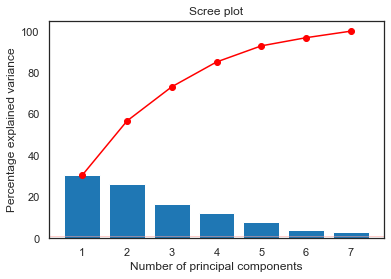

In [276]:
from matplotlib.ticker import MaxNLocator


def display_scree_plot(pca):
    """Display a scree plot for the pca"""
    scree = pca.explained_variance_ratio_ * 100
    plt.bar(np.arange(len(scree)) + 1, scree)
    plt.plot(np.arange(len(scree)) + 1, scree.cumsum(), c="red", marker='o')
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    # plt.ylabel('Eigenvalue')
    plt.axhline(y=1, linewidth=1, color='r', alpha=0.5)
    plt.title('Scree Plot of PCA: Component Eigenvalues')

    plt.xlabel("Number of principal components")
    plt.ylabel("Percentage explained variance")
    plt.title("Scree plot")

display_scree_plot(dpca)
to_png(f'pca_var_explained_scree_plot')


### PCA Cercle des corrélations


In [277]:
from matplotlib.collections import LineCollection


def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks:  # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7, 6))

            # détermination des limites du graphique
            if lims is not None:
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30:
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else:
                xmin, xmax, ymin, ymax = min(pcs[d1, :]), max(
                    pcs[d1, :]), min(pcs[d2, :]), max(pcs[d2, :])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30:
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1, :], pcs[d2, :],
                           angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0, 0], [x, y]] for x, y in pcs[[d1, d2]].T]
                ax.add_collection(LineCollection(
                    lines, axes=ax, alpha=.1, color='black'))

            # affichage des noms des variables
            if labels is not None:
                for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                    if xmin <= x <= xmax and ymin <= y <= ymax:
                        plt.text(x, y, labels[i], fontsize='14', ha='center',
                                 va='center', rotation=label_rotation, color="blue", alpha=0.5)

            # affichage du cercle
            circle = plt.Circle((0, 0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel(
                f'PC{d1 + 1} ({round(100 * pca.explained_variance_ratio_[d1], 1)}%)')
            plt.ylabel(
                f'PC{d2 + 1} ({round(100 * pca.explained_variance_ratio_[d2], 1)}%)')

            plt.title(f'Cercle des corrélations (PC{(d1 + 1)} et PC{(d2 + 1)})')
            to_png(f'pca_display_circles_(PC{(d1 + 1)}_et_PC{(d2 + 1)})')
            plt.show(block=False)


"pca_display_circles_(PC1_et_PC2).png"


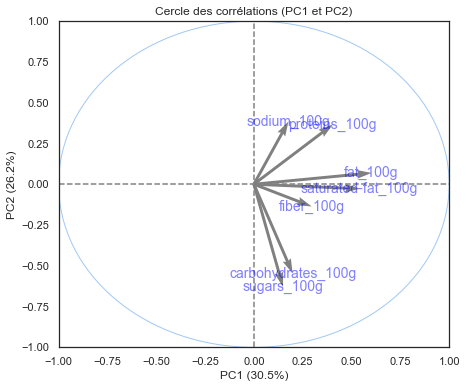

"pca_display_circles_(PC3_et_PC4).png"


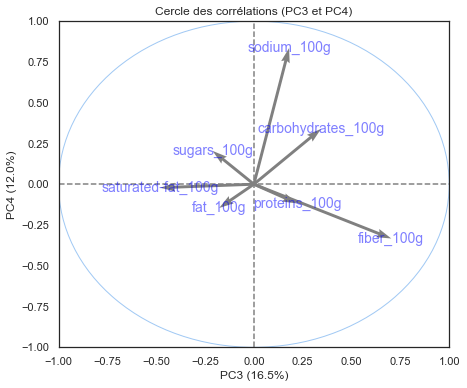

"pca_display_circles_(PC5_et_PC6).png"


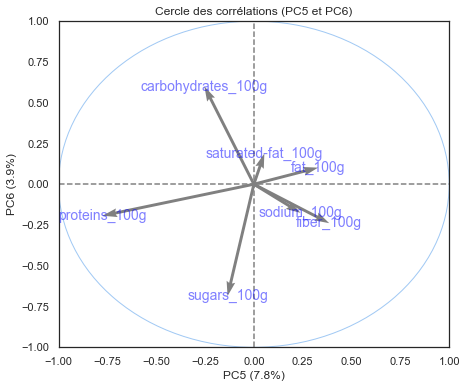

In [278]:


display_circles(pcs=dpca.components_, n_comp=n_comp, pca=dpca, axis_ranks=[
    (0, 1), (2, 3), (4, 5)], labels=np.array(features))


## Visualiser les données sur les nouvelle 'composantes principales'
### Filtrer les donneés pour excluir les outliers

In [279]:
for_visual = target_df[['id']].join(pc_df, how='inner')
for_visual.head()
pc_df = pc_df.rename_axis('id')


ajouter les colonnes des données nettoyés

In [280]:
for_visual = pc_df.join(cleaned_data, how='inner')
for_visual[for_visual['PC2'] > 10].index


Int64Index([], dtype='int64')

In [281]:
def explode_by_series(df:pd.DataFrame, col, exclude_groups=None):
    # si la colonne est numérique, pas besoin de traitement
    if df[col].dtype.kind in 'biufc':
        df = df.dropna(subset=[col]).copy()
        df[col] = df[col].astype(str)
        return df
    ret = df.dropna().copy()

    ret[col] = ret[col].str.split(',')
    ret = ret.explode(col)
    return ret


# feature='additives_tags'
# feature = 'nutriscore_grade'
feature = 'risk_high_n'
explode_by_series(for_visual[['PC1', 'PC2', feature]], feature).tail()


,PC1,PC2,risk_high_n
9499,-1.72,0.08,0.0
9503,1.34,-3.36,0.0
9504,-1.09,-3.55,0.0
9506,1.73,-1.96,0.0
9508,-1.78,0.68,2.0


In [282]:
def plot_components(data, axis1='PC1', axis2='PC2', feature='nutriscore_grade',
                    exclude_groups=None, size=1, legend_out=False):
    """Version simplifiée de display_factorial_planes """
    df = explode_by_series(
        data[[axis1, axis2, feature]], feature, exclude_groups)
    # return df.shape
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(1, 1, 1)

    d1 = int(axis1[2:]) - 1
    d2 = int(axis2[2:]) - 1
    # Label the axes, with the percentage of variance explained
    ax.set_xlabel(f'{axis1} ({100 * pca.explained_variance_ratio_[d1]:.1f}%)', fontsize=15)
    ax.set_ylabel(f'{axis2} ({100 * pca.explained_variance_ratio_[d2]:.1f}%)', fontsize=15)

    ax.set_title(
        f'Composantes principales ({axis1}, {axis2}) vs. {feature}', fontsize=20)

    palette = get_palette_df(df, feature, exclude_values=exclude_groups)
    groups = palette.keys()
    colors = palette.values()
    for group, color in zip(groups, colors):
        if group != 'unknown':
            indices_to_keep = df[feature] == group
            ax.scatter(df.loc[indices_to_keep, axis1],
                       df.loc[indices_to_keep, axis2],
                       c=color, alpha=0.5, s=size)
    if legend_out:
        ax.legend(groups,bbox_to_anchor=(1.2,0.5),loc="center right", fontsize=12,
        bbox_transform=plt.gcf().transFigure,markerscale=6)
    else:
        ax.legend(groups, markerscale=6)
    ax.grid()
    plt.subplots_adjust()
    to_png(f'pca_plot_components_{feature}_({axis1}_et_{axis2})')
    plt.show()


### PCA nutrigrade

NameError: name 'pca' is not defined

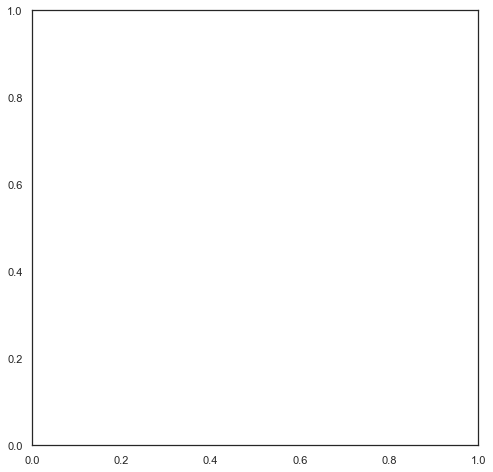

In [283]:
plot_components(for_visual, axis1='PC1', axis2='PC2',feature='nutriscore_grade')
plot_components(for_visual, axis1='PC3', axis2='PC4',feature='nutriscore_grade')

### PCA groupes NOVA

In [ ]:
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='nova_group')
plot_components(for_visual, axis1='PC3', axis2='PC4', feature='nova_group')

### PCA groupes PNNS 1

In [ ]:
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='pnns_groups_1',
                exclude_groups=['unknown', 'Alcoholic beverages'])
plot_components(for_visual, axis1='PC3', axis2='PC4', feature='pnns_groups_1',
                exclude_groups=['unknown', 'Alcoholic beverages'])

### PCA addiscore et addiscore risk
Aucun des composantes principales basées sur les colonnes nutritionnelles et capable de discriminer 
- le nombre d'additifs
- le risque des additifs

In [ ]:
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='addiscore_risk')
plot_components(for_visual, axis1='PC1', axis2='PC2', feature='risk_high_n',
                exclude_groups=['0', '0.0'])
 

### PCA additives à risque élevés or modérés

In [ ]:
plot_components(for_visual, axis1='PC1', axis2='PC2',
                feature='additives_en', exclude_groups=safe_additives_df['name'])
plot_components(for_visual, axis1='PC1', axis2='PC2',
                feature='additives_tags', exclude_groups=safe_additives_df['id'])

### PCA groupes PNNS 2 (seulement les groupes à risques élévés)

In [ ]:
(for_visual
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_components, axis1='PC1', axis2='PC2', feature='addiscore_risk', size=3)
 )
(for_visual
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_categorie_in, categ_col='pnns_groups_2', categs=groupes_a_risque_eleves)
 .pipe(plot_components, axis1='PC3', axis2='PC4', feature='addiscore_risk', size=3)
 )

# 8. Système de Recommendation

- trouver la produit (ou plusieurs avec la même nom)
- identifier le 'main_category_en' du produit
- select autres produits dans ce categorie
- si autres produits
    - trier par addiscore
    - offre le meilleur nutrigrade dans les top addiscore

In [ ]:
def flatten(lists: list, exclude='in,is,,with'.split(',')) -> list:
    flat_list = []
    for sublist in lists:
        for item in sublist:
            if not (item in exclude):
                flat_list.append(item)
    return flat_list


def search_words(search_str: str) -> list:
    words = search_str.split(' ')
    words = [w.split(',') for w in words]
    words = flatten(words)
    return words


def trouver_produit(df:pd.DataFrame, nom='chicken sandwich, with bacon'):
    words = search_words(nom)
    filtre = True
    for word in words:
        filtre &= df['product_name'].str.contains(word, case=False)
    return df[filtre]

    # .dropna(subset=['main_category_en'])


def filtre_top_n(df:pd.DataFrame, col='pnns_groups_2', nb=1):
    groups = df[col].value_counts()
    nb = max(nb, 1)
    nb = min(nb, len(groups))
    top_groups = groups.index.to_list()[:nb]
    print(f'top_group: {top_groups}')
    if not (isinstance(top_groups, list)): top_groups = [top_groups]
    return df[df[col].isin(top_groups)]


def affiche_meilleur_pire_produits(product_name):
    products = (cleaned_data
                .pipe(filter_by_country, 'France')
                .pipe(trouver_produit, product_name)
                .dropna(subset=['nutriscore_score', 'addiscore'])
                .pipe(filtre_top_n, 'pnns_groups_2', 1)
                )

    print(f'{len(products)} produits')
    # cols=['product_name', 'brands_tags', 'categories_en', 'labels_en', 'ingredients_text', 'additives_n', 'additives_tags', 'additives_en', 'ingredients_from_palm_oil_n', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_tags', 'nutriscore_score', 'nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'states_en', 'main_category_en', 'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g', 'fruits-vegetables-nuts-estimate-from-ingredients_100g', 'risk_mod_n', 'risk_high_n', 'risk_low_n', 'addiscore', 'addiscore_risk']

    df = pd.DataFrame([], columns=products.columns)
    s1 = products.sort_values(by='addiscore', ascending=True).head(1)
    s2 = products.sort_values(by='addiscore', ascending=False).head(1)
    s3 = products.sort_values(by='nutriscore_score', ascending=True).head(1)
    s4 = products.sort_values(by='nutriscore_score', ascending=False).head(1)
    df = s1.append(s2).append(s3).append(s4)
    df['categ'] = ['meilleur addiscore', 'pire addiscore', 'meilleur nutriscore', 'pire nutriscore']
    return df


cols1 = ['product_name', 'brands_tags', 'nutriscore_score', 'nutriscore_grade', 'addiscore', 'addiscore_risk',
         'nova_group', 'pnns_groups_1', 'pnns_groups_2', 'main_category_en', 'additives_n', 'risk_mod_n', 'risk_high_n',
         'risk_low_n']
affiche_meilleur_pire_produits('sandwich')[cols1]

# TODO
# products.pipe(crosstab_normalize,'nova_group','nutriscore_grade', normalize=False)
# products.pipe(plot_barh_stacked)

In [ ]:
affiche_meilleur_pire_produits('glace')[cols1]

---

#9. Clustering des additifs
- correlations entre des additifs 
- voir la répartition de chaque additif (group) entre les groupes de produits plus à risque
- voir si on peut recommander au producteurs de remplacer avec des additifs similaires mais moins risqué

## 9.1 Groupement des additifs

Objectif: Essaie de grouper les additifs par leur fonctionalité - présence dans certains groupes 
- voir les correlations / covariances des additifs

### 9.1.1 Méthode 1: Crosstabulation des additive tags (pd.dummies)

- trop gourmand en memoire
- mieux faire un stack ?


In [ ]:

def crosstab_additives_tags(df:pd.DataFrame):
    # return pd.crosstab(df.index,df['additives_tags'])
    return pd.get_dummies(df['additives_tags']).groupby(level=0).sum()


(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(print_df_shape)
 .pipe(filter_by_additives_tags, min_count=1000)
 .pipe(print_df_shape)
 .pipe(crosstab_additives_tags)
 ).head()




## 9.2 Correlation entre les additifs de risque modéré et haut

### 9.1.3 Dendrograms des additifs

In [ ]:
import scipy.cluster.hierarchy as shc

def plot_dendrogram(df:pd.DataFrame, method='ward', figsize=(10, 25), fontsize=16, mod_risk_tags=[], high_risk_tags=[]):
    """Plot a dendrogram to illustrate hierarchical clustering
    df should be scaled for correct linkage
    """
    if df.shape[0] > df.shape[1]:
        df = df.T
    plt.figure(figsize=figsize)
    dend = shc.dendrogram(shc.linkage(df, metric='euclidean', optimal_ordering=True, method=method),
                          labels=df.index,
                          orientation="left")
    ax = plt.gca()
    w = ax.get_yticklabels()
    # mod_risk=get_additive_labels(mod_risk_tags)
    for item in list(w):
        item_tag = item.get_text()
        if item_tag in mod_risk_tags:
            item.set_color("#ff6723")  # orange
        elif item_tag in high_risk_tags:
            item.set_color("#f8312f")  # red
    labels = get_additive_labels([item.get_text()
                                  for item in ax.get_yticklabels()])

    ax.set_yticklabels(labels=labels, fontsize=fontsize)

    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('distance')


# plot_dendrogram(ct.T)
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_additives_tags, additives_tags_list=unsafe_additives_df['id'], min_count=1000)
 .pipe(print_df_head)
 .pipe(crosstab_additives_tags)
 .pipe(plot_dendrogram, figsize=(8, 10), mod_risk_tags=[], fontsize=10)
 )


In [ ]:
(cleaned_data
 .pipe(filter_by_country, 'France')
 .pipe(filter_by_additives_tags, additives_tags_list=unsafe_additives_df['id'].to_list(), min_count=20)
 .pipe(crosstab_additives_tags)
 .pipe(plot_dendrogram,
       figsize=(10, 10),
       method='complete',
       mod_risk_tags=mod_risk_additives['id'].to_list(),
       high_risk_tags=high_risk_additives['id'].to_list(),
       fontsize=10)
 )


# 10. Conclusion : Comment éviter les additifs à risque dans les plats prêts à consommer
- ➡️ Eviter les produits préparés de PNNS groupes 2 à risque élevés:
    - sandwiches, pizzas, boissons artificiellement sucrées, desserts lactées, viandes transformés
- ➡️ Création d'un addiscore_risk, basé sur le présence d'additifs de haut risque
- ➡️ Création d'un addiscore, basé sur le nombre d'additifs de haut risque
- ➡️ Création d'un système de recommendation


# 11. Wordclouds 

- note: la bibliothèque de wordclouds n'est pas mantenu - il faut python 3.7 pour que ça marche
- j'ai copié le source du bibliothèque (dossier (wordcloud) et désactivé la cython qui bogue sur python 3.9
- c'est plus lent (20 s à 1 minute), mais ça marche 

## 11.1 Wordclouds - types de produit (main_category_en) contenant des additifs nocifs


In [ ]:

sans_interet = 'of,and,it,(%),in,to,with,by,for,who,are,the,-'.split(',')


def top_words(df:pd.DataFrame, col, nb=20):
    words = []
    for lab in df[col]:
        words += lab.split(" ")
    counter = Counter(words)
    return counter.most_common(nb)


def top_tags(df:pd.DataFrame, col, nb=20):
    count = df[col].str.split(',').explode().value_counts().head(nb)
    return count.to_frame(name='count').rename_axis('word').reset_axis()


def common_word_count(df:pd.DataFrame, col, nb=20):
    c = top_words(df, col, nb=nb)
    ret = pd.DataFrame.from_records(c, columns=['word', 'count'])
    filtre = ret['word'].isin(sans_interet)
    ret = ret[~filtre]
    return ret


In [ ]:
from collections import Counter


def count_word_freq(df:pd.DataFrame, col='', sep=',', nb=30):
    """count frequency of words or tags in a column, 
       return a dictionary, with size based on tag
       If sep=',' fastest is to explode column and count values
       If sep=' ', use counter + STOPWORDS to get word count
    """
    if sep == ',':
        count = df[col].str.split(',').explode().value_counts()
        return dict(zip(count.index, count.values))


In [ ]:
def plot_wordcloud(df:pd.DataFrame,width=960, height=1080, colormap='PuBuGn'):    
    """
       creer a wordcloud, with size based on tag
       dimensions 960 x 1080 == half screen
    """
    if ENV !='colab': 
        print('latest wordcloud library requires python < 3.8')
        return

    # Google colab (python 3.7) est compatible avec wordcloud qui est pré-installé
    # On profite pour créer des visuels pour le support 
    from wordcloud import WordCloud

    wordcount=dict(zip(df['name'], df['freq']))

    wordcloud = WordCloud(width=width, height=height,
                           prefer_horizontal=1,  # pas de mots verticals
                           colormap=colormap,
                           background_color='black',
                           mode='RGBA').fit_words(wordcount)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.margins(x=0, y=0)



### Wordcloud - additifs à risque élevé
addiscore_risk == D_high

In [ ]:
(cleaned_data
 .dropna(subset=['additives_tags'])
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=high_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags')
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=540, colormap='Reds')
 )
to_png(f'E1.5_wordcloud_high_risk_additives')

### Wordcloud - additifs à risque modéré
addiscore_risk == C_mod

In [ ]:
(cleaned_data[['additives_tags','countries_en']].dropna()
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=mod_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags')
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=240, colormap='Oranges')
 )
to_png(f'E1.5_wordcloud_mod_risk_additives')

### Wordcloud - additifs à risque bas
addiscore_risk == B_low

In [ ]:
(cleaned_data[['additives_tags','countries_en']].dropna()
 .pipe(filter_by_country, 'France')
 .pipe(explode_frame,'additives_tags')
 .pipe(filter_by_unsafe_additives, unsafe=low_risk_additives['id'].tolist())
 .pipe(top_n_freq,'additives_tags', nb=30)
 .merge(additives_detail[['id','name']], left_on='additives_tags', right_on='id', how='inner')
 [['name','freq']]
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=500, colormap='Greens', titre='low_risk_additives')
)
to_png(f'E1.5_wordcloud_low_risk_additives')

#### Wordcloud - ingredients dans processed meat

In [ ]:
def filter_exclude(df:pd.DataFrame, exclude_words=[]):
    data= df.copy()
    data['name']=data['name'].str.strip()
    return data[~data['name'].isin(exclude_words)]

(cleaned_data
 .pipe(filter_by_nova_group, 4)
 .pipe(filter_by_tag, 'pnns_groups_2', 'Processed meat')
 .pipe(top_n_freq, 'ingredients_text',nb=30)
 .rename(columns={'ingredients_text':'name'})
 .pipe(filter_exclude, exclude_words='eau,water,salt,sel,sugar,sucre,Dextrose,dextrose,other'.split(','))
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=500, colormap='flare')
)
to_png(f'E1.5_wordcloud_processed_meat_ingredients')

#### Wordcloud - Nova group 4 main categories

In [ ]:
(cleaned_data
 .pipe(filter_by_nova_group, 4)
 .pipe(top_n_freq,'main_category_en', nb=14, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
  .pipe(plot_wordcloud, height=400, colormap='Spectral')
)
to_png(f'E1.5_wordcloud_nova_4_main categories')

#### Wordcloud - (main categories) de produits qui contient sodium nitrite

In [ ]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e250')
 .pipe(top_n_freq,'main_category_en', nb=20, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=400, colormap='Greens')
)
to_png(f'E1.5_wordcloud_sodium_nitrite_main categories')

In [ ]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e202')
 .pipe(top_n_freq,'main_category_en', nb=20, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=400, colormap='Reds')
)
to_png(f'E1.5_wordcloud_potassium_sorbate_main categories')

In [ ]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e450')
 .pipe(top_n_freq,'main_category_en', nb=9, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=310,colormap='YlOrBr')
)
to_png(f'E1.5_wordcloud_diphosphates_main categories')

In [ ]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e407')
 .pipe(top_n_freq,'main_category_en', nb=9, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=260, colormap='pink')
)
to_png(f'E1.5_wordcloud_carrageenan_main categories')

In [ ]:
(cleaned_data
 .pipe(filter_by_tag, 'additives_tags', 'en:e133')
 .pipe(top_n_freq,'main_category_en', nb=8, others=False)
 .rename(columns={'main_category_en':'name'})
 .pipe(print_df_head)
 .pipe(plot_wordcloud, height=150, width=600, colormap=sns.light_palette("cyan", as_cmap=True))
)
to_png(f'E1.5_wordcloud_brilliant_blue_main categories')